# CreditCard Dataset

This project offers an applied route into data science, with a focus on applying unsupervised learning techniques to extract underlying patterns within financial transactions. Through pre-processing data, clustering, and outliers detection, we aim to transform raw data into meaningful insight. The project involves heavy experimentation, visualization, and model validation, emphasizing the intricacies of working with imbalanced, high-dimensional data.

In [469]:
!pip install kneed

In [470]:
!pip install imbalanced-learn

In [471]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler,PowerTransformer,QuantileTransformer
import kagglehub
import os
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans,MiniBatchKMeans,DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples,precision_score, recall_score, f1_score, confusion_matrix, classification_report,auc, precision_recall_curve,roc_curve,calinski_harabasz_score,davies_bouldin_score
from matplotlib.ticker import FixedLocator, FixedFormatter
from kneed import KneeLocator
import time
import psutil
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.ensemble import RandomForestClassifier,IsolationForest
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.svm import OneClassSVM
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.neighbors import NearestNeighbors

# Load Data

In [472]:
path = kagglehub.dataset_download("mlg-ulb/creditcardfraud")
csv_path = os.path.join(path, "creditcard.csv")
creditcard = pd.read_csv(csv_path)

In [473]:
creditcard.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


# Data Overview

In [474]:
creditcard.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [475]:
#Summary statistics
creditcard.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,284807.0,9.481386e+04,47488.145955,0.000000,54201.500000,84692.000000,139320.500000,172792.000000
V1,284807.0,1.168375e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,3.416908e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-1.379537e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.074095e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,9.604066e-16,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,1.487313e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-5.556467e-16,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,1.213481e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-2.406331e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


In [476]:
#check for missing values
print('Missing values:')
creditcard.isnull().sum()

Missing values:


,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


The dataset does not contain any missing values


# Features Distribution

In [477]:
X=creditcard.drop('Class',axis=1)
y=creditcard['Class']

In [478]:
'''sample = creditcard.sample(1000)
sns.pairplot(sample, hue='Class')'''

"sample = creditcard.sample(1000)\nsns.pairplot(sample, hue='Class')"

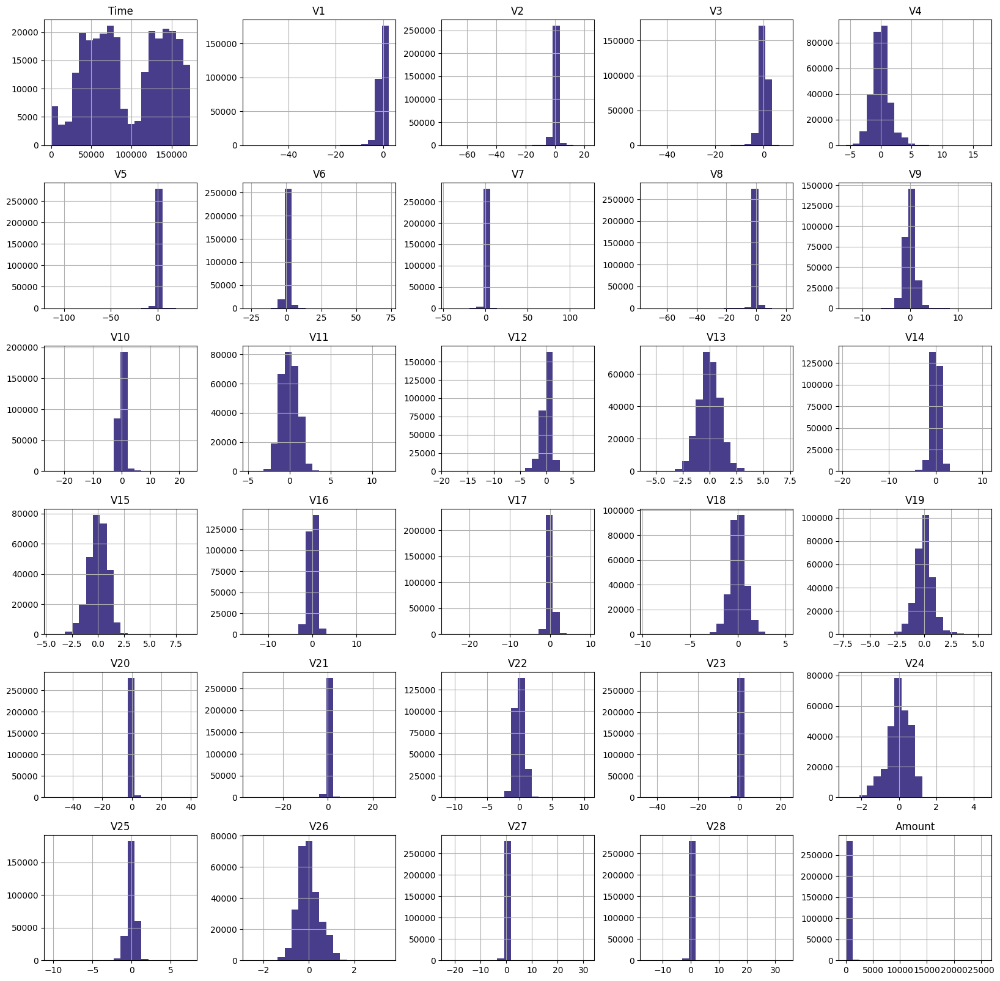

In [479]:
X.hist(figsize=(20,20),bins=20,color='#483D8B')
plt.show()

The histograms show the distribution of each feature in the dataset. Most features (V1–V28) are centered around zero and follow a roughly normal distribution, which is expected after PCA transformation. The Amount and Time features are skewed, indicating most transactions are low in value and occur in specific time periods

<Axes: xlabel='Time', ylabel='Count'>

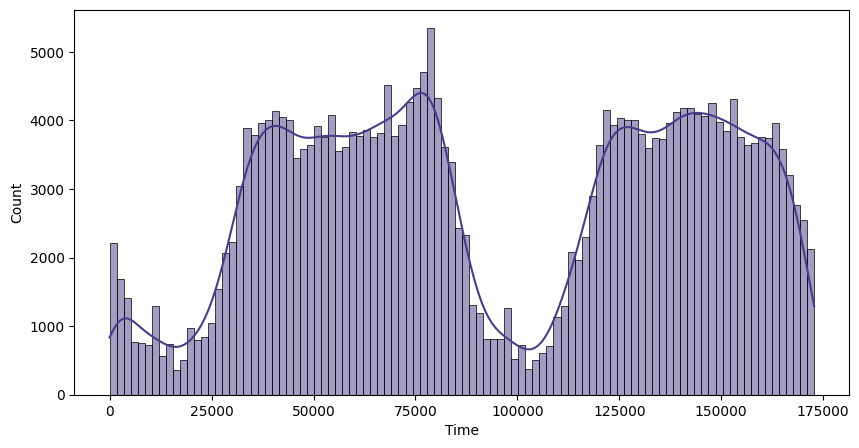

In [480]:
plt.figure(figsize=(10,5))
sns.histplot(X['Time'],kde=True,bins=100,color='#483D8B')

The distribution of Time **shows multiple peaks**, indicating that transactions occur in specific time intervals rather than uniformly throughout the day.

<Axes: xlabel='Amount', ylabel='Count'>

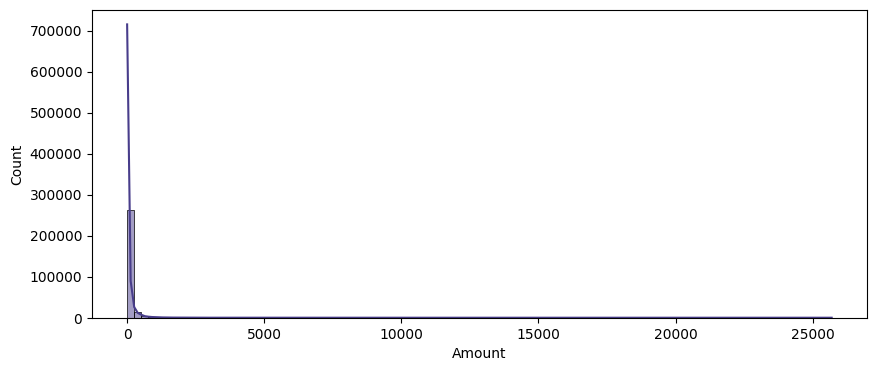

In [481]:
plt.figure(figsize=(10,4))
sns.histplot(X['Amount'],kde=True,bins=100,color='#483D8B')

The Amount distribution is **highly right-skewed**, meaning most transactions are of low value, with a few high-value outliers.

In [482]:
skewed_features = X.skew().sort_values(ascending=False)
skewed_features

,0
Amount,16.977724
V28,11.192091
V21,3.592991
V7,2.553907
V6,1.826581
V10,1.187141
V4,0.676292
V26,0.576693
V9,0.554680
V11,0.356506


In [483]:
Q75=X.quantile(0.75)
Q25=X.quantile(0.25)
IQR=Q75-Q25
min_point= Q25- IQR*1.5
max_point= Q75+ IQR*1.5
Outliers=((X<min_point)|(X>max_point))
print(Outliers.sum())

Time          0
V1         7062
V2        13526
V3         3363
V4        11148
V5        12295
V6        22965
V7         8948
V8        24134
V9         8283
V10        9496
V11         780
V12       15348
V13        3368
V14       14149
V15        2894
V16        8184
V17        7420
V18        7533
V19       10205
V20       27770
V21       14497
V22        1317
V23       18541
V24        4774
V25        5367
V26        5596
V27       39163
V28       30342
Amount    31904
dtype: int64


Based on the IQR method, several features contain a large number of outliers, especially V27, V28, Amount, and V20. This is expected in fraud detection datasets, as abnormal transactions often deviate significantly from typical patterns. These outliers should not be removed blindly, as they may represent fraudulent behavior and are potentially valuable for anomaly detection models.

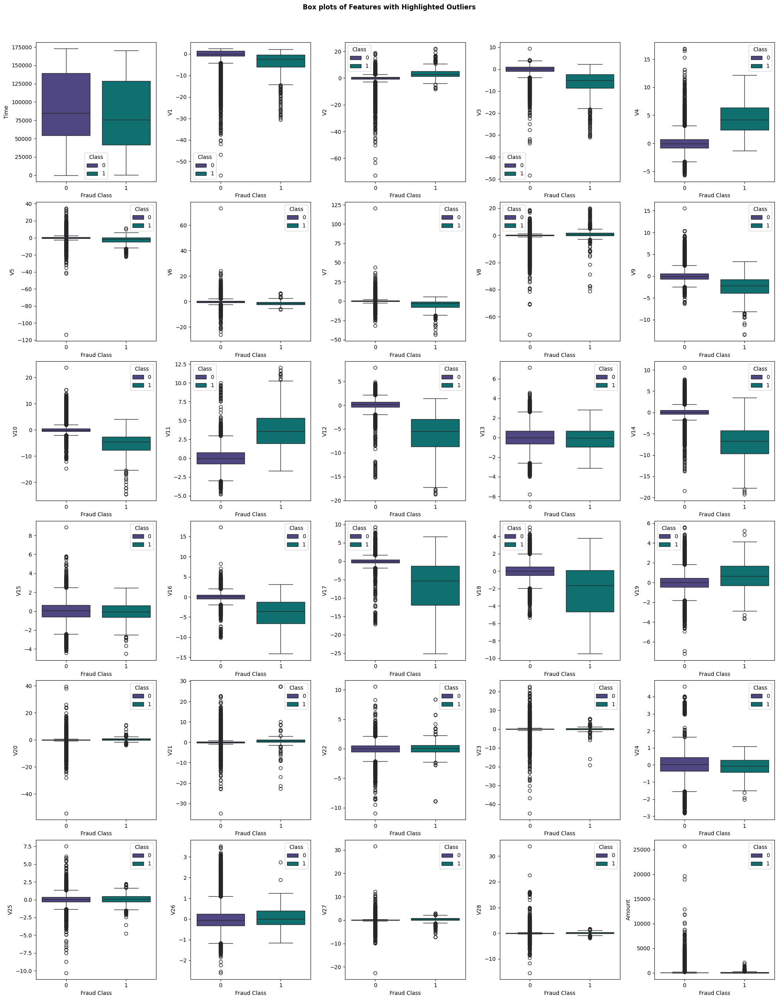

In [484]:
fig,ax=plt.subplots(6,5,figsize=(20,25))
ax=ax.flatten()

for r,c in enumerate(creditcard.columns[:-1]):
    sns.boxplot(data=creditcard,x='Class',ax=ax[r],hue='Class',y=c,palette=['#483D8B','#008080'])
    ax[r].set_xlabel('Fraud Class')


fig.suptitle('Box plots of Features with Highlighted Outliers',weight='bold',y=1.02)
fig.tight_layout(h_pad=0.3)
plt.show()

Boxplots reveal that features like (V4, V10, V12, V14, and Amount) have significant distribution differences between fraudulent and non-fraudulent transactions. Additionally, a high presence of outliers—especially in fraudulent cases—suggests that anomalies in feature values can be strong indicators of fraud.

Text(0.5, 1.0, 'Correlation Matrix')

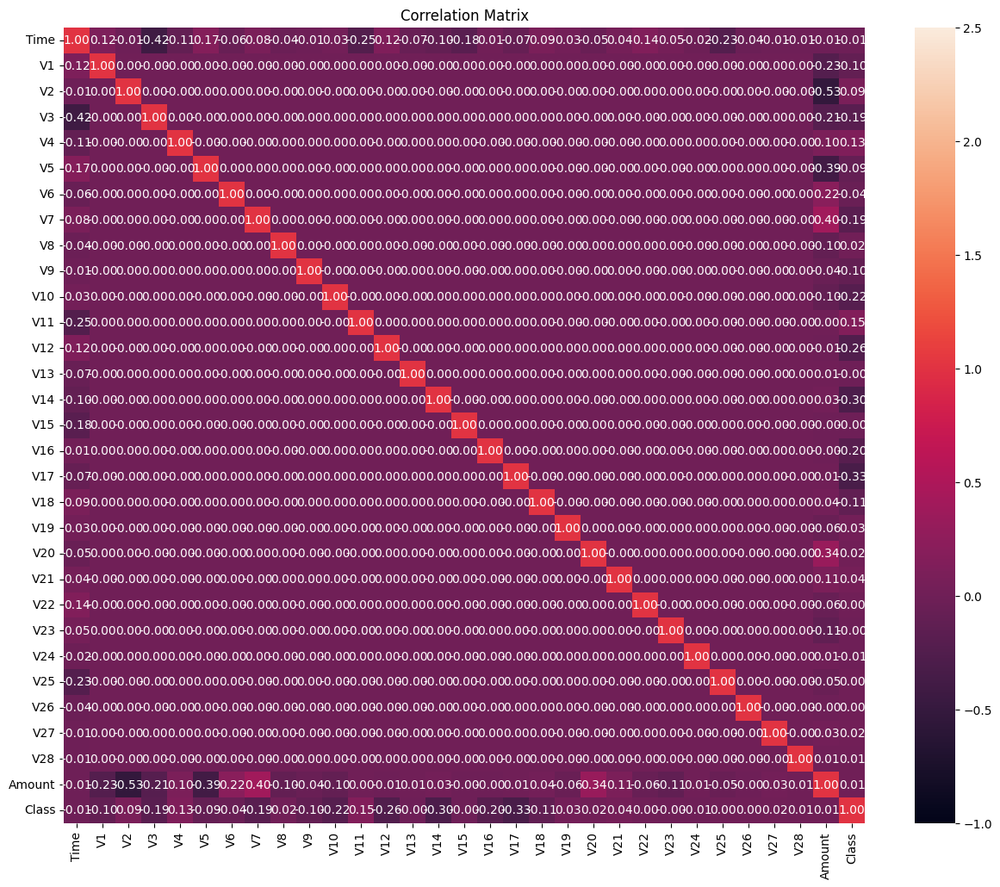

In [485]:
plt.figure(figsize=(15,12))
sns.heatmap(creditcard.corr(),annot=True,fmt=".2f", vmin=-1, vmax=2.5)
plt.title('Correlation Matrix')

In [486]:
threshold = 0.9
FeaturesCorr=X.corr().abs()
for feature in FeaturesCorr.columns:

    high_corr = FeaturesCorr[feature][(FeaturesCorr[feature] > threshold) & (FeaturesCorr[feature] < 1)].index.tolist()

high_corr

[]

Since these components are derived from PCA, it is expected that they are uncorrelated, as PCA transforms the original features into a new set of linearly uncorrelated components.

**NO**
features in the dataset have a correlation higher than 0.9 with each other.

# Class Distribution

Text(0.5, 1.0, 'Class Distribution')

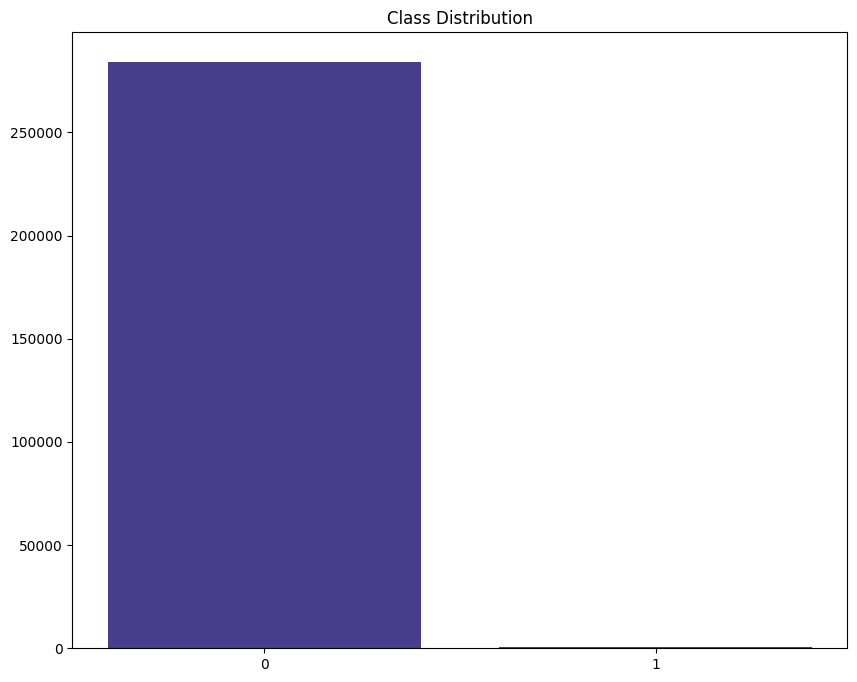

In [487]:
fig,ax=plt.subplots(figsize=(10,8))
ax.bar(y.unique(),y.value_counts(),color='#483D8B')
ax.set_xticks(y.unique())
ax.set_title('Class Distribution')

In [488]:
y.value_counts()

,count
Class,
0,284315
1,492


Text(0.5, 1.0, 'Class Distribution')

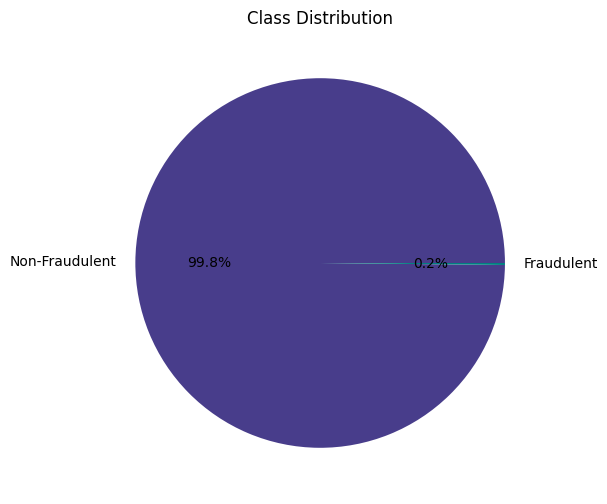

In [489]:
plt.figure(figsize=(8,6))
plt.pie(y.value_counts(),labels=['Non-Fraudulent','Fraudulent'],autopct='%1.1f%%',colors=['#483D8B','#008080'])
plt.title('Class Distribution')

The dataset **is highly imbalanced** , with approximately  **99.8%** of the transactions labeled as *non-fraudulent* and only**0.2%**as *fraudulent*. This class imbalance must be addressed before training a model to avoid biased predictions.

In [490]:
percentage = (y.value_counts() / len(y))*100
print(max(percentage)-min(percentage))

99.65450287387598


The difference between the class percentages is 99.6, highlighting a severe class imbalance in the dataset

Number of components to retain 90% variance: 27


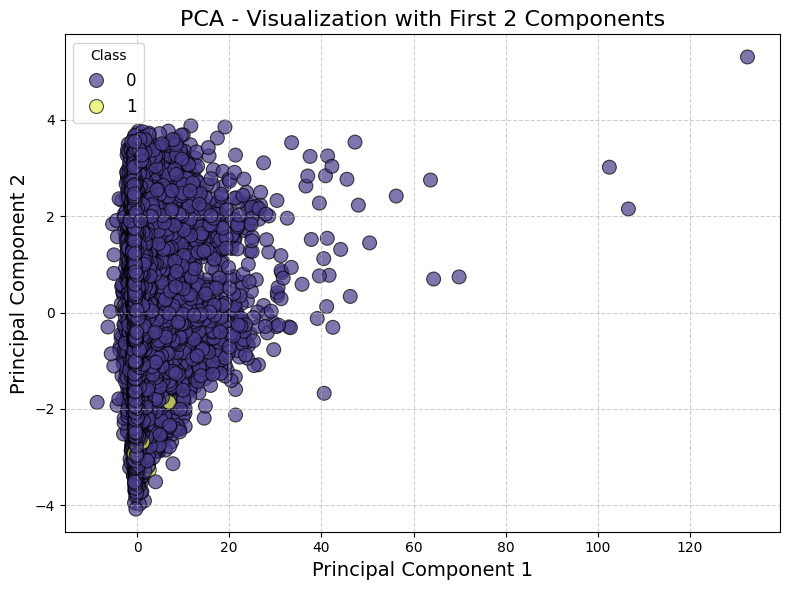

In [491]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)


pca = PCA(n_components=0.93)
X_pca = pca.fit_transform(X_scaled)
print("Number of components to retain 90% variance:" ,pca.n_components_)
pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i+1}' for i in range(pca.n_components_)])
pca_df['Label'] = y.values


plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Label', palette=['#483D8B','#E7F255'], s=100, alpha=0.7, edgecolor='k', marker='o')
plt.title('PCA - Visualization with First 2 Components', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=14)
plt.ylabel('Principal Component 2', fontsize=14)
plt.legend(title='Class', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



PCA plot showing the data in 2D using the top two principal components. Points are colored by true class labels: blue for Class 0 and orange for Class 1. The goal here is only visualization as part of EDA, not actual dimensionality reduction for modeling

The PCA visualization reveals a highly imbalanced dataset, with Class 0 overwhelmingly more frequent than Class 1. Additionally, there is no clear linear separation between the two classes in the reduced 2D space, suggesting that more complex or non-linear models may be needed for effective classification

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11392 samples in 0.002s...
[t-SNE] Computed neighbors for 11392 samples in 0.279s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11392
[t-SNE] Computed conditional probabilities for sample 2000 / 11392
[t-SNE] Computed conditional probabilities for sample 3000 / 11392
[t-SNE] Computed conditional probabilities for sample 4000 / 11392
[t-SNE] Computed conditional probabilities for sample 5000 / 11392
[t-SNE] Computed conditional probabilities for sample 6000 / 11392
[t-SNE] Computed conditional probabilities for sample 7000 / 11392
[t-SNE] Computed conditional probabilities for sample 8000 / 11392
[t-SNE] Computed conditional probabilities for sample 9000 / 11392
[t-SNE] Computed conditional probabilities for sample 10000 / 11392
[t-SNE] Computed conditional probabilities for sample 11000 / 11392
[t-SNE] Computed conditional probabilities for sample 11392 / 11392
[t-SNE] Mean sigma: 138.415660
[t-SNE] KL divergen

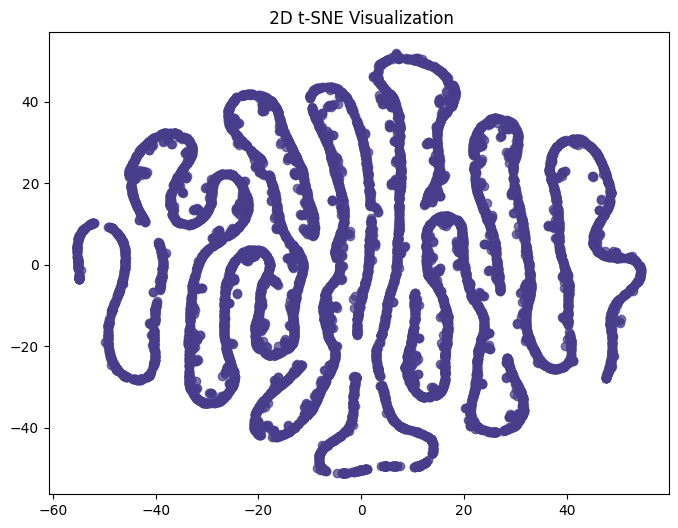

In [492]:
X_sample, _ = train_test_split(X, train_size=0.04, random_state=42, stratify=y)

tsne=TSNE(n_components=2,random_state=42,perplexity=30,max_iter=500,verbose=1)
X_tsne=tsne.fit_transform(X_sample)


plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.7,color='#483D8B')
plt.title(' 2D t-SNE Visualization')
ax.set_xlabel('TSNE Component 1')
ax.set_ylabel('TSNE Component 2')
plt.show()

# Preprocessing

Split

In [493]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)
#stratify=y ensures that the split maintains the same distribution of labels as in y

Although the task is unsupervised, I split the data into training and testing sets to ensure fair evaluation of the algorithms and avoid data leakage. This allows me to fit transformations like scaling and PCA only on the training data and then apply them to the test set, simulating how the model would perform on unseen data. It is especially important when applying anomaly detection techniques like One-Class SVM and Isolation Forest, which assume the training data represents the normal behavior.

**Feature Engineering**

In [494]:
#X['Hours']=(X['Time']//3600)%24

In [495]:
'''fraud_per_hour= X[y==1].groupby(X['Hours']).size()# Count fraud cases per hour
fraud_counts=fraud_per_hour.to_dict()
X['FraudCounts']=X['Hours'].map(fraud_counts).fillna(0)

for hour, count in sorted(fraud_per_hour.items()):
    print(f"Hour {hour}: {count} Fraudulent Transactions")

plt.figure(figsize=(10,6))
sns.barplot(x=X['Hours'].unique(),y=fraud_per_hour.values)
plt.title('Fraudulent Transactions per Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Fraudulent Transactions')
plt.show()'''

'fraud_per_hour= X[y==1].groupby(X[\'Hours\']).size()# Count fraud cases per hour\nfraud_counts=fraud_per_hour.to_dict()\nX[\'FraudCounts\']=X[\'Hours\'].map(fraud_counts).fillna(0)\n\nfor hour, count in sorted(fraud_per_hour.items()):\n    print(f"Hour {hour}: {count} Fraudulent Transactions")\n\nplt.figure(figsize=(10,6))\nsns.barplot(x=X[\'Hours\'].unique(),y=fraud_per_hour.values)\nplt.title(\'Fraudulent Transactions per Hour\')\nplt.xlabel(\'Hour of the Day\')\nplt.ylabel(\'Number of Fraudulent Transactions\')\nplt.show()'

We initially considered adding a feature representing the number of fraud cases per hour (FraudCounts). However, since this feature would be derived using the target labels (y), it introduces the risk of data leakage. Using such a feature would allow the model to indirectly access information about the target during training, which can lead to overly optimistic results and poor generalization.
Therefore, we decided not to include this feature to maintain the integrity of the unsupervised learning process.

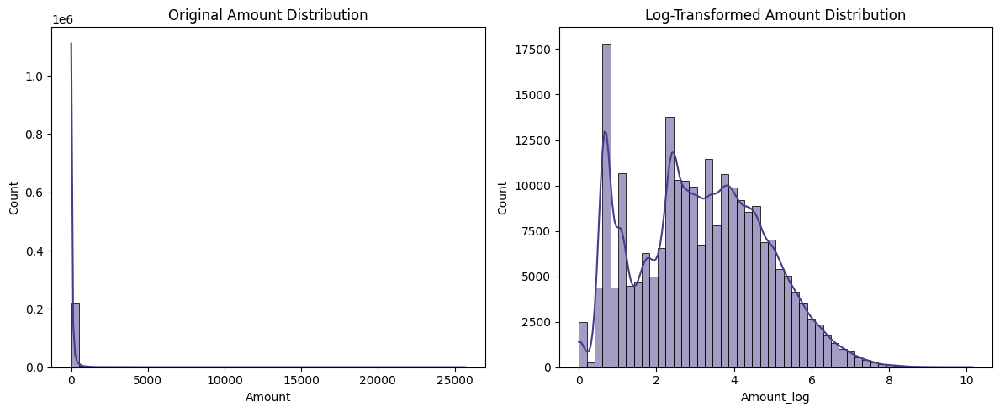

In [496]:
# Apply log transformation to the Amount column
X_train['Amount_log'] = np.log1p(X_train['Amount'])
X_test['Amount_log'] = np.log1p(X_test['Amount'])


# Plot original and transformed distributions
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
sns.histplot(X_train['Amount'], bins=50, kde=True,color='#483D8B')
plt.title('Original Amount Distribution')

plt.subplot(1, 2, 2)
sns.histplot(X_train['Amount_log'], bins=50, kde=True,color='#483D8B')
plt.title('Log-Transformed Amount Distribution')

plt.tight_layout()
plt.show()

We applied a log1p transformation to the Amount feature to reduce right skewness and make the distribution more normal-like, which can help with model performance. Since this new feature is mathematically derived from the original, **it may cause multicollinearity**. We will later check for multicollinearity before deciding whether to drop the original Amount feature.



In [497]:
X_train[['Amount','Amount_log']].corr()

,Amount,Amount_log
Amount,1.000000,0.548568
Amount_log,0.548568,1.000000


We created a log-transformed version of the Amount feature (Amount_log) to reduce skewness. After evaluating both features in a separate notebook — including clustering metrics and anomaly detection performance — we found that the results were nearly identical.
Additionally, a correlation check showed no strong multicollinearity between Amount and Amount_log.
Therefore, we decided to keep only one to avoid redundancy, while noting that using either will not negatively affect model performance.

In [498]:
# Compute median and IQR for 'Amount'
median_amount = X_train['Amount'].median()
iqr = X_train['Amount'].quantile(0.75) - X_train['Amount'].quantile(0.25)


X_train['Amount_to_Median_Ratio'] = X_train['Amount'] / (median_amount + 1e-6)  # Avoid division by zero
X_test['Amount_to_Median_Ratio'] = X_test['Amount'] / (median_amount + 1e-6)


X_train['Amount_IQR_Normalized'] = (X_train['Amount'] - median_amount) / (iqr + 1e-6)
X_test['Amount_IQR_Normalized'] = (X_test['Amount'] - median_amount) / (iqr + 1e-6)

/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1016: RuntimeWarning:

invalid value encountered in subtract



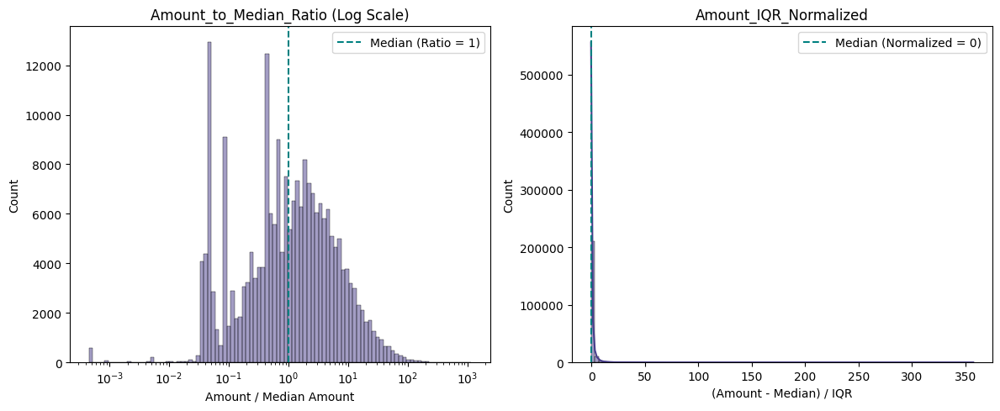

In [499]:

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(X_train['Amount_to_Median_Ratio'], bins=100, kde=True, log_scale=True,color='#483D8B')
plt.axvline(x=1, color='#008080', linestyle='--', label='Median (Ratio = 1)')
plt.title('Amount_to_Median_Ratio (Log Scale)')
plt.xlabel('Amount / Median Amount')
plt.legend()


plt.subplot(1, 2, 2)
sns.histplot(X_train['Amount_IQR_Normalized'], bins=100, kde=True,color='#483D8B')
plt.axvline(x=0, color='#008080', linestyle='--', label='Median (Normalized = 0)')
plt.title('Amount_IQR_Normalized')
plt.xlabel('(Amount - Median) / IQR')
plt.legend()

plt.tight_layout()
plt.show()

1. Amount_to_Median_Ratio

Why This Feature?

Captures Relative Scale:

Fraudulent transactions often deviate significantly from typical spending amounts.

Dividing by the median (instead of mean) makes the feature robust to outliers.

Unsupervised-Friendly:

Does not require labeled fraud data.

Highlights transactions that are abnormally large or small compared to the median.

Interpretation:

Ratio ≈ 1: Transaction is close to the median (normal behavior).

Ratio ≫ 1: Unusually large transaction (potential fraud).

Ratio ≪ 1: Unusually small transaction (may indicate test transactions or errors).

Example:

If the median transaction is $50, a $500 transaction has a ratio of 10, flagging it as anomalous.



2. Amount_IQR_Normalized

Why This Feature?

Standardizes Deviations:

Measures how far a transaction is from the median, scaled by the IQR (a robust measure of spread).

Better than Z-score (which uses mean/std) because it’s resistant to outliers.

Anomaly Detection:

Values beyond ±3 are statistically rare (3×IQR rule).

Fraud often falls in these extremes.

Interpretation:

Value ≈ 0: Transaction is near the median (normal).

Value > +3: Extremely high amount (possible fraud).

Value < -3: Extremely low amount (may be suspicious).


**Fix skewness**

In [500]:
X_train_skewed_features = X_train.skew().sort_values(ascending=False)

In [501]:
skewed_features2=X_train_skewed_features[abs(X_train_skewed_features.values)>0.75]
print(skewed_features2)
skewed_features2=skewed_features2.index

Amount                    18.193943
Amount_IQR_Normalized     18.193943
Amount_to_Median_Ratio    18.193943
V28                        9.978409
V21                        3.490183
V7                         3.152665
V6                         1.937381
V10                        1.132688
V27                       -0.890209
V16                       -1.077909
V20                       -1.960492
V14                       -1.969112
V3                        -2.247962
V12                       -2.286654
V5                        -2.786851
V1                        -3.306334
V17                       -3.733377
V2                        -4.779484
V23                       -6.258558
V8                        -8.639485
dtype: float64


In [502]:
yj=PowerTransformer(method='yeo-johnson')

X_train[skewed_features2] =yj.fit_transform(X_train[skewed_features2])
X_test[skewed_features2] =yj.transform(X_test[skewed_features2])

In [503]:
'''qt = QuantileTransformer(output_distribution='normal', random_state=42)
X_train[skewed_features2] =qt.fit_transform(X_train[skewed_features2])

#just apply the transform on the X_test
X_test[skewed_features2] =qt.transform(X_test[skewed_features2])'''

"qt = QuantileTransformer(output_distribution='normal', random_state=42)\nX_train[skewed_features2] =qt.fit_transform(X_train[skewed_features2])\n\n#just apply the transform on the X_test\nX_test[skewed_features2] =qt.transform(X_test[skewed_features2])"

In [504]:
X_train.skew().sort_values(ascending=False)

,0
V27,3.731696
V7,2.883669
V8,2.382707
V28,1.320690
V4,0.687574
V26,0.574980
V9,0.541869
Amount_IQR_Normalized,0.417497
V11,0.354102
V2,0.336876


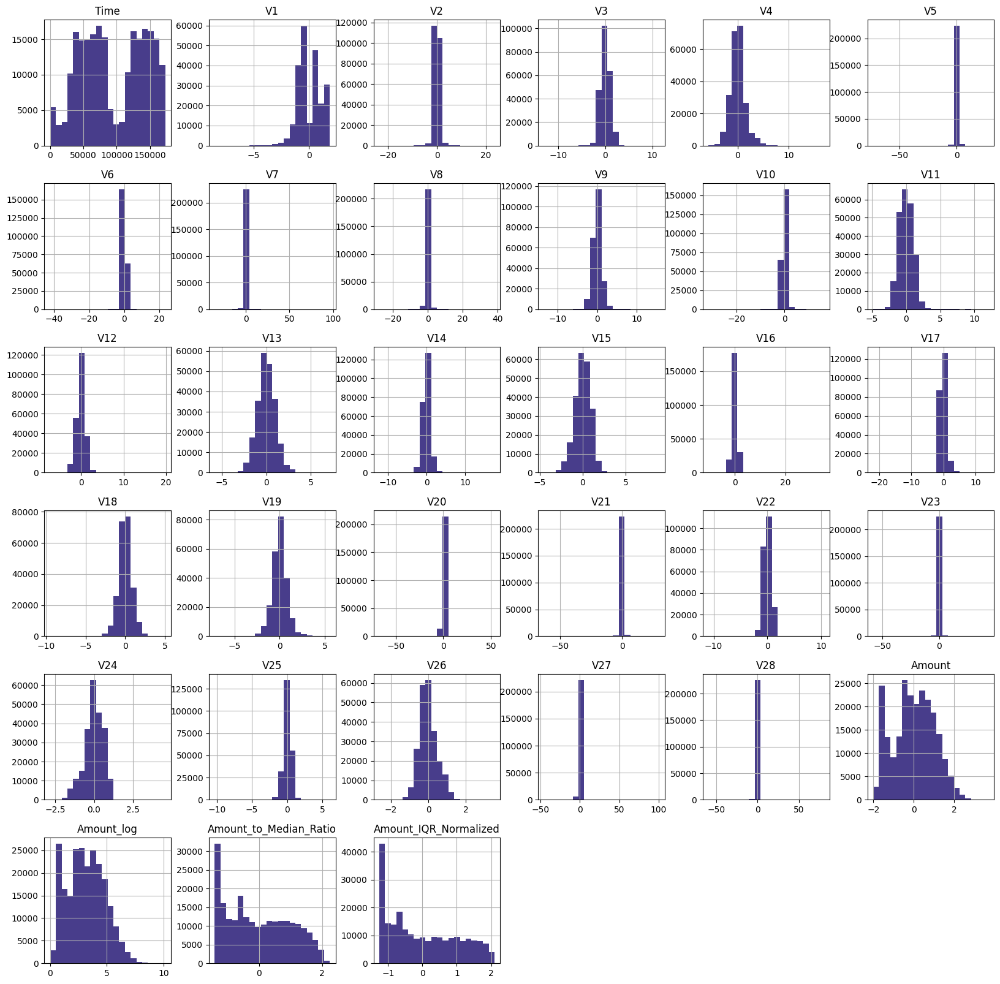

In [505]:
X_train.hist(figsize=(20,20),bins=20,color='#483D8B')
plt.show()

our first approach:
Initially, the dataset showed significant skewness in several features, especially Amount and some PCA components. To address this, **the Yeo-Johnson** transformation was applied, as it can handle both positive and negative values unlike log-transformations.

While this reduced skewness for many features, *some variables remained
non-Gaussian and showed heavy tails* . Therefore, a **Quantile Transformer** was
subsequently applied to map the data to a uniform distribution and then approximate a normal distribution.

This two-step transformation significantly improved feature distributions, making them more suitable for clustering and anomaly detection models.

then we only use **Quantile Transformer** that imporved feature distributions.

# Scaling

In [506]:
scaler=StandardScaler()
X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# PCA

In [507]:
pca=PCA().fit(X_train_scaled)

In [508]:
eigenvalues=pca.explained_variance_
eigenvalues

array([4.38514859e+00, 1.82138293e+00, 1.36742666e+00, 1.31200009e+00,
       1.15199619e+00, 1.11101829e+00, 1.07658362e+00, 1.06520464e+00,
       1.03946982e+00, 1.03791390e+00, 1.02476316e+00, 1.01970783e+00,
       1.01553877e+00, 1.00640930e+00, 1.00266716e+00, 1.00105089e+00,
       9.98227060e-01, 9.95682470e-01, 9.94890408e-01, 9.89472264e-01,
       9.80563976e-01, 9.67007663e-01, 9.49773076e-01, 9.30713136e-01,
       8.95058947e-01, 7.98185722e-01, 7.28926089e-01, 6.40247777e-01,
       3.31227257e-01, 3.25550310e-01, 3.55851599e-02, 6.54100204e-04,
       9.75983364e-05])

pca.explained_variance_ returns the **eigenvalues** corresponding to each principal component. These values represent the **amount of variance** captured by each component in the transformed feature space.

This means:
- The **first principal component** captures 3.62 units of variance from the original data.
- The **second principal component** captures 2.21 units.
- The **third principal component** captures 1.98 units, and so on.

Larger eigenvalues indicate that the component explains more variability in the data. PCA arranges components in decreasing order of these values, so the first components are the most informative. These eigenvalues are also used to compute the explained variance ratio, which helps in selecting the number of components to retain.




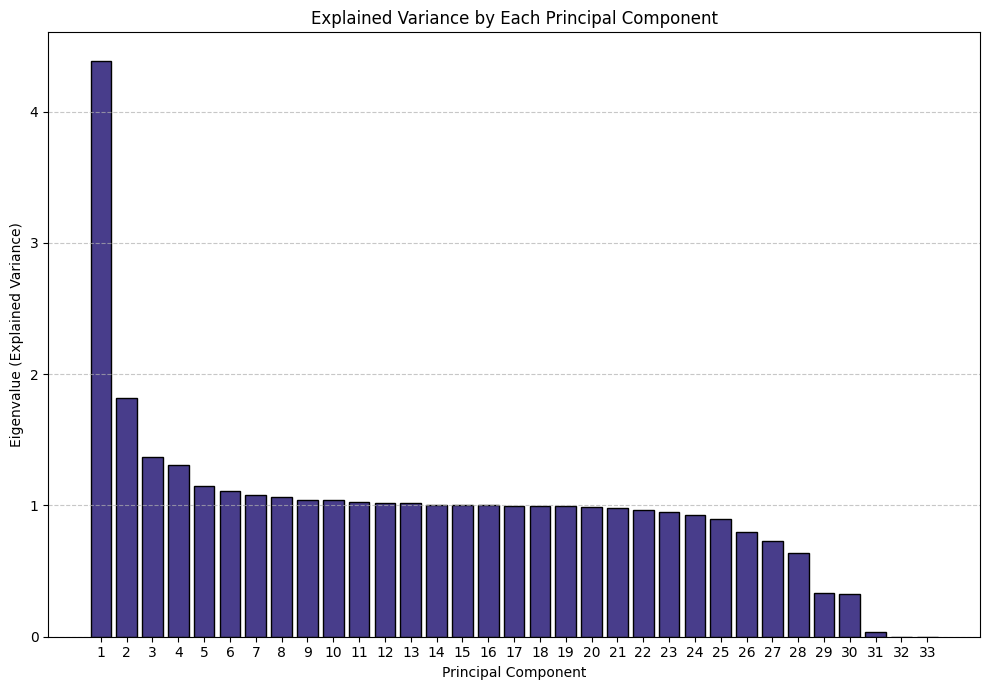

In [509]:
components = np.arange(1, len(eigenvalues) + 1)

plt.figure(figsize=(10, 7))
plt.bar(components, eigenvalues, color='#483D8B', edgecolor='black')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue (Explained Variance)')
plt.title('Explained Variance by Each Principal Component')
plt.xticks(components)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [510]:
cumulativeVariance=np.cumsum(pca.explained_variance_ratio_)#This line calculates the cumulative sum of the variance explained by each principal component in PCA
cumulativeVariance

array([0.13288271, 0.18807589, 0.22951288, 0.26927028, 0.3041791 ,
       0.33784618, 0.37046978, 0.40274857, 0.43424751, 0.46569931,
       0.4967526 , 0.52765271, 0.55842647, 0.58892359, 0.61930731,
       0.64964205, 0.67989122, 0.71006329, 0.74021135, 0.77019523,
       0.79990916, 0.82921229, 0.85799317, 0.88619647, 0.91331935,
       0.93750669, 0.95959526, 0.97899662, 0.98903377, 0.99889889,
       0.99997722, 0.99999704, 1.        ])

The goal is to calculate the total variance explained by the first n principal components, helping decide how many components are needed to capture a desired percentage of the total variance.

In [511]:
n_components=np.argmax(cumulativeVariance>=0.93)+1 #Determines the number of principal components needed to retain at least 93% of the cumulative variance in PCA
print('The number of principal component is:' ,n_components)

The number of principal component is: 26


The number of principal components was set to 25, based on the analysis of the explained variance ratio, where it was observed that the first 25 components account for a significant portion of the total variance in the data. Additionally, the eigenvalues of these components were relatively high compared to the subsequent components, supporting the selection of this number as a sufficiently representative set without losing important information.

In [512]:
plt.figure(figsize=(10,6))
fig = go.Figure()
#cumulative variance plot
fig.add_trace(go.Scatter(x=list(range(1, len(cumulativeVariance) + 1)),
                         y=cumulativeVariance,
                         mode='markers+lines',
                         name='Cumulative Variance',
                         marker=dict(color='#483D8B')
                        ))

# Add the 95% threshold line
fig.add_trace(go.Scatter(x=[1, len(cumulativeVariance)],
                         y=[0.93, 0.93],
                         mode='lines',
                         name='93% Threshold',
                         line=dict(dash='dash'),
                         marker=dict(color='#E7F255')
                        ))


fig.update_layout(
    title="Cumulative Variance vs Number of Principal Components",
    xaxis_title="Number of Principal Components",
    yaxis_title="Cumulative Variance Percentage",
    template="plotly_dark",
    showlegend=True
)

fig.show()


<Figure size 1000x600 with 0 Axes>

In [513]:
print(X_train_scaled.shape)

(227845, 33)


In [514]:
pca2=PCA(n_components=n_components)
X_train_pca=pca2.fit_transform(X_train_scaled)
X_test_pca=pca2.transform(X_test_scaled)

In [515]:
print(X_train_pca.shape)

(227845, 26)


After applying PCA, the number of principal components was reduced while retaining 93% of the cumulative variance, resulting in a more efficient representation of the data with fewer dimensions

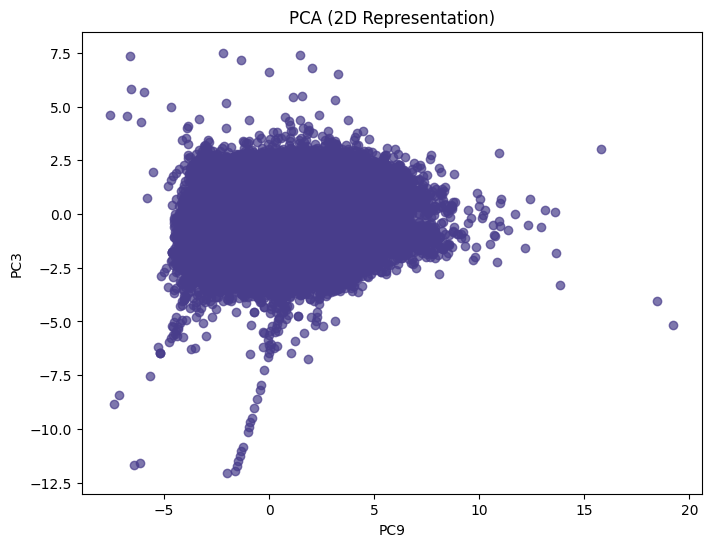

In [516]:
plt.figure(figsize=(8,6))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], alpha=0.7,color='#483D8B')# the components are chosen randomly
plt.title('PCA (2D Representation)')
plt.xlabel('PC9')
plt.ylabel('PC3')
plt.show()

# SMOTE ALGO

What is SMOTE?  

SMOTE (Synthetic Minority Over-sampling Technique) is a technique used to address class imbalance by creating synthetic examples of the minority class instead of just duplicating them.

We use the Smote algo because our dataset is highly imbalanced cause most models to be biased toward the majority class(Non-Fraudulent).

The requirements for this algo :

1-) Labeled classification task:Must have imbalanced labels (with y_train showing minority and majority classes).

2-)

In [517]:
y_train.value_counts()

,count
Class,
0,227451
1,394


In [518]:
print("Before SMOTE:", Counter(y_train))

#Apply SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_pca, y_train)

# Check new class distribution
print("After SMOTE:", Counter(y_train_res))

Before SMOTE: Counter({0: 227451, 1: 394})
After SMOTE: Counter({0: 227451, 1: 227451})


Text(0.5, 1.0, 'Class Distribution')

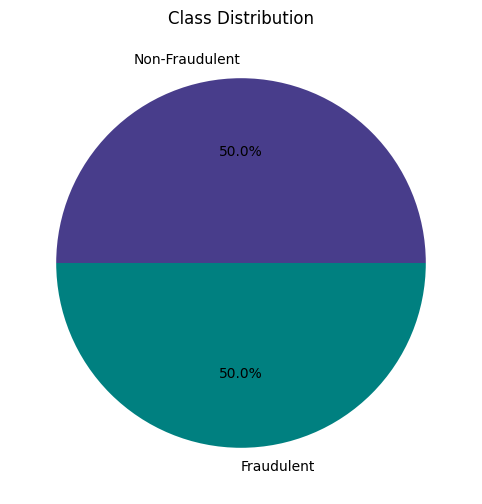

In [519]:
plt.figure(figsize=(8,6))
plt.pie(y_train_res.value_counts(),labels=['Non-Fraudulent','Fraudulent'],autopct='%1.1f%%',colors=['#483D8B','#008080'])
plt.title('Class Distribution')

In [520]:
'''strategies = [0.4,0.5,0.6,0.7,0.8,'auto']




for strategy in strategies:
    print(f"\n===== Sampling Strategy: {strategy} =====")


    smote = SMOTE(sampling_strategy=strategy, random_state=42, k_neighbors=7)
    X_res, y_res = smote.fit_resample(X_train_scaled, y_train)


    clf = LogisticRegression(random_state=42)
    clf.fit(X_res, y_res)


    y_pred = clf.predict(X_test_scaled)

    print(classification_report(y_test, y_pred, digits=4))

    #--------------------------------------------------------------------
# We want to define values for the k_neighbors hyperparameter and sampling_strategy
strategies = [0.4, 0.5, 0.6, 0.7, 0.8, 'auto']
k_values = [3, 5, 7, 9]

for k in k_values:
    print(f"\n======================")
    print(f"Testing k_neighbors = {k}")

    for strategy in strategies:
        print(f"\n--- Sampling Strategy: {strategy} ---")

        # Apply SMOTE with current k and strategy
        smote = SMOTE(sampling_strategy=strategy, random_state=42, k_neighbors=k)
        X_res, y_res = smote.fit_resample(X_train_scaled, y_train)

        print("Resampled Class Distribution:", Counter(y_res))

        # Train Logistic Regression
        clf = RandomForestClassifier(n_estimators=30,max_depth=10,random_state=42, n_jobs=-1)
        clf.fit(X_res, y_res)

        # Predict and evaluate
        y_pred = clf.predict(X_test_scaled)
        print(classification_report(y_test, y_pred, digits=4))'''

'strategies = [0.4,0.5,0.6,0.7,0.8,\'auto\']\n\n\n\n\nfor strategy in strategies:\n    print(f"\n===== Sampling Strategy: {strategy} =====")\n\n\n    smote = SMOTE(sampling_strategy=strategy, random_state=42, k_neighbors=7)\n    X_res, y_res = smote.fit_resample(X_train_scaled, y_train)\n\n\n    clf = LogisticRegression(random_state=42)\n    clf.fit(X_res, y_res)\n\n\n    y_pred = clf.predict(X_test_scaled)\n\n    print(classification_report(y_test, y_pred, digits=4))\n\n    #--------------------------------------------------------------------\n# We want to define values for the k_neighbors hyperparameter and sampling_strategy\nstrategies = [0.4, 0.5, 0.6, 0.7, 0.8, \'auto\']\nk_values = [3, 5, 7, 9]\n\nfor k in k_values:\n    print(f"\n======================")\n    print(f"Testing k_neighbors = {k}")\n\n    for strategy in strategies:\n        print(f"\n--- Sampling Strategy: {strategy} ---")\n\n        # Apply SMOTE with current k and strategy\n        smote = SMOTE(sampling_strategy

======================
Testing k_neighbors = 3

--- Sampling Strategy: 0.4 ---
Resampled Class Distribution: Counter({0: 227451, 1: 90980})
              precision    recall  f1-score   support

           0     0.9997    0.9995    0.9996     56864
           1     0.7297    0.8265    0.7751        98

    accuracy                         0.9992     56962
   macro avg     0.8647    0.9130    0.8874     56962
weighted avg     0.9992    0.9992    0.9992     56962


--- Sampling Strategy: 0.5 ---
Resampled Class Distribution: Counter({0: 227451, 1: 113725})
              precision    recall  f1-score   support

           0     0.9996    0.9996    0.9996     56864
           1     0.7723    0.7959    0.7839        98

    accuracy                         0.9992     56962
   macro avg     0.8860    0.8978    0.8918     56962
weighted avg     0.9993    0.9992    0.9993     56962


--- Sampling Strategy: 0.6 ---
Resampled Class Distribution: Counter({0: 227451, 1: 136470})
              precision    recall  f1-score   support

           0     0.9996    0.9995    0.9996     56864
           1     0.7222    0.7959    0.7573        98

    accuracy                         0.9991     56962
   macro avg     0.8609    0.8977    0.8784     56962
weighted avg     0.9992    0.9991    0.9991     56962


--- Sampling Strategy: 0.7 ---
Resampled Class Distribution: Counter({0: 227451, 1: 159215})
              precision    recall  f1-score   support

           0     0.9997    0.9991    0.9994     56864
           1     0.6172    0.8061    0.6991        98

    accuracy                         0.9988     56962
   macro avg     0.8084    0.9026    0.8493     56962
weighted avg     0.9990    0.9988    0.9989     56962


--- Sampling Strategy: 0.8 ---
Resampled Class Distribution: Counter({0: 227451, 1: 181960})
              precision    recall  f1-score   support

           0     0.9998    0.9990    0.9994     56864
           1     0.6000    0.8571    0.7059        98

    accuracy                         0.9988     56962
   macro avg     0.7999    0.9281    0.8526     56962
weighted avg     0.9991    0.9988    0.9989     56962


--- Sampling Strategy: auto ---
Resampled Class Distribution: Counter({0: 227451, 1: 227451})
              precision    recall  f1-score   support

           0     0.9997    0.9988    0.9993     56864
           1     0.5503    0.8367    0.6640        98

    accuracy                         0.9985     56962
   macro avg     0.7750    0.9178    0.8316     56962
weighted avg     0.9989    0.9985    0.9987     56962


======================
Testing k_neighbors = 5

--- Sampling Strategy: 0.4 ---
Resampled Class Distribution: Counter({0: 227451, 1: 90980})
              precision    recall  f1-score   support

           0     0.9997    0.9995    0.9996     56864
           1     0.7593    0.8367    0.7961        98

    accuracy                         0.9993     56962
   macro avg     0.8795    0.9181    0.8979     56962
weighted avg     0.9993    0.9993    0.9993     56962


--- Sampling Strategy: 0.5 ---
Resampled Class Distribution: Counter({0: 227451, 1: 113725})
              precision    recall  f1-score   support

           0     0.9997    0.9995    0.9996     56864
           1     0.7431    0.8265    0.7826        98

    accuracy                         0.9992     56962
   macro avg     0.8714    0.9130    0.8911     56962
weighted avg     0.9993    0.9992    0.9992     56962


--- Sampling Strategy: 0.6 ---
Resampled Class Distribution: Counter({0: 227451, 1: 136470})
              precision    recall  f1-score   support

           0     0.9997    0.9991    0.9994     56864
           1     0.6241    0.8469    0.7186        98

    accuracy                         0.9989     56962
   macro avg     0.8119    0.9230    0.8590     56962
weighted avg     0.9991    0.9989    0.9989     56962


--- Sampling Strategy: 0.7 ---
Resampled Class Distribution: Counter({0: 227451, 1: 159215})
              precision    recall  f1-score   support

           0     0.9997    0.9990    0.9994     56864
           1     0.5929    0.8469    0.6975        98

    accuracy                         0.9987     56962
   macro avg     0.7963    0.9230    0.8484     56962
weighted avg     0.9990    0.9987    0.9988     56962


--- Sampling Strategy: 0.8 ---
Resampled Class Distribution: Counter({0: 227451, 1: 181960})
              precision    recall  f1-score   support

           0     0.9997    0.9989    0.9993     56864
           1     0.5608    0.8469    0.6748        98

    accuracy                         0.9986     56962
   macro avg     0.7803    0.9229    0.8370     56962
weighted avg     0.9990    0.9986    0.9987     56962


--- Sampling Strategy: auto ---
Resampled Class Distribution: Counter({0: 227451, 1: 227451})
              precision    recall  f1-score   support

           0     0.9997    0.9983    0.9990     56864
           1     0.4551    0.8265    0.5870        98

    accuracy                         0.9980     56962
   macro avg     0.7274    0.9124    0.7930     56962
weighted avg     0.9988    0.9980    0.9983     56962


======================
Testing k_neighbors = 7

--- Sampling Strategy: 0.4 ---
Resampled Class Distribution: Counter({0: 227451, 1: 90980})
              precision    recall  f1-score   support

           0     0.9997    0.9993    0.9995     56864
           1     0.6780    0.8163    0.7407        98

    accuracy                         0.9990     56962
   macro avg     0.8388    0.9078    0.8701     56962
weighted avg     0.9991    0.9990    0.9991     56962


--- Sampling Strategy: 0.5 ---
Resampled Class Distribution: Counter({0: 227451, 1: 113725})
              precision    recall  f1-score   support

           0     0.9995    0.9994    0.9994     56864
           1     0.6604    0.7143    0.6863        98

    accuracy                         0.9989     56962
   macro avg     0.8299    0.8568    0.8429     56962
weighted avg     0.9989    0.9989    0.9989     56962


--- Sampling Strategy: 0.6 ---
Resampled Class Distribution: Counter({0: 227451, 1: 136470})
              precision    recall  f1-score   support

           0     0.9995    0.9990    0.9992     56864
           1     0.5397    0.6939    0.6071        98

    accuracy                         0.9985     56962
   macro avg     0.7696    0.8464    0.8032     56962
weighted avg     0.9987    0.9985    0.9986     56962


--- Sampling Strategy: 0.7 ---
Resampled Class Distribution: Counter({0: 227451, 1: 159215})
              precision    recall  f1-score   support

           0     0.9997    0.9988    0.9992     56864
           1     0.5359    0.8367    0.6534        98

    accuracy                         0.9985     56962
   macro avg     0.7678    0.9177    0.8263     56962
weighted avg     0.9989    0.9985    0.9986     56962


--- Sampling Strategy: 0.8 ---
Resampled Class Distribution: Counter({0: 227451, 1: 181960})
              precision    recall  f1-score   support

           0     0.9995    0.9983    0.9989     56864
           1     0.4176    0.7245    0.5299        98

    accuracy                         0.9978     56962
   macro avg     0.7086    0.8614    0.7644     56962
weighted avg     0.9985    0.9978    0.9981     56962


--- Sampling Strategy: auto ---
Resampled Class Distribution: Counter({0: 227451, 1: 227451})
              precision    recall  f1-score   support

           0     0.9997    0.9977    0.9987     56864
           1     0.3857    0.8265    0.5260        98

    accuracy                         0.9974     56962
   macro avg     0.6927    0.9121    0.7623     56962
weighted avg     0.9986    0.9974    0.9979     56962


======================
Testing k_neighbors = 9

--- Sampling Strategy: 0.4 ---
Resampled Class Distribution: Counter({0: 227451, 1: 90980})
              precision    recall  f1-score   support

           0     0.9997    0.9995    0.9996     56864
           1     0.7431    0.8265    0.7826        98

    accuracy                         0.9992     56962
   macro avg     0.8714    0.9130    0.8911     56962
weighted avg     0.9993    0.9992    0.9992     56962


--- Sampling Strategy: 0.5 ---
Resampled Class Distribution: Counter({0: 227451, 1: 113725})
              precision    recall  f1-score   support

           0     0.9997    0.9990    0.9994     56864
           1     0.5912    0.8265    0.6894        98

    accuracy                         0.9987     56962
   macro avg     0.7955    0.9128    0.8444     56962
weighted avg     0.9990    0.9987    0.9988     56962


--- Sampling Strategy: 0.6 ---
Resampled Class Distribution: Counter({0: 227451, 1: 136470})
              precision    recall  f1-score   support

           0     0.9997    0.9990    0.9993     56864
           1     0.5857    0.8367    0.6891        98

    accuracy                         0.9987     56962
   macro avg     0.7927    0.9179    0.8442     56962
weighted avg     0.9990    0.9987    0.9988     56962


--- Sampling Strategy: 0.7 ---
Resampled Class Distribution: Counter({0: 227451, 1: 159215})
              precision    recall  f1-score   support

           0     0.9997    0.9985    0.9991     56864
           1     0.4848    0.8163    0.6084        98

    accuracy                         0.9982     56962
   macro avg     0.7423    0.9074    0.8037     56962
weighted avg     0.9988    0.9982    0.9984     56962


--- Sampling Strategy: 0.8 ---
Resampled Class Distribution: Counter({0: 227451, 1: 181960})
              precision    recall  f1-score   support

           0     0.9997    0.9983    0.9990     56864
           1     0.4659    0.8367    0.5985        98

    accuracy                         0.9981     56962
   macro avg     0.7328    0.9175    0.7988     56962
weighted avg     0.9988    0.9981    0.9983     56962


--- Sampling Strategy: auto ---
Resampled Class Distribution: Counter({0: 227451, 1: 227451})
              precision    recall  f1-score   support

           0     0.9996    0.9982    0.9989     56864
           1     0.4309    0.7959    0.5591        98

    accuracy                         0.9978     56962
   macro avg     0.7153    0.8971    0.7790     56962
weighted avg     0.9987    0.9978    0.9982     56962

the best combination of the parameters is

k_neighbors = 5 (the default value)

sampling_strategy = 0.4

In [521]:
print("Before SMOTE:", Counter(y_train))

# Apply SMOTE
smote = SMOTE(random_state=42, sampling_strategy=0.4, k_neighbors=5)
X_train_res, y_train_res = smote.fit_resample(X_train_pca, y_train)
X_train_res2, y_train_res2 = smote.fit_resample(X_train_scaled, y_train)
# Check new class distribution
print("After SMOTE:", Counter(y_train_res))

Before SMOTE: Counter({0: 227451, 1: 394})
After SMOTE: Counter({0: 227451, 1: 90980})


Text(0.5, 1.0, 'Class Distribution')

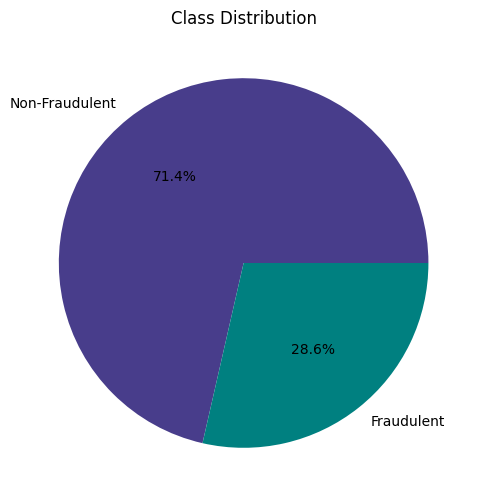

In [522]:
plt.figure(figsize=(8,6))
plt.pie(y_train_res.value_counts(),labels=['Non-Fraudulent','Fraudulent'],autopct='%1.1f%%',colors=['#483D8B','#008080'])
plt.title('Class Distribution')

# T-SNE

In [523]:
X_sample,_,y_sample,_=train_test_split(X_train_res,y_train_res,train_size=0.04,random_state=42,stratify=y_train_res)
tsne=TSNE(n_components=1,random_state=42,perplexity=30,max_iter=500,verbose=1)
X_train_tsne=tsne.fit_transform(X_sample)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12737 samples in 0.001s...
[t-SNE] Computed neighbors for 12737 samples in 0.351s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12737
[t-SNE] Computed conditional probabilities for sample 2000 / 12737
[t-SNE] Computed conditional probabilities for sample 3000 / 12737
[t-SNE] Computed conditional probabilities for sample 4000 / 12737
[t-SNE] Computed conditional probabilities for sample 5000 / 12737
[t-SNE] Computed conditional probabilities for sample 6000 / 12737
[t-SNE] Computed conditional probabilities for sample 7000 / 12737
[t-SNE] Computed conditional probabilities for sample 8000 / 12737
[t-SNE] Computed conditional probabilities for sample 9000 / 12737
[t-SNE] Computed conditional probabilities for sample 10000 / 12737
[t-SNE] Computed conditional probabilities for sample 11000 / 12737
[t-SNE] Computed conditional probabilities for sample 12000 / 12737
[t-SNE] Computed conditional probabilities for sam

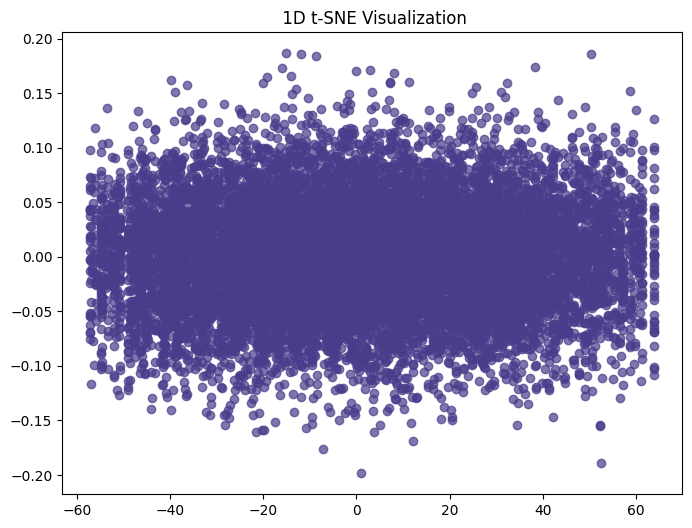

In [524]:
plt.figure(figsize=(8, 6))
j = np.random.normal(0, 0.05, size=X_train_tsne.shape)
plt.scatter(X_train_tsne.flatten(),j.flatten(), alpha=0.7,color='#483D8B')
plt.title(' 1D t-SNE Visualization')
plt.show()

In [525]:
tsne=TSNE(n_components=2,random_state=42,perplexity=30,max_iter=500,verbose=1)
X_train_tsne2=tsne.fit_transform(X_sample)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12737 samples in 0.001s...
[t-SNE] Computed neighbors for 12737 samples in 0.284s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12737
[t-SNE] Computed conditional probabilities for sample 2000 / 12737
[t-SNE] Computed conditional probabilities for sample 3000 / 12737
[t-SNE] Computed conditional probabilities for sample 4000 / 12737
[t-SNE] Computed conditional probabilities for sample 5000 / 12737
[t-SNE] Computed conditional probabilities for sample 6000 / 12737
[t-SNE] Computed conditional probabilities for sample 7000 / 12737
[t-SNE] Computed conditional probabilities for sample 8000 / 12737
[t-SNE] Computed conditional probabilities for sample 9000 / 12737
[t-SNE] Computed conditional probabilities for sample 10000 / 12737
[t-SNE] Computed conditional probabilities for sample 11000 / 12737
[t-SNE] Computed conditional probabilities for sample 12000 / 12737
[t-SNE] Computed conditional probabilities for sam

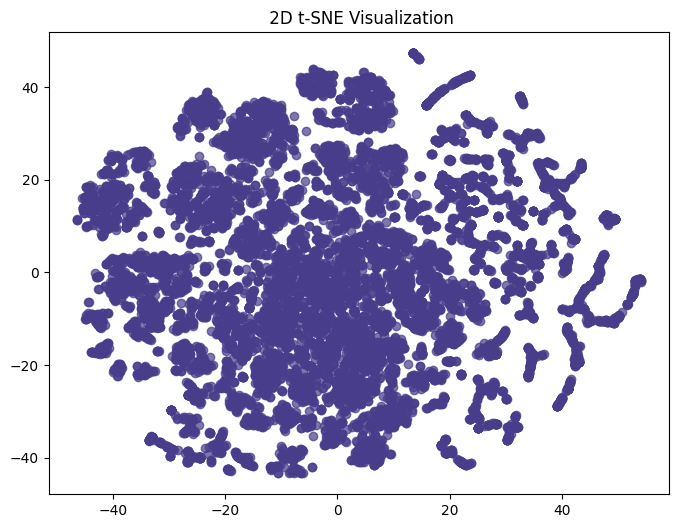

In [526]:
plt.figure(figsize=(8, 6))
plt.scatter(X_train_tsne2[:, 0], X_train_tsne2[:, 1], alpha=0.7,color='#483D8B')
plt.title(' 2D t-SNE Visualization')
ax.set_xlabel('TSNE Component 1')
ax.set_ylabel('TSNE Component 2')
plt.show()

This t-SNE plot visualizes the high-dimensional data in two dimensions, where each point represents a data sample, and clusters indicate groups of similar samples in the original feature space

In [527]:
tsne=TSNE(n_components=3,random_state=42,perplexity=30,max_iter=500,verbose=1)
X_train_tsne=tsne.fit_transform(X_sample)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12737 samples in 0.001s...
[t-SNE] Computed neighbors for 12737 samples in 0.285s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12737
[t-SNE] Computed conditional probabilities for sample 2000 / 12737
[t-SNE] Computed conditional probabilities for sample 3000 / 12737
[t-SNE] Computed conditional probabilities for sample 4000 / 12737
[t-SNE] Computed conditional probabilities for sample 5000 / 12737
[t-SNE] Computed conditional probabilities for sample 6000 / 12737
[t-SNE] Computed conditional probabilities for sample 7000 / 12737
[t-SNE] Computed conditional probabilities for sample 8000 / 12737
[t-SNE] Computed conditional probabilities for sample 9000 / 12737
[t-SNE] Computed conditional probabilities for sample 10000 / 12737
[t-SNE] Computed conditional probabilities for sample 11000 / 12737
[t-SNE] Computed conditional probabilities for sample 12000 / 12737
[t-SNE] Computed conditional probabilities for sam

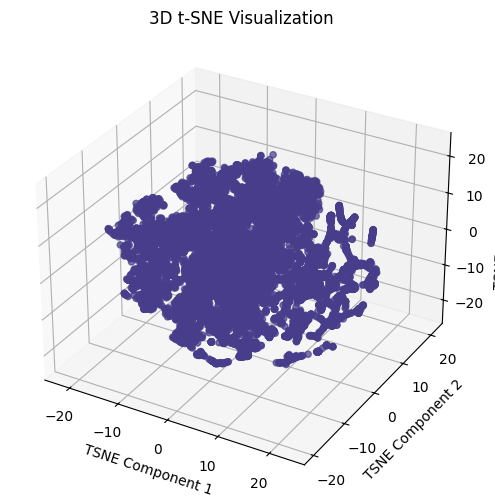

In [528]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], X_train_tsne[:, 2], alpha=0.7,color='#483D8B')
ax.set_title('3D t-SNE Visualization')
ax.set_xlabel('TSNE Component 1')
ax.set_ylabel('TSNE Component 2')
ax.set_zlabel('TSNE Component 3')

plt.show()

This 3D t-SNE plot visualizes high-dimensional data reduced to three components, where each point represents a data sample, and the spatial distribution reflects similarities among samples in the original space

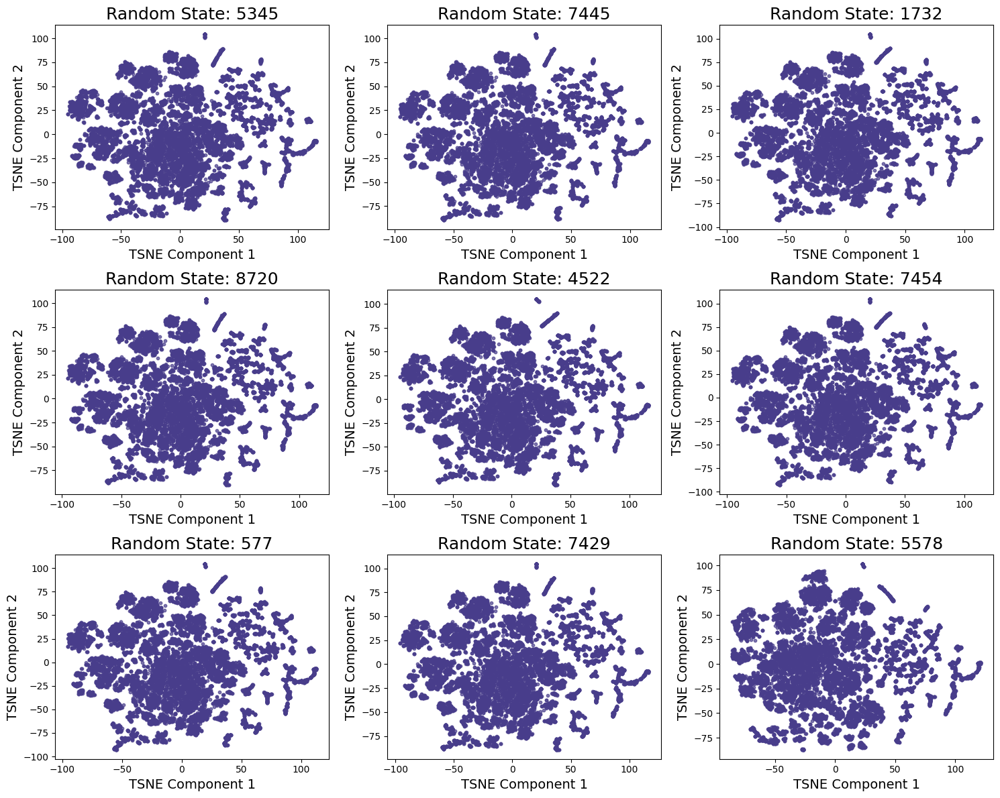

In [529]:
np.random.seed(42)
random_states=np.random.choice(range(1, 10000), size=9, replace=False)
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for a,i in enumerate(random_states) :

    tsne1=TSNE(n_components=2, random_state=i, perplexity=30)
    X_train_tsne=tsne1.fit_transform(X_sample)

    ax=axes[a]
    ax.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], alpha=0.7, color='#483D8B', s=10)
    ax.set_title(f'Random State: {i}', fontsize=18)
    ax.set_xlabel('TSNE Component 1', fontsize=14)
    ax.set_ylabel('TSNE Component 2', fontsize=14)
plt.tight_layout()
plt.show()

In [530]:
tsne_baseline= TSNE(n_components=2, random_state=random_states[0], perplexity=30)
X_baseline= tsne_baseline.fit_transform(X_sample)
mean_diffs = []
for i in random_states[1:]:
    tsne2=TSNE(n_components=2, random_state=i, perplexity=30)
    X_tsne=tsne2.fit_transform(X_sample)


    diff = np.mean(np.abs(X_tsne - X_baseline))
    mean_diffs.append((i, diff))

print("Average coordinate difference:")
for state, diff in mean_diffs:
    print(f"Random State = {state}, Mean Difference = {diff:.4f}")

Average coordinate difference:
Random State = 7445, Mean Difference = 0.8435
Random State = 1732, Mean Difference = 0.8764
Random State = 8720, Mean Difference = 0.4160
Random State = 4522, Mean Difference = 0.9892
Random State = 7454, Mean Difference = 0.9046
Random State = 577, Mean Difference = 0.9387
Random State = 7429, Mean Difference = 0.7480
Random State = 5578, Mean Difference = 22.9782


# Kmeans

In [531]:
def track_memory():
  cu_mem=psutil.Process()
  start_time=time.time()
  return cu_mem,start_time
def print_memory_usage(cu_mem,start_time,model_name):
  end_time=time.time()
  memory_used=cu_mem.memory_info().rss/(1024**2)
  execution_time=end_time-start_time
  return memory_used,execution_time


track_memory() initializes a process monitor and captures the start time to measure resource usage.

print_memory_usage() calculates and returns the memory (in MB) and execution time (in seconds) used by a model or operation.

**1.Standard Kmeans:**

In [532]:
cu_mem,start_time=track_memory()

kmeans1 = KMeans(n_clusters=2, random_state=0,init='random')
kmeans1.fit(X_train_res)

memory_used,execution_time=print_memory_usage(cu_mem,start_time,'kmeans1')
print("Execution Time:",execution_time)
print("Memory Usage in MB:",memory_used)

Execution Time: 0.9046509265899658
Memory Usage in MB: 11646.01953125


In [533]:
train_clusters=kmeans1.predict(X_train_res)
test_clusters=kmeans1.predict(X_test_pca)

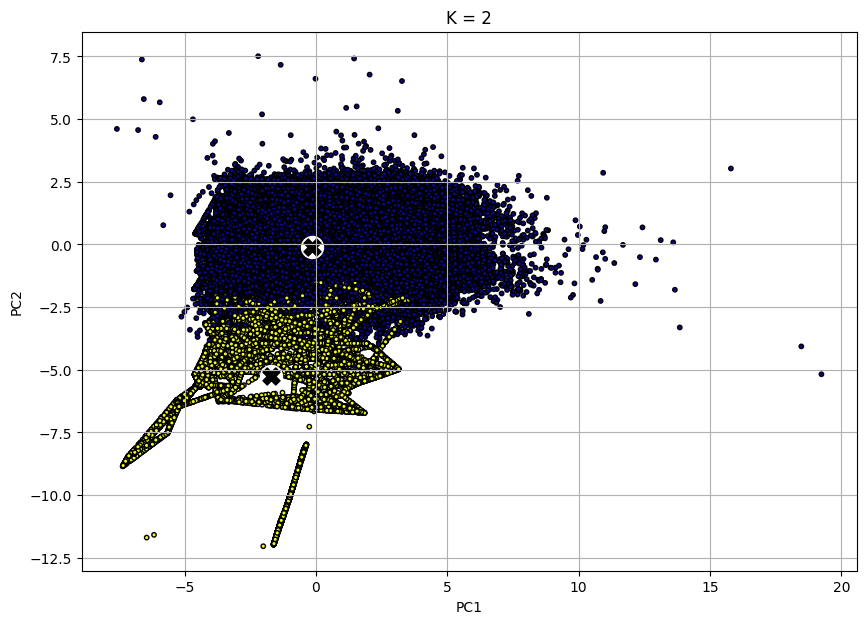

In [534]:
h = 0.01
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('plasma', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeans1.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeans1.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeans1.cluster_centers_[:, 0], kmeans1.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeans1.cluster_centers_[:, 0], kmeans1.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid()
plt.show()

This plot shows the clustering result obtained using KMeans with **init='random'** and K=2. The data was divided into two clusters as shown, with the decision boundary separating the two regions based on the centroids found by the algorithm. The points are colored according to their assigned cluster. Although the algorithm divided the data into two main regions, this result alone does not guarantee that the clustering is optimal. To further evaluate the quality of this clustering, we will now calculate the Inertia and Silhouette Score, which help determine whether this division is meaningful and well-separated.

In [535]:
print("Inertia Value: ",kmeans1.inertia_)
print("Silhouette Score:",silhouette_score(X_train_res, train_clusters,sample_size=10000,random_state=42))

Inertia Value:  20621556.900800258
Silhouette Score: 0.6331397302929861


The inertia value of 6,402,418.82 indicates the total within-cluster variance, but by itself, it doesn't confirm the clustering quality. The silhouette score of 0.0617 suggests that the clusters **are not well-separated, indicating a weak clustering structure**

In [536]:
k_values = range(2,21)
inertia=[]
silhouette_scores={}
models={}

for k in k_values:
  kmeans=KMeans(n_clusters=k,random_state=42,init='random')
  kmeans.fit(X_train_res)
  inertia.append(kmeans.inertia_)
  silhouette_scores[k]=silhouette_score(X_train_res,kmeans.labels_,sample_size=10000,random_state=42)
  models[k]=kmeans

In [537]:
#this cell aims to find the best k
kl = KneeLocator(k_values, inertia, curve="convex", direction="decreasing")
best_k = kl.elbow
print("Best k (Elbow Point) = ",best_k)

Best k (Elbow Point) =  4


This cell uses the KneeLocator to identify the optimal number of clusters k by detecting the elbow point on the inertia curve. It works by calculating the **change in slope between points**, and selects the point where the rate of decrease in inertia sharply slows down — indicating the best trade-off between compactness and number of clusters

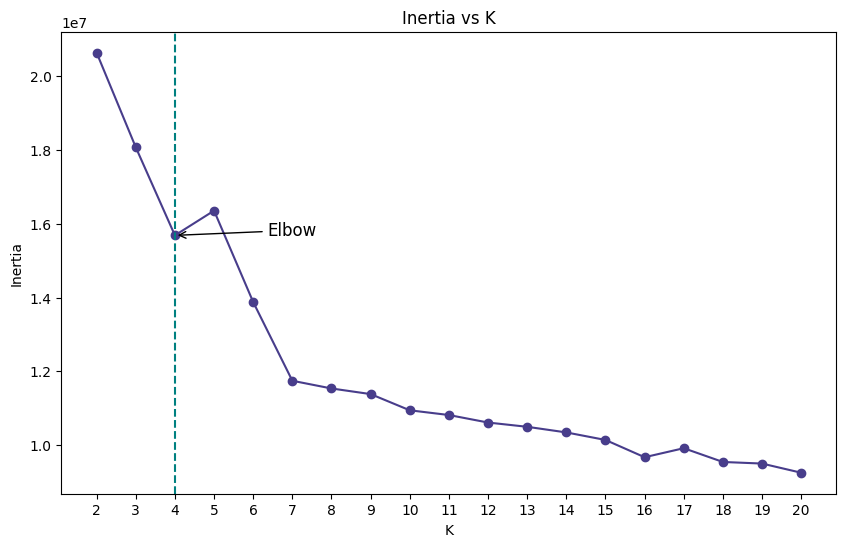

In [538]:
plt.figure(figsize=(10,6))
plt.plot(k_values,inertia,marker='o',color='#483D8B')
plt.title('Inertia vs K')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.xticks(k_values)
elbow_x = best_k
elbow_y = inertia[best_k -2]
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.annotate("Elbow",
             xy=(elbow_x, elbow_y),
             xytext=(elbow_x + 3, elbow_y+50),
             arrowprops=dict(facecolor='black', arrowstyle="->"),
             fontsize=12,
             ha='center')
plt.show()

In [539]:
kmeans11 = KMeans(n_clusters=best_k, random_state=0,init='random')
kmeans11.fit(X_train_res)

train_clusters1=kmeans11.predict(X_train_res)
test_clusters=kmeans11.predict(X_test_pca)

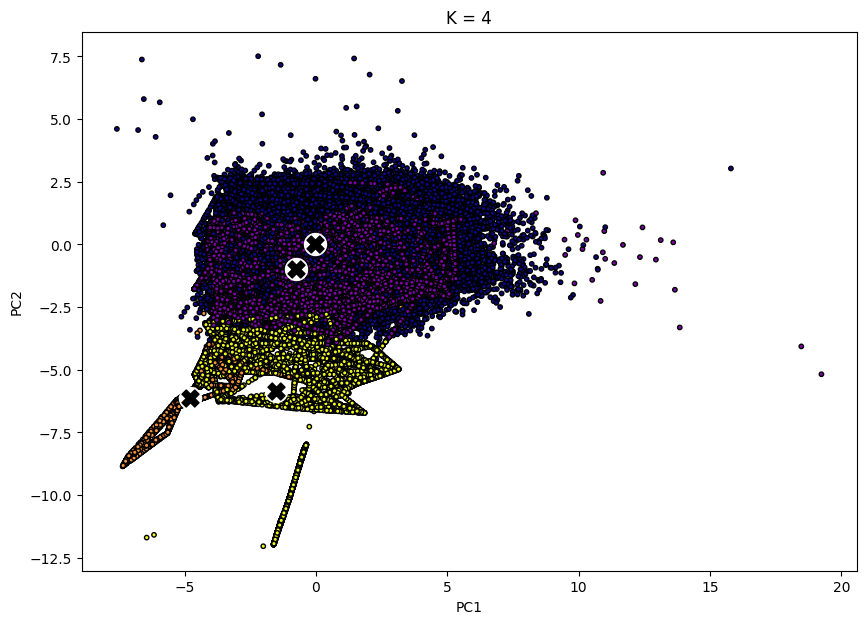

In [540]:
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('plasma', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeans11.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeans11.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeans11.cluster_centers_[:, 0], kmeans11.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeans11.cluster_centers_[:, 0], kmeans11.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title(f"K = {best_k}")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.show()

In [541]:
best_k = max(silhouette_scores, key=silhouette_scores.get)
print("Best k based on Silhouette Score = ",best_k)

Best k based on Silhouette Score =  2


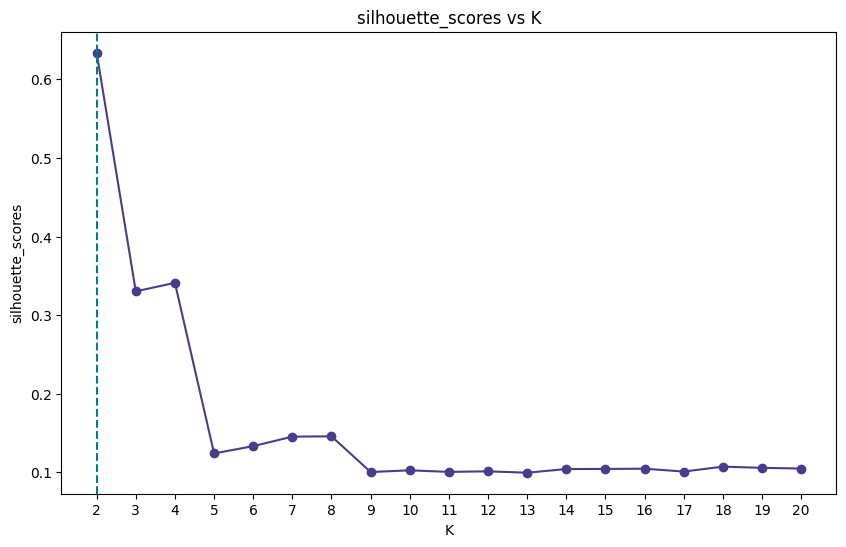

In [542]:
plt.figure(figsize=(10,6))
plt.plot(list(silhouette_scores.keys()),list(silhouette_scores.values()),marker='o',color='#483D8B')
plt.title('silhouette_scores vs K')
plt.xlabel('K')
plt.xticks(k_values)
plt.ylabel('silhouette_scores')
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.show()

In [543]:
kmeans12 = KMeans(n_clusters=best_k, random_state=0,init='random')
kmeans12.fit(X_train_res)

train_clusters2=kmeans12.predict(X_train_res)
test_clusters=kmeans12.predict(X_test_pca)

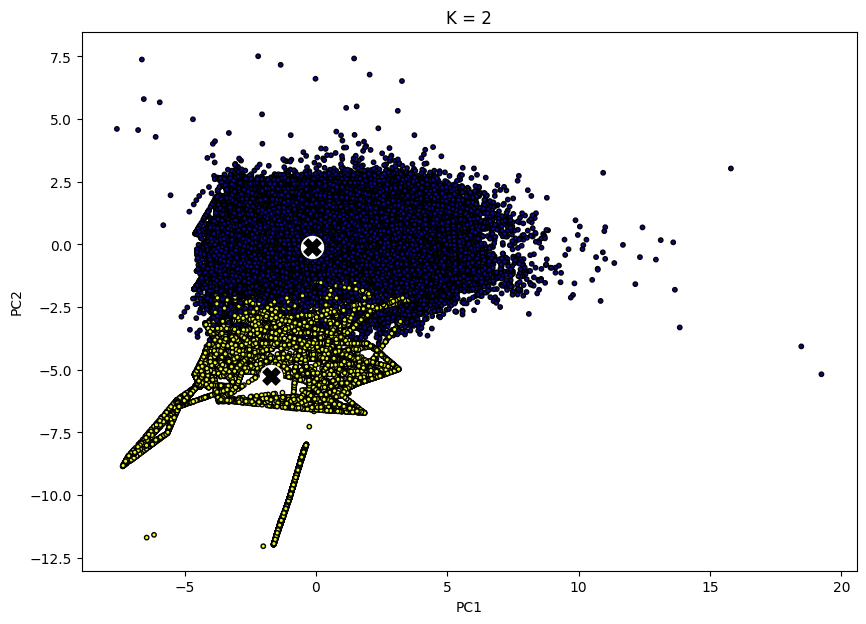

In [544]:
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('plasma', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeans12.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeans12.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeans12.cluster_centers_[:, 0], kmeans12.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeans12.cluster_centers_[:, 0], kmeans12.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
#ax.grid()
plt.show()

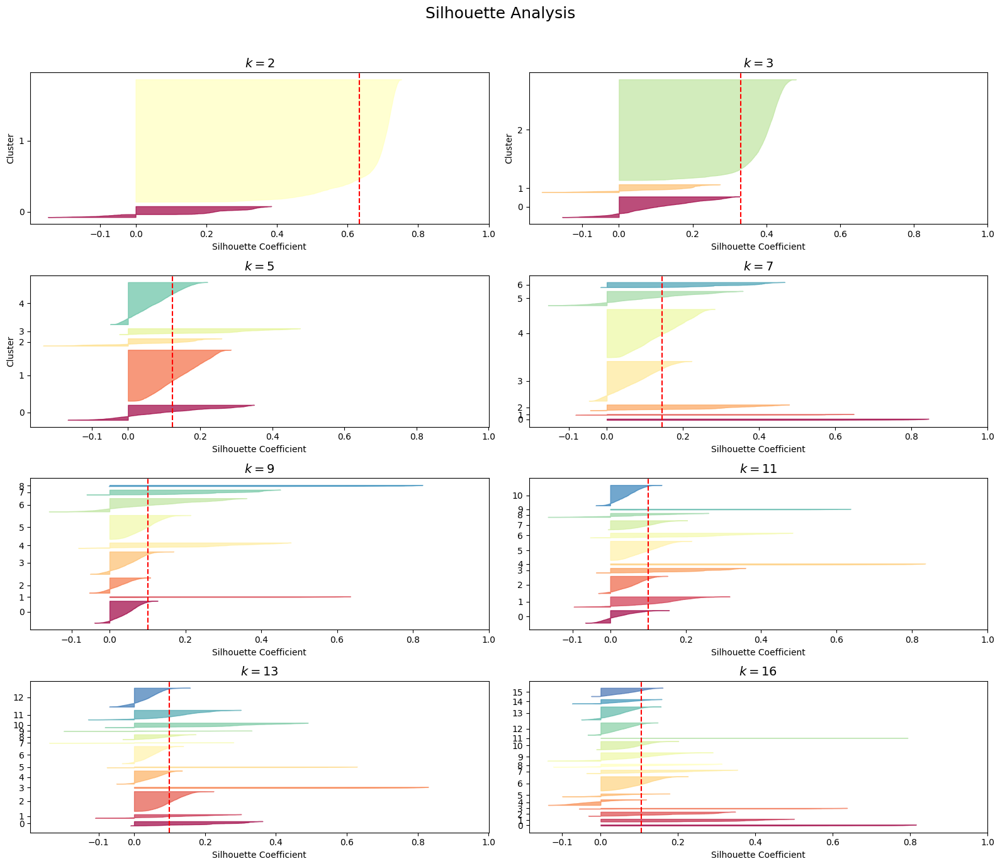

In [545]:
k_values = [2, 3, 5, 7, 9,11,13,16]

plt.figure(figsize=(16, 14))

for idx, k in enumerate(k_values):
    plt.subplot(4, 2, idx + 1)


    X_sample, _, y_sample, _ = train_test_split(
        X_train_res,
        models[k].labels_,
        train_size=0.04,
        stratify=models[k].labels_,
        random_state=42
    )


    silhouette_coefficients = silhouette_samples(X_sample, y_sample)


    padding = len(X_sample) // 30
    pos = padding
    ticks = []

    for i, cluster_label in enumerate(np.unique(y_sample)):
        coeffs = silhouette_coefficients[y_sample == cluster_label]
        coeffs.sort()
        color = plt.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding


    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(len(np.unique(y_sample)))))


    plt.axvline(x=silhouette_scores[k], color="red", linestyle="--")


    plt.title(f"$k={k}$", fontsize=14)
    plt.xlabel("Silhouette Coefficient")
    plt.ylabel("Cluster" if k in (2, 3, 5) else "")
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.suptitle("Silhouette Analysis", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Silhouette Analysis Summary :**

This plot shows the Silhouette Coefficients for different values of **k** (number of clusters). Each subplot corresponds to a different value of `k`, and visualizes the silhouette score distribution across the clusters.

#### Key Observations:
- The **red dashed line** represents the **average silhouette score** for each `k`.
- A **higher average silhouette score** indicates better-defined clusters.
- When:
  - **k = 2 or 3**: Clusters appear more compact and separated.
  - **k = 5 and beyond**: Many clusters have silhouette scores near 0 or even negative, indicating overlapping or poorly separated clusters.
- **k = 3 to 5** may be reasonable choices for clustering, as they show a better balance between compactness and separation.

#### What is Silhouette Score?
It ranges from -1 to 1:
- Close to **1** → well-clustered, far from neighboring clusters.
- Close to **0** → on the border of two clusters.
- Close to **-1** → possibly assigned to the wrong cluster.

This analysis helps in choosing the **optimal `k`** by looking for the highest average silhouette score with consistently high individual cluster scores.


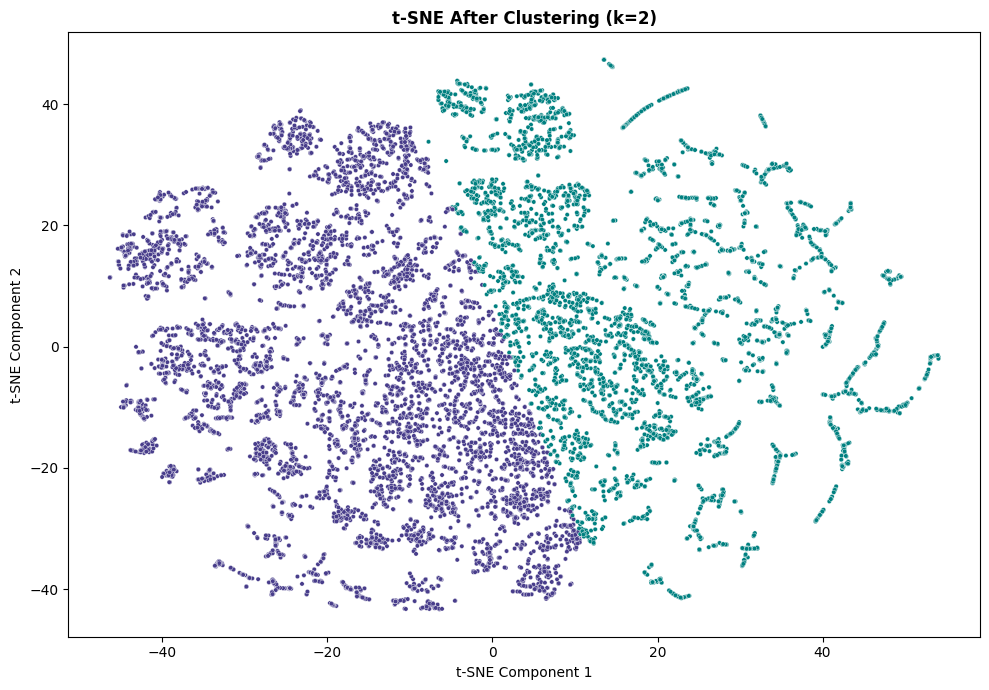

In [546]:
kmeans=KMeans(n_clusters=2,random_state=0,init='random')
kmeans.fit(X_train_tsne2)

plt.figure(figsize=(10,7))

label=kmeans.predict(X_train_tsne2)
sns.scatterplot(x=X_train_tsne2[:, 0], y=X_train_tsne2[:, 1], hue=label, palette=['#483D8B','#008080'], s=10, legend=None)
plt.title(f"t-SNE After Clustering (k={2})",  fontweight="bold")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()

t-SNE visualization after applying Standard K-Means clustering with
𝑘
=
2
k=2. The plot shows the distribution of data points reduced to two dimensions using t-SNE, capturing the complex structure of the original high-dimensional space. The two clusters are colored differently, highlighting the separation achieved through the improved K-Means++ initialization, which helps in faster convergence and better clustering quality.

**2.Kmeans++:**

In [547]:
cu_mem,start_time=track_memory()

kmeansP=KMeans(n_clusters=2,random_state=42,init='k-means++')
kmeansP.fit(X_train_res)

memory_usedP,execution_timeP=print_memory_usage(cu_mem,start_time,'kmeansP')
print("Execution Time:",execution_time)
print("Memory Usage in MB:",memory_used)

Execution Time: 0.9046509265899658
Memory Usage in MB: 11646.01953125


In [548]:
train_clustersP=kmeansP.predict(X_train_res)
test_clusters=kmeansP.predict(X_test_pca)

In [549]:
print("Inertia Value: ",kmeansP.inertia_)
print("Silhouette Score:",silhouette_score(X_train_res, train_clustersP,sample_size=10000,random_state=42))

Inertia Value:  20621556.90080026
Silhouette Score: 0.6331397302929861


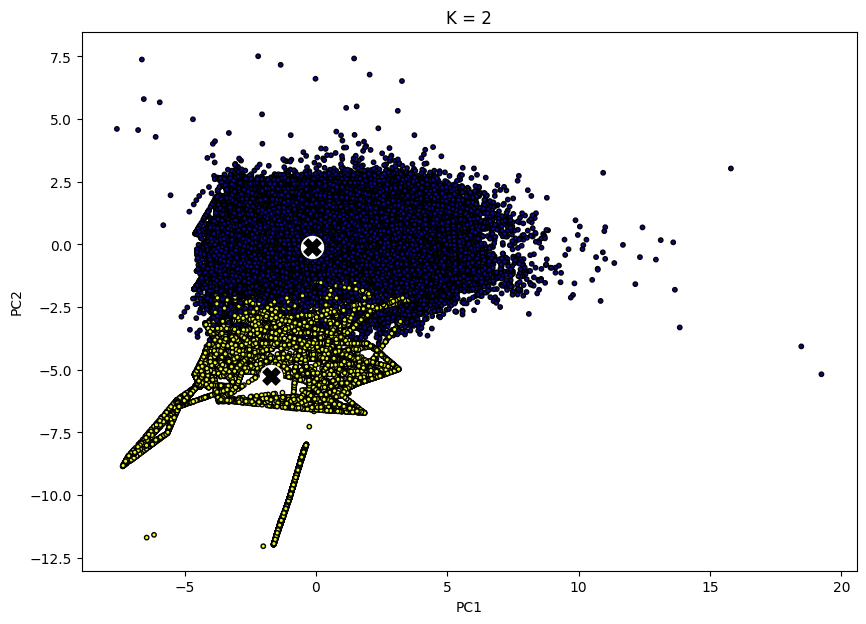

In [550]:
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('plasma', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeans1.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeansP.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeansP.cluster_centers_[:, 0], kmeansP.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeansP.cluster_centers_[:, 0], kmeansP.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
#ax.grid()
plt.show()

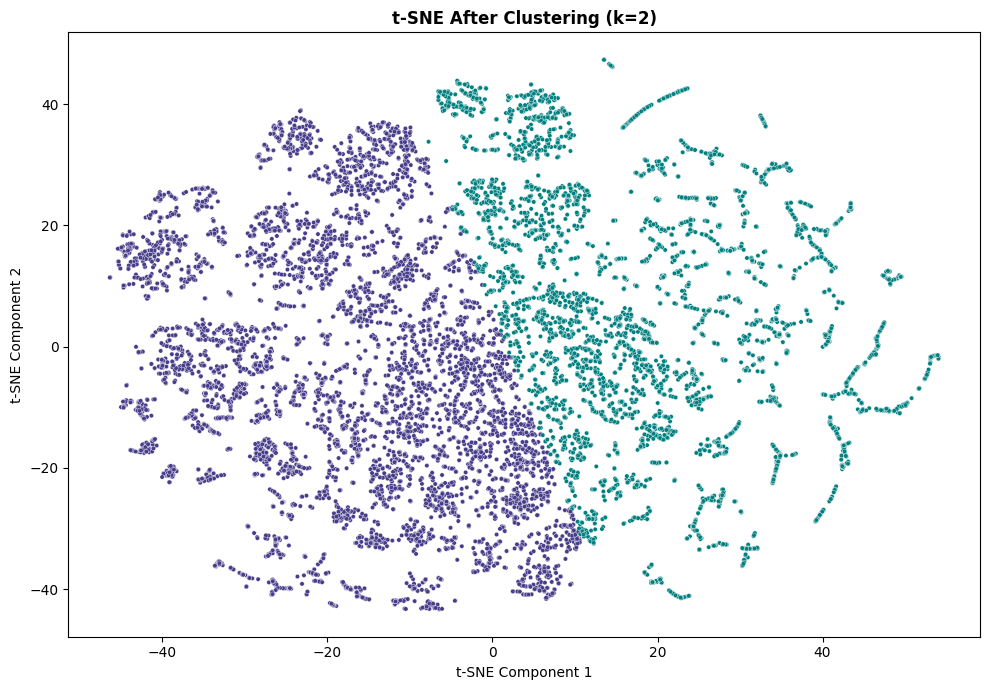

In [551]:
kmeansP=KMeans(n_clusters=2,random_state=42,init='k-means++')
kmeansP.fit(X_train_tsne2)

plt.figure(figsize=(10,7))

label=kmeansP.predict(X_train_tsne2)
sns.scatterplot(x=X_train_tsne2[:, 0], y=X_train_tsne2[:, 1], hue=label, palette=['#483D8B','#008080'], s=10, legend=None)
plt.title(f"t-SNE After Clustering (k={2})",  fontweight="bold")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()

In [552]:
k_values = range(2,21)
inertia=[]
silhouette_scores=[]
models2={}

for k in k_values:
  kmeans=KMeans(n_clusters=k,random_state=42,init='k-means++')
  kmeans.fit(X_train_res)
  inertia.append(kmeans.inertia_)
  silhouette_scores.append(silhouette_score(X_train_res,kmeans.labels_,sample_size=10000,random_state=42))
  models2[k]=kmeans

In [553]:
kl = KneeLocator(k_values, inertia, curve="convex", direction="decreasing")
best_k = kl.elbow
print("Best k (Elbow Point) = ",best_k)

Best k (Elbow Point) =  7


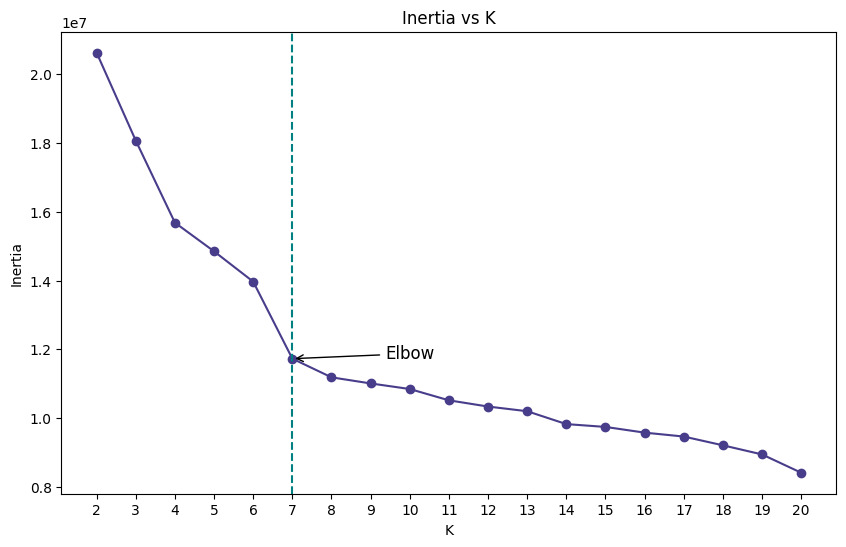

In [554]:
plt.figure(figsize=(10,6))
plt.plot(k_values,inertia,marker='o',color='#483D8B')
plt.title('Inertia vs K')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.xticks(k_values)
elbow_x = best_k
elbow_y = inertia[best_k -2]
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.annotate("Elbow",
             xy=(elbow_x, elbow_y),
             xytext=(elbow_x + 3, elbow_y+50),
             arrowprops=dict(facecolor='black', arrowstyle="->"),
             fontsize=12,
             ha='center')
plt.show()

In [555]:
kmeansP2=KMeans(n_clusters=best_k,random_state=42,init='k-means++')
kmeansP2.fit(X_train_res)

KMeans(n_clusters=np.int64(7), random_state=42)

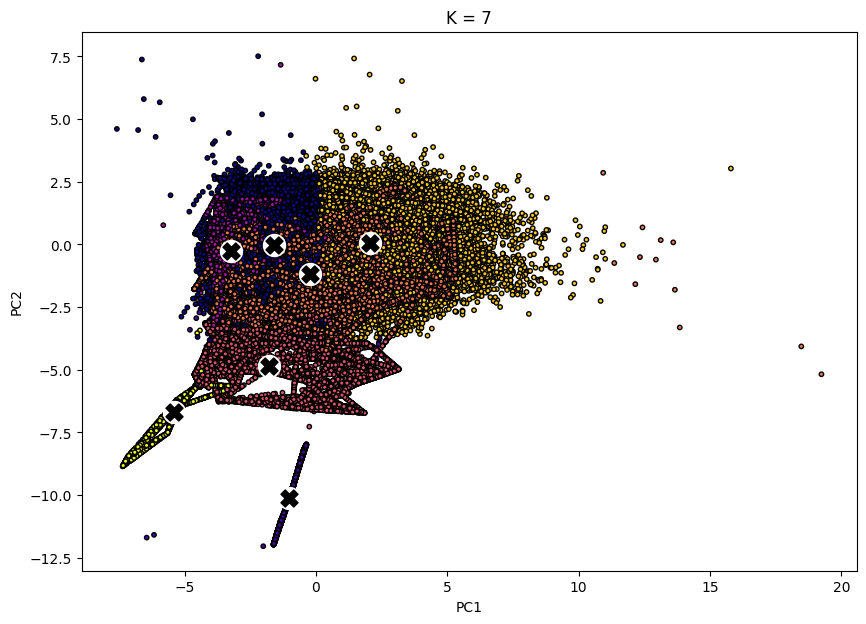

In [558]:
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('plasma', 10)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeansP2.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeansP2.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeansP2.cluster_centers_[:, 0], kmeansP2.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeansP2.cluster_centers_[:, 0], kmeansP2.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title(f"K = {best_k}")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
#ax.grid()
plt.show()

In [559]:
best_k = k_values[np.argmax(silhouette_scores)]
print("Best k based on Silhouette Score = ",best_k)

Best k based on Silhouette Score =  2


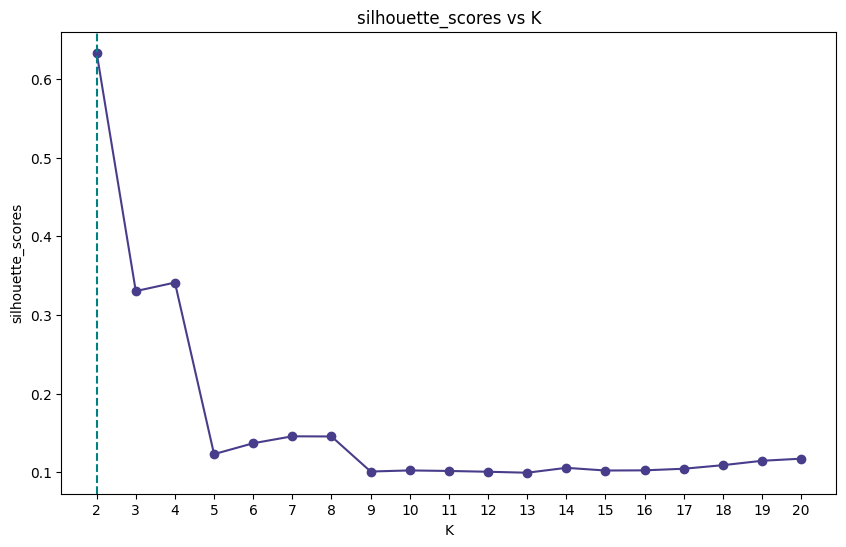

In [560]:
plt.figure(figsize=(10,6))
plt.plot(k_values,silhouette_scores,marker='o',color='#483D8B')
plt.title('silhouette_scores vs K')
plt.xlabel('K')
plt.xticks(k_values)
plt.ylabel('silhouette_scores')
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.show()

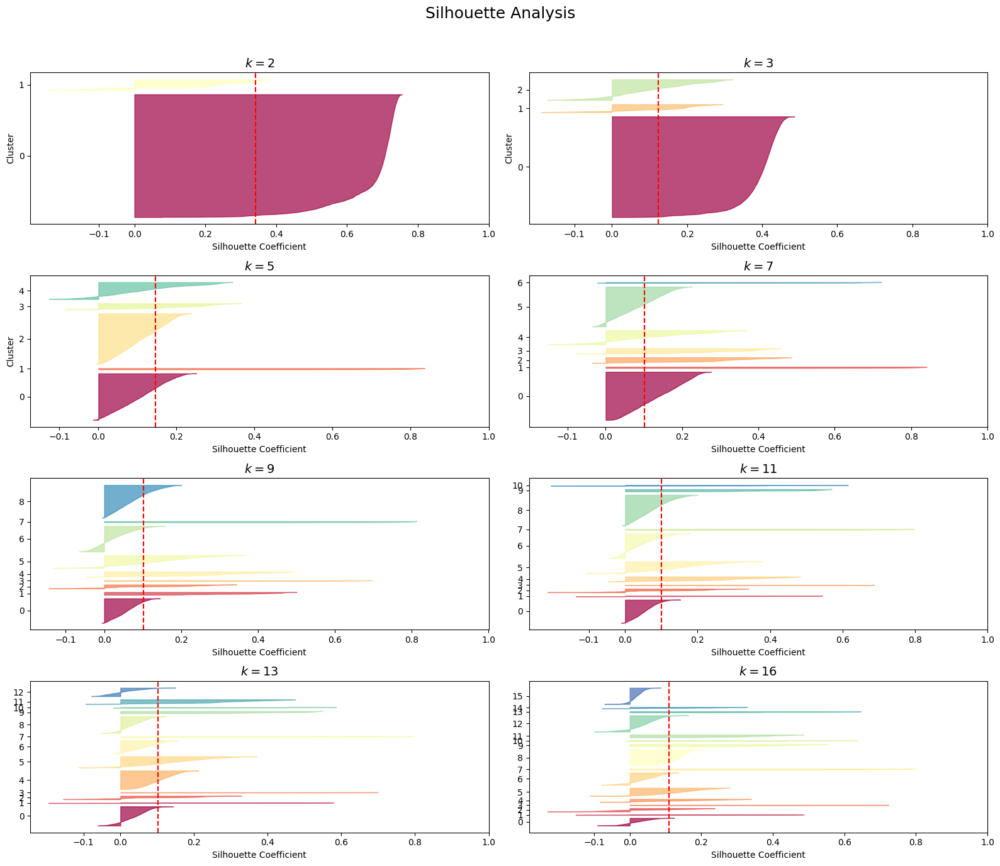

In [561]:
k_values = [2, 3, 5, 7, 9,11,13,16]

plt.figure(figsize=(16, 14))

for idx, k in enumerate(k_values):
    plt.subplot(4, 2, idx + 1)


    X_sample, _, y_sample, _ = train_test_split(
        X_train_res,
        models2[k].labels_,
        train_size=0.04,
        stratify=models2[k].labels_,
        random_state=42
    )


    silhouette_coefficients = silhouette_samples(X_sample, y_sample)


    padding = len(X_sample) // 30
    pos = padding
    ticks = []

    for i, cluster_label in enumerate(np.unique(y_sample)):
        coeffs=silhouette_coefficients[y_sample == cluster_label]
        coeffs.sort()
        color=plt.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding


    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(len(np.unique(y_sample)))))


    plt.axvline(x=silhouette_scores[k], color="red", linestyle="--")


    plt.title(f"$k={k}$", fontsize=14)
    plt.xlabel("Silhouette Coefficient")
    plt.ylabel("Cluster" if k in (2, 3, 5) else "")
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.suptitle("Silhouette Analysis", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Compare standard K-Means and K-Means++:

In [562]:
SK_VS_KP=pd.DataFrame({'Metric':["Inertia", "Silhouette Score","Iterations","Execution Time"],
          'Standard KMeans':[kmeans1.inertia_,silhouette_score(X_train_res, train_clusters,sample_size=15000,random_state=42),kmeans1.n_iter_,execution_time],
          'KMeans Plus Plus':[kmeansP.inertia_,silhouette_score(X_train_res, train_clustersP,sample_size=15000,random_state=42),kmeansP.n_iter_,execution_timeP]})
SK_VS_KP


,Metric,Standard KMeans,KMeans Plus Plus
0,Inertia,2.062156e+07,7.985032e+06
1,Silhouette Score,6.330964e-01,6.330964e-01
2,Iterations,5.000000e+00,1.400000e+01
3,Execution Time,9.046509e-01,3.610313e-01


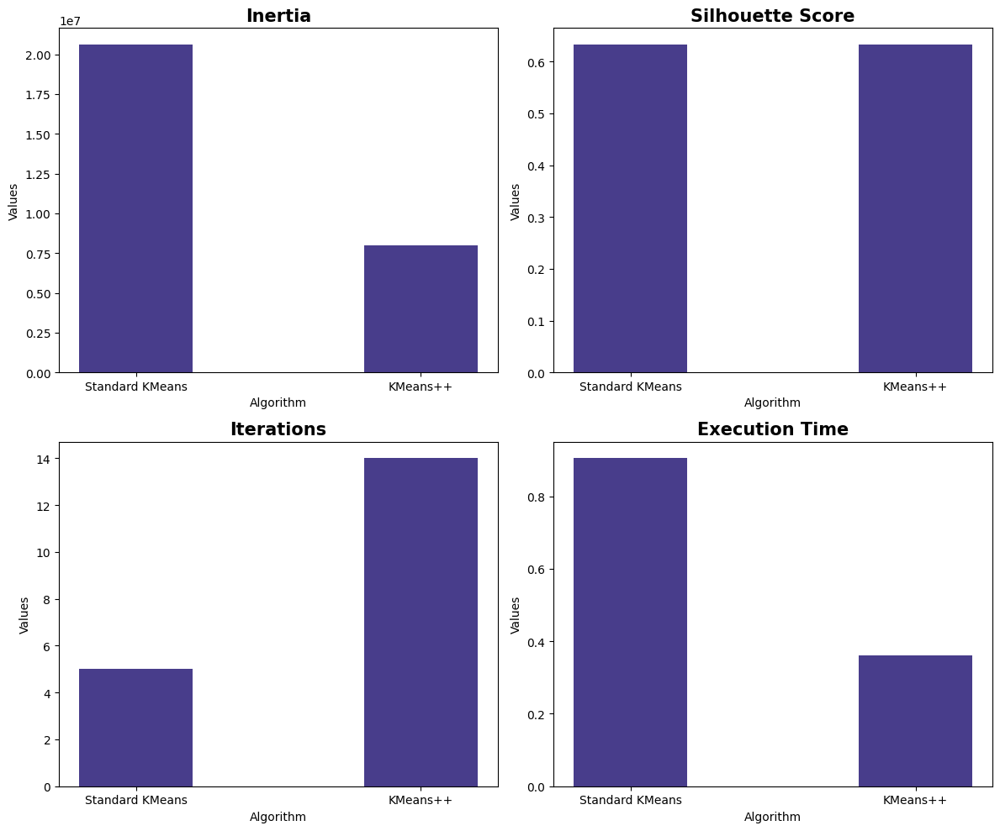

In [563]:
fig,ax=plt.subplots(2,2,figsize=(12,10))
metrics = SK_VS_KP["Metric"]
for i,ax in enumerate(ax.flatten()):
    metric= metrics[i]
    values= SK_VS_KP.loc[SK_VS_KP["Metric"] == metric].iloc[0, 1:]
    labels= ["Standard KMeans", "KMeans++"]
    ax.bar(labels, values, width=.4,color='#483D8B')
    ax.set_title(metric, fontsize=15, fontweight="bold")
    ax.set_ylabel("Values")
    ax.set_xlabel("Algorithm")
    ax.tick_params(axis="x")
    ax.tick_params(axis="y")
plt.tight_layout()
plt.show()


**Initialization:**

Standard K-Means: Random, can lead to poor clusters.

K-Means++: Spreads initial centroids, improving cluster quality.

**Convergence:**

Standard K-Means: Often slower, more iterations.

K-Means++: Faster, fewer iterations.

**Clustering Quality:**

Standard K-Means: Higher inertia, lower silhouette.

K-Means++: Lower inertia, higher silhouette.

**Execution Time:**

Standard K-Means: Potentially longer.

K-Means++: Slightly slower at the start, but often faster overall.

KMeans++ generally converges in fewer iterations due to smarter initialization, but the initialization step is more computationally expensive. This can result in longer total runtime despite faster convergence.

**Show how initialization impacts convergence and results:**




In [564]:
exp=15
Comparisons = {
    "Random State": [],
    "Inertia": [],
    "Silhouette Score": [],
    "Iterations": [],
    "Execution Time": []
}
for i in range(exp):
    random_state = np.random.randint(0, 10000)
    Stime= time.time()
    kmeanspp= KMeans(n_clusters=2, init="k-means++", random_state=random_state)
    clusterspp= kmeanspp.fit_predict(X_train_pca)
    Etime= time.time()
    Comparisons["Random State"].append(random_state)
    Comparisons["Inertia"].append(kmeanspp.inertia_)
    Comparisons["Silhouette Score"].append(silhouette_score(X_train_pca, clusterspp, sample_size=10000, random_state=42))
    Comparisons["Iterations"].append(kmeanspp.n_iter_)
    Comparisons["Execution Time"].append(Etime - Stime)

final_comparisons = pd.DataFrame(Comparisons)
final_comparisons

,Random State,Inertia,Silhouette Score,Iterations,Execution Time
0,1741,6.339879e+06,0.113326,10,0.289831
1,5830,6.339882e+06,0.113348,7,0.274036
2,7523,6.339879e+06,0.113312,8,0.281478
3,625,6.339881e+06,0.113324,10,0.291468
4,1690,6.339881e+06,0.113210,10,0.290360
5,8282,6.339881e+06,0.113338,10,0.284094
6,6310,6.339882e+06,0.113335,13,0.306322
7,3006,6.339880e+06,0.113227,12,0.302606
8,4302,6.339882e+06,0.113335,8,0.281640
9,1088,6.339884e+06,0.113352,8,0.285897


Initialization plays a key role in KMeans performance. KMeans++ improves the starting point selection to avoid poor clustering results. However, changing the random_state still leads to small differences.

From the table, we can see that different random_state values in KMeans++ cause:

- Slight changes in inertia

- Variations in silhouette score

- Different number of iterations

- Changes in execution time

Even with KMeans++, trying multiple random states helps find more stable and accurate clustering results.




Compare clustering performance with and without dimensionality reduction (PCA):

In [565]:
kmeanspca= KMeans(n_clusters=2, init='k-means++', random_state=42)
clusterspca= kmeanspca.fit_predict(X_train_res)

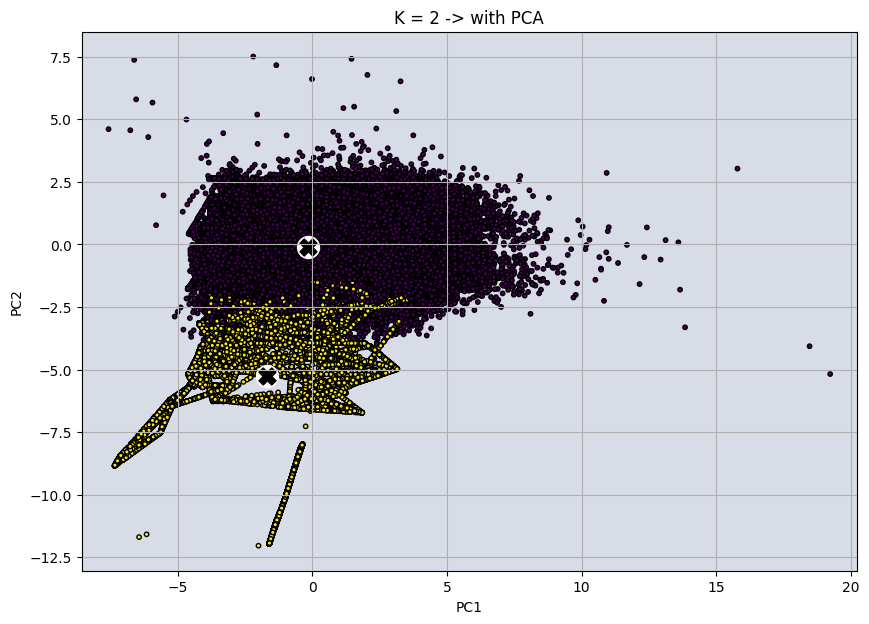

In [566]:
h = 0.02
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('viridis', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeanspca.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=kmeanspca.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeanspca.cluster_centers_[:, 0], kmeanspca.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeanspca.cluster_centers_[:, 0], kmeanspca.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2 -> with PCA")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid()
plt.show()

In [567]:
print("Inertia Value: ",kmeanspca.inertia_)
print("Silhouette Score:",silhouette_score(X_train_res,clusterspca,sample_size=10000,random_state=42))

Inertia Value:  20621556.900800265
Silhouette Score: 0.6331397302929861


In [568]:
kmeans= KMeans(n_clusters=2, init='k-means++', random_state=42)
clusters= kmeans.fit_predict(X_train_res2)

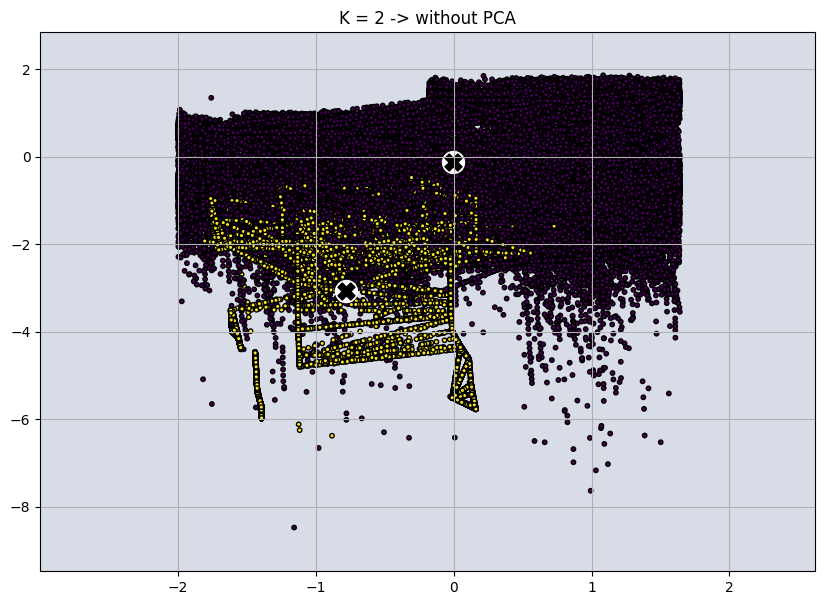

In [569]:
h = 0.02
x_min, x_max = X_train_res2[:, 0].min() - 1, X_train_res2[:, 0].max() + 1
y_min, y_max = X_train_res2[:, 1].min() - 1, X_train_res2[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('viridis', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res2.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeans.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res2[:, 0], X_train_res2[:, 1], c=kmeans.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2 -> without PCA")
ax.grid()
plt.show()

In [570]:
print("Inertia Value: ",kmeans.inertia_)
print("Silhouette Score:",silhouette_score(X_train_res2,clusters,sample_size=10000,random_state=42))

Inertia Value:  26700387.947458632
Silhouette Score: 0.6617010323246657


**Compare clustering in full space vs. reduced 2D space:**

In [571]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_scaled)

In [572]:
kmeanspca2= KMeans(n_clusters=2, init='k-means++', random_state=42)
clusterspca= kmeanspca2.fit_predict(X_pca)

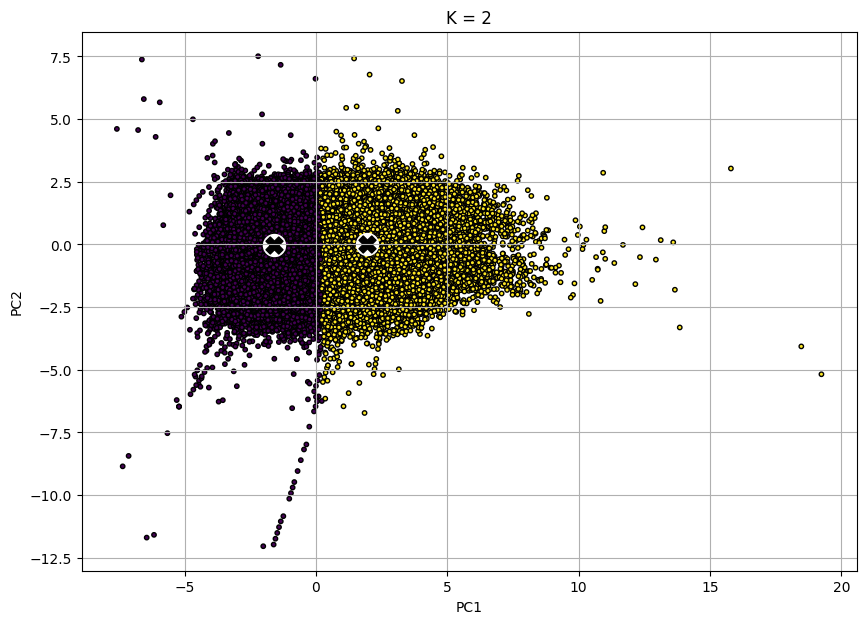

In [573]:
h = 0.02
x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('viridis', 5)

grid = np.zeros((xx.ravel().shape[0], X_pca.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = kmeanspca2.predict(grid).reshape(xx.shape)
fig,ax=plt.subplots(1,1,figsize=(10,7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeanspca2.labels_, cmap=cmap, s=10, edgecolor='k')
ax.scatter(kmeanspca2.cluster_centers_[:, 0], kmeanspca2.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(kmeanspca2.cluster_centers_[:, 0], kmeanspca2.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("K = 2")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid()
plt.show()

In [574]:
print("Inertia Value: ",kmeanspca2.inertia_)
print("Silhouette Score:",silhouette_score(X_pca,clusterspca,sample_size=10000,random_state=42))

Inertia Value:  708135.2336164376
Silhouette Score: 0.42407454312464476


 **3.Mini-Batch K-Means:**

In [575]:
cu_mem,start_time=track_memory()
min_batch=MiniBatchKMeans(n_clusters=2,random_state=42,init="random")
min_batch.fit(X_train_res)

memory_used_m,execution_time_m=print_memory_usage(cu_mem,start_time,'min_batch')
print("Execution Time:",execution_time)
print("Memory Usage in MB:",memory_used)


Execution Time: 0.9046509265899658
Memory Usage in MB: 11646.01953125


In [576]:
train_clustersmb=min_batch.predict(X_train_res)

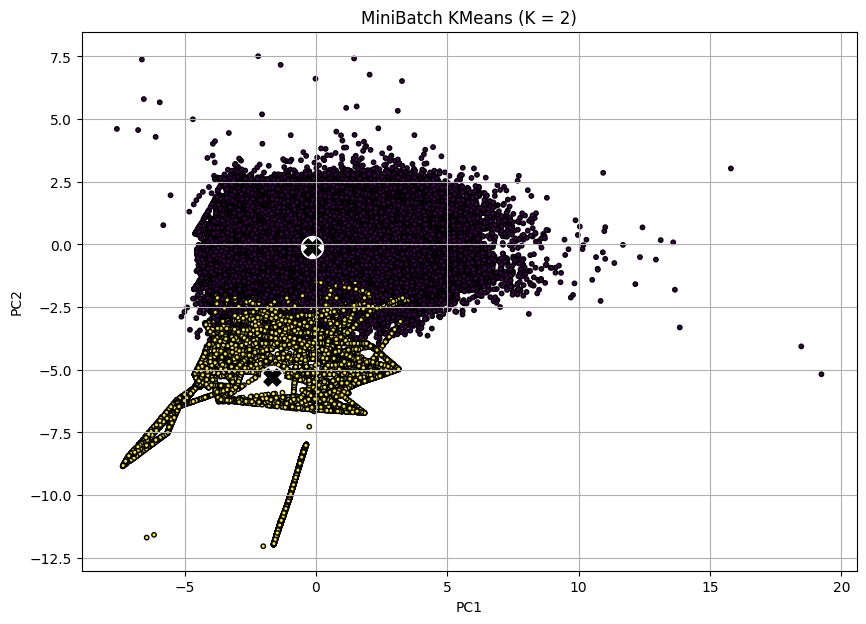

In [577]:
x_min, x_max = X_train_res[:, 0].min() - 1, X_train_res[:, 0].max() + 1
y_min, y_max = X_train_res[:, 1].min() - 1, X_train_res[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
cmap = plt.get_cmap('viridis', 5)

grid = np.zeros((xx.ravel().shape[0], X_train_res.shape[1]))
grid[:, 0] = xx.ravel()
grid[:, 1] = yy.ravel()

Z = min_batch.predict(grid).reshape(xx.shape)
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
#ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.2)
ax.scatter(X_train_res[:, 0], X_train_res[:, 1], c=train_clusters, cmap=cmap, s=10, edgecolor='k')
ax.scatter(min_batch.cluster_centers_[:, 0], min_batch.cluster_centers_[:, 1], c='white', marker='o', s=250)
ax.scatter(min_batch.cluster_centers_[:, 0], min_batch.cluster_centers_[:, 1], c='black', marker='X', s=150)
ax.set_title("MiniBatch KMeans (K = 2)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid()
plt.show()

In [578]:
k_values = range(2,21)
inertia=[]
silhouette_scores=[]
models2={}

for k in k_values:
  min_batch=MiniBatchKMeans(n_clusters=k,random_state=42)
  min_batch.fit(X_train_res)
  inertia.append(min_batch.inertia_)
  silhouette_scores.append(silhouette_score(X_train_res,min_batch.labels_,sample_size=10000,random_state=42))
  models2[k]=min_batch

In [579]:
#this cell aims to find the best k
kl = KneeLocator(k_values, inertia, curve="convex", direction="decreasing")
best_k = kl.elbow
print("Best k (Elbow Point) = ",best_k)

Best k (Elbow Point) =  8


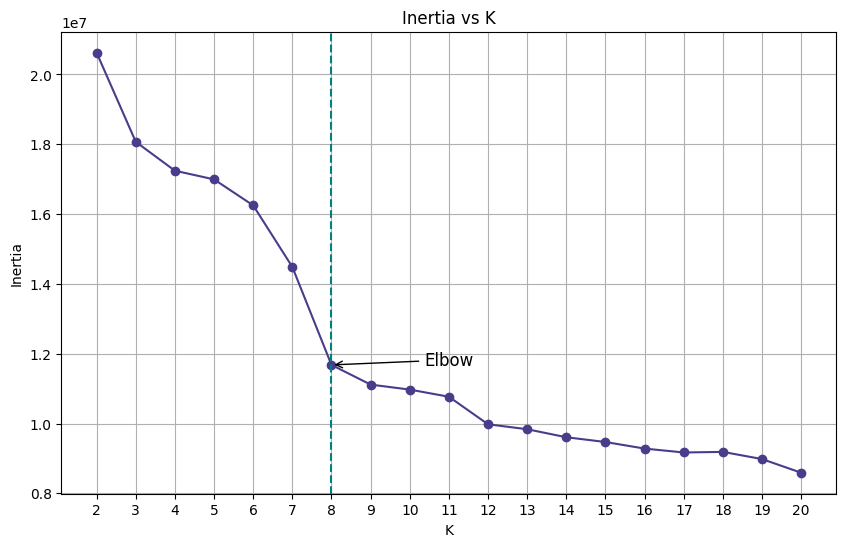

In [580]:
plt.figure(figsize=(10,6))
plt.plot(k_values,inertia,marker='o',color='#483D8B')
plt.title('Inertia vs K')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.grid()
elbow_x = best_k
elbow_y = inertia[best_k -2]
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.annotate("Elbow",
             xy=(elbow_x, elbow_y),
             xytext=(elbow_x + 3, elbow_y+50),
             arrowprops=dict(facecolor='black', arrowstyle="->"),
             fontsize=12,
             ha='center')
plt.show()

In [581]:
best_k = k_values[np.argmax(silhouette_scores)]
print("Best k based on Silhouette Score = ",best_k)

Best k based on Silhouette Score =  2


Text(0.5, 0, 'K')

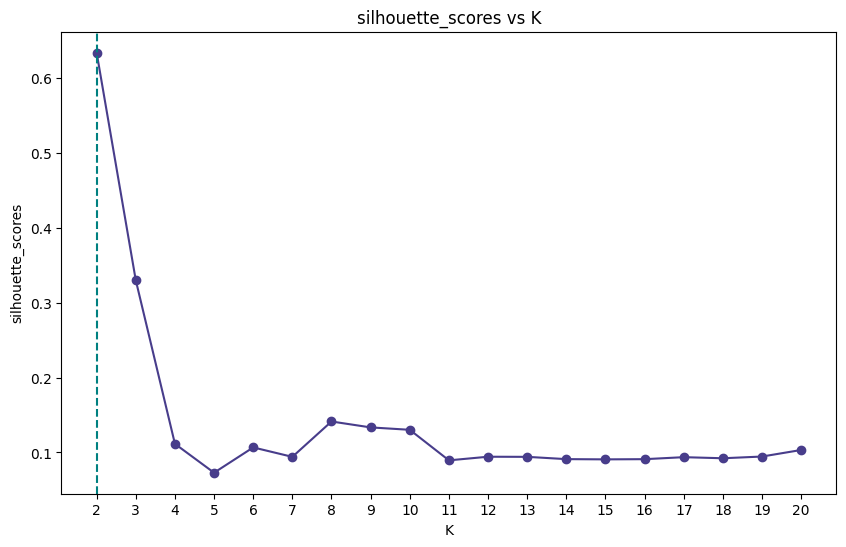

In [582]:
plt.figure(figsize=(10,6))
plt.plot(cluster_range,silhouette_scores,marker='o',color='#483D8B')
plt.title('silhouette_scores vs K')
plt.xlabel('K')
plt.xticks(cluster_range)
plt.ylabel('silhouette_scores')
plt.axvline(best_k, color='#008080', linestyle='--', label=f"Best k = {best_k}")
plt.xlabel('K')

In [583]:
MB_VS_KP=pd.DataFrame({'Metric':["Inertia", "Silhouette Score","Iterations","Execution Time","Memory Usage"],
          'Standard KMeans':[kmeans1.inertia_,silhouette_score(X_train_res, train_clusters,sample_size=15000,random_state=42),kmeans1.n_iter_,execution_time,memory_used],
          'MiniBatch KMeans':[min_batch.inertia_,silhouette_score(X_train_res, train_clustersmb,sample_size=15000,random_state=42),min_batch.n_iter_,execution_time_m,memory_used_m],
          'KMeans plus plus ':[kmeansP.inertia_,silhouette_score(X_train_res, train_clustersP,sample_size=15000,random_state=42),kmeansP.n_iter_,execution_timeP,memory_usedP]})
MB_VS_KP

,Metric,Standard KMeans,MiniBatch KMeans,KMeans plus plus
0,Inertia,2.062156e+07,8.590196e+06,7.985032e+06
1,Silhouette Score,6.330964e-01,6.320087e-01,6.330964e-01
2,Iterations,5.000000e+00,1.000000e+00,1.400000e+01
3,Execution Time,9.046509e-01,1.036837e-01,3.610313e-01
4,Memory Usage,1.164602e+04,1.285654e+04,1.288068e+04


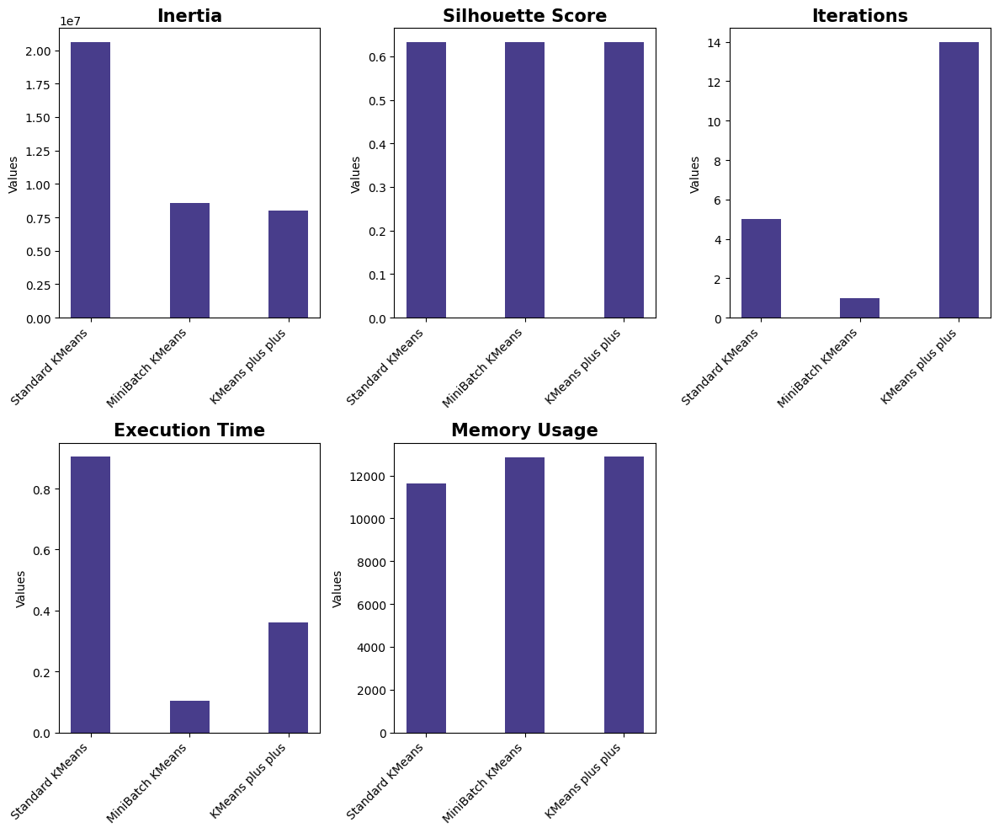

In [584]:
fig,ax=plt.subplots(2,3,figsize=(12,10))
metrics = MB_VS_KP["Metric"]
for i,ax in enumerate(ax.flatten()):
    if i < len(metrics):
      metric= metrics[i]
      values= MB_VS_KP.loc[MB_VS_KP["Metric"] == metric].iloc[0, 1:]
      labels= ["Standard KMeans", "MiniBatch KMeans","KMeans plus plus"]
      ax.bar(labels,values,width=.4,color='#483D8B')
      ax.set_title(metric, fontsize=15, fontweight="bold")
      ax.set_ylabel("Values")
      ax.tick_params(axis="y")
      ax.set_xticks([0, 1, 2])
      ax.set_xticklabels(labels, rotation=45, ha="right")
    else :
      ax.axis("off")
plt.tight_layout()
plt.show()

**NOTE:**
MiniBatch KMeans processes small random subsets ("mini-batches") of the dataset in each iteration rather than the entire dataset.

This means:

It loads and processes less data at a time, so memory footprint is smaller.






Standard KMeans and KMeans++ achieved identical inertia and silhouette scores, indicating similar clustering quality.

MiniBatch KMeans had slightly higher inertia and a lower silhouette score, reflecting slightly less cohesive clusters, but with significantly faster execution time and lower memory usage.

KMeans++ converged in fewer iterations than standard KMeans due to better centroid initialization, but took more time overall than MiniBatch KMeans.

MiniBatch KMeans required only 1 iteration, completing in ~0.094 sec, and using the least memory, making it a strong choice for large datasets where speed and efficiency are critical.

KMeans++, while slower than MiniBatch, offered better clustering performance than MiniBatch and is a good compromise between quality and efficiency.



 *Compare clustering in full space vs. reduced 2D space.*

In [585]:
mini_tsne=MiniBatchKMeans(n_clusters=2,random_state=42,init="random")
mini_tsne.fit(X_train_tsne2)
train_clusters_tsne=mini_tsne.predict(X_train_tsne2)

In [586]:
inertia_mini_tsne=mini_tsne.inertia_
silhouette_mini_tsne=silhouette_score(X_train_tsne2,train_clusters_tsne,sample_size=10000,random_state=42)
print("Inertia Value: ",inertia_mini_tsne)
print("Silhouette Score:",silhouette_mini_tsne)

Inertia Value:  8420202.0
Silhouette Score: 0.327852


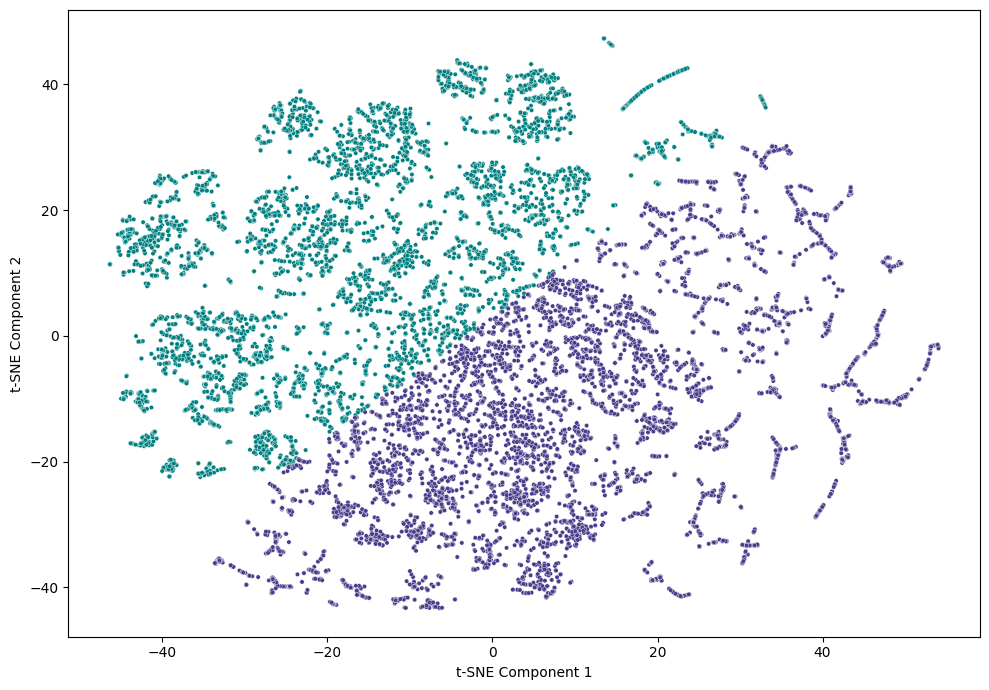

In [587]:
plt.figure(figsize=(10,7))
label=train_clusters_tsne
sns.scatterplot(x=X_train_tsne2[:, 0], y=X_train_tsne2[:, 1], hue=label, palette=['#483D8B','#008080'], s=10, legend=None)
#plt.title(f"t-SNE After Clustering (k={2})",  fontweight="bold")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()

In [588]:
mini_full=MiniBatchKMeans(n_clusters=2,random_state=42,init="random")
mini_full.fit(X_train_res2)
train_clusters_full=mini_full.predict(X_train_res2)

In [589]:
inertia_scaled = mini_full.inertia_
silhouette_scaled = silhouette_score(X_train_res, train_clusters_full, sample_size=10000, random_state=42)
print("Inertia Value: ",inertia_scaled)
print("Silhouette Score:",silhouette_scaled)

Inertia Value:  26719792.330163587
Silhouette Score: 0.6005165921751221


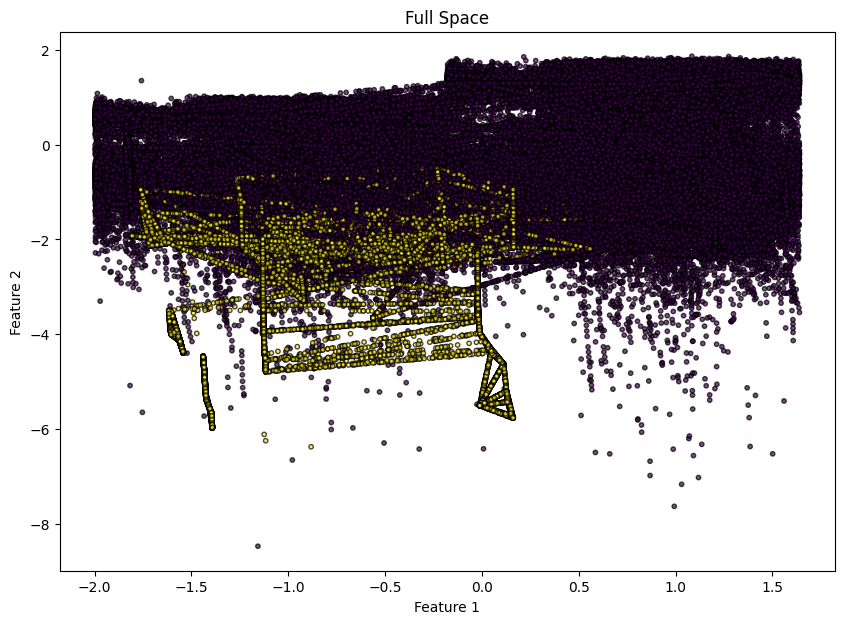

In [590]:
h=0.02
x_min,x_max=X_train_res2[:,0].min()-1,X_train_res2[:,0].max()+1
y_min,y_max=X_train_res2[:,1].min()-1,X_train_res2[:,1].max()+1
xx,yy=np.meshgrid(np.arange(x_min,x_max,h),
                  np.arange(y_min,y_max,h))
grid=np.zeros((xx.ravel().shape[0],X_train_res2.shape[1]))
grid[:,0]=xx.ravel()
grid[:,1]=yy.ravel()
cmap=plt.get_cmap('viridis',5)
plt.figure(figsize=(10,7))
Z=mini_full.predict(grid).reshape(xx.shape)
#plt.contourf(xx,yy,Z,cmap=cmap,alpha=0.2)
plt.scatter(X_train_res2[:,0],X_train_res2[:,1],c=train_clusters_full,cmap='viridis',s=10,edgecolor='k',alpha=0.7)
plt.title("Full Space")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

# **DBSCAN**

In [591]:
X_sample,_=train_test_split(X_train_res,train_size=0.1,random_state=42,stratify=y_train_res)
dbscan=DBSCAN()
y_pred=dbscan.fit_predict(X_sample)

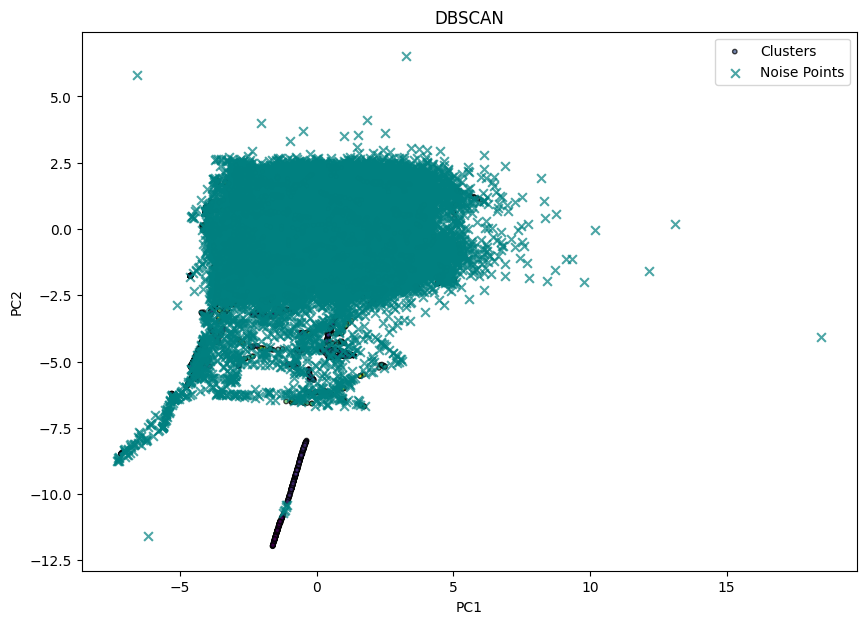

In [592]:
noise_points = X_sample[y_pred == -1]
cluster_points = X_sample[y_pred != -1]
plt.figure(figsize=(10,7))
plt.scatter(cluster_points[:,0],cluster_points[:,1],c=y_pred[y_pred!=-1],s=10,edgecolor='k',alpha=0.7,label='Clusters')
plt.scatter(noise_points[:,0],noise_points[:,1],marker='x',c='#008080',s=40,alpha=0.7,label='Noise Points')
plt.title("DBSCAN")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.show()

In [593]:
n_noise=list(y_pred).count(-1)
n_clusters= len(set(y_pred))-(1 if -1 in y_pred else 0)

print("Number of clusters found:", n_clusters)
print("Number of noise points: ",n_noise)
print("Percentage of noise points: ", (100 * n_noise / len(y_pred)))

Number of clusters found: 358
Number of noise points:  27252
Percentage of noise points:  85.5823885940395


We applied DBSCAN using the default parameter values, but the result showed that a large portion of the **data points were considered outliers**. This happened because the default parameter settings were not well-suited for our dataset

**Tune eps and min_samples**


eps: The maximum distance between two samples to be considered neighbors(radius).

min_samples: The number of points required to form a dense region (a core point).



In [594]:
scores={}
noise_percent={}

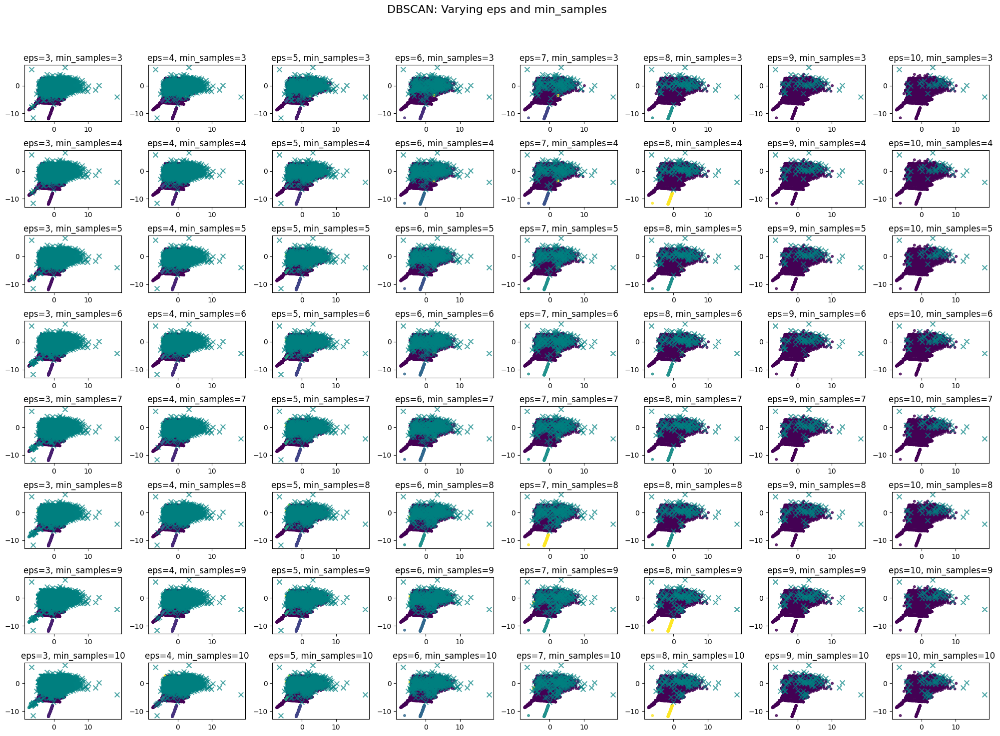

In [595]:
eps_values = [3,4,5,6,7,8,9,10]
min_samples_values = [3,4,5,6,7,8,9,10]

fig, axs = plt.subplots(len(min_samples_values), len(eps_values), figsize=(20, 15))
fig.suptitle("DBSCAN: Varying eps and min_samples", fontsize=16)

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        ax = axs[i, j]
        db = DBSCAN(eps=eps, min_samples=min_samples)
        y = db.fit_predict(X_sample)

        noise = y == -1
        clusters = y != -1
        n_clusters = len(set(y)) - (1 if -1 in y else 0)
        if n_clusters >= 2:
         score= silhouette_score(X_sample,y,sample_size=5000)
         scores[(eps,min_samples)]=score
        else:

         scores[(eps, min_samples)] = -1
        n_noise=list(y).count(-1)
        n_clusters= len(set(y))-(1 if -1 in y else 0)
        noise_percent[(eps,min_samples)]=(100 * n_noise / len(y))

        ax.scatter(X_sample[clusters, 0], X_sample[clusters, 1], c=y[clusters], s=10,alpha=0.8)
        ax.scatter(X_sample[noise, 0], X_sample[noise, 1], c='#008080', marker='x', s=50,alpha=0.7)
        ax.set_title(f"eps={eps}, min_samples={min_samples}")

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

In [596]:
best_param=max(scores, key=scores.get)
best_score=scores[best_param]
ns=min(noise_percent,key=noise_percent.get)
print(f"Best parameters: eps={best_param[0]}, min_samples={best_param[1]}")
print(f"Best Silhouette Score: {best_score}")
print(f"Noise Percentage: {noise_percent[ns]}")
print(ns[0])
print(ns[1])

Best parameters: eps=8, min_samples=8
Best Silhouette Score: 0.6133461687955123
Noise Percentage: 0.1193354897465691
10
3


In [597]:
print(noise_percent)


{(3, 3): 11.443645385170996, (4, 3): 3.975756053135697, (5, 3): 1.6047482963288635, (6, 3): 0.788242313852338, (7, 3): 0.4239550293628113, (8, 3): 0.2512326099927771, (9, 3): 0.1664416041202148, (10, 3): 0.1193354897465691, (3, 4): 12.47683949376629, (4, 4): 4.233269478378293, (5, 4): 1.7554878623245298, (6, 4): 0.8730333197249003, (7, 4): 0.46163992086172784, (8, 4): 0.27949627861696447, (9, 4): 0.18214364224476337, (10, 4): 0.1193354897465691, (3, 5): 13.387557704990108, (4, 5): 4.431115158747605, (5, 5): 1.8528404986967308, (6, 5): 0.8918757654743585, (7, 5): 0.4899035894859153, (8, 5): 0.29205790911660334, (9, 5): 0.1915648651194925, (10, 5): 0.12875671262129826, (3, 6): 14.069026159595515, (4, 6): 4.6415224696165565, (5, 6): 1.9125082435700154, (6, 6): 0.9107182112238168, (7, 6): 0.5024652199855542, (8, 6): 0.2983387243664228, (9, 6): 0.1915648651194925, (10, 6): 0.1381779354960274, (3, 7): 14.612316678704897, (4, 7): 4.7828408127374935, (5, 7): 1.9815972113180291, (6, 7): 0.92642

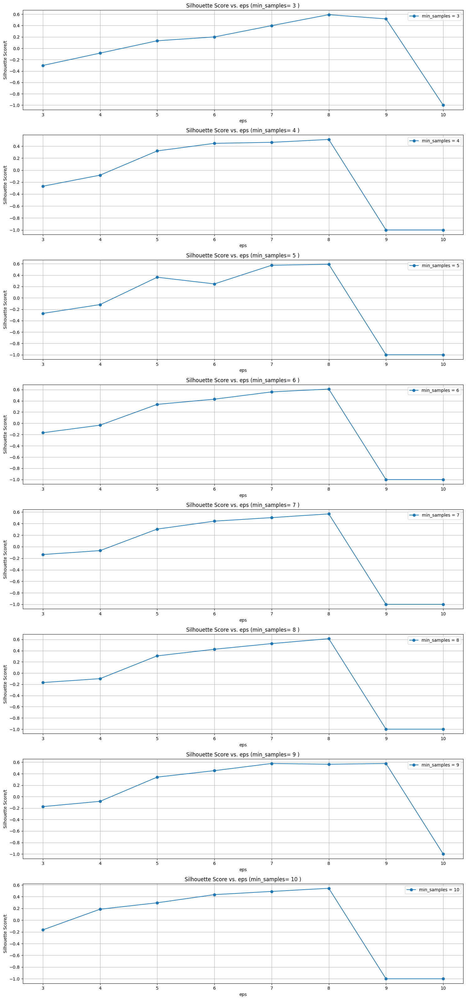

In [598]:
plt.figure(figsize=(15, 4*len(min_samples_values)))
for i, min_samples in enumerate(min_samples_values, 1):
    eps_values = sorted([k[0] for k in scores.keys() if k[1] == min_samples])
    scores_for_min_samples = [scores[(eps, min_samples)] for eps in eps_values]
    plt.subplot(len(min_samples_values), 1, i)
    plt.plot(eps_values, scores_for_min_samples, 'o-', label=f'min_samples = {min_samples}')
    plt.xlabel('eps')
    plt.ylabel('Silhouette Score/t')
    plt.title(f'Silhouette Score vs. eps (min_samples= {min_samples} )')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()


In [599]:
'''def silhouette_scorer(estimator, x_scaled_m):
    labels = estimator.fit_predict(x_scaled_m)
    if len(set(labels)) > 1 and -1 not in set(labels):
        return silhouette_score(x_scaled_m, labels,sample_size=5000)
    else:
        return -1

dbcan_grid = {'eps': [7,3,4, 5, 6, 9, 10],
              'min_samples': [5,6,7,8,9,10,11]}
dbcanSearch = GridSearchCV(DBSCAN(), dbcan_grid, scoring=silhouette_scorer)
dbcanSearch.fit(X_sample)

print(dbcanSearch.best_score_)
print(dbcanSearch.best_params_)
dbcan = DBSCAN(eps=7, min_samples=5)
dbcan.fit(X_sample)'''

"def silhouette_scorer(estimator, x_scaled_m):\n    labels = estimator.fit_predict(x_scaled_m)\n    if len(set(labels)) > 1 and -1 not in set(labels):\n        return silhouette_score(x_scaled_m, labels,sample_size=5000)\n    else:\n        return -1\n\ndbcan_grid = {'eps': [7,3,4, 5, 6, 9, 10],\n              'min_samples': [5,6,7,8,9,10,11]}\ndbcanSearch = GridSearchCV(DBSCAN(), dbcan_grid, scoring=silhouette_scorer)\ndbcanSearch.fit(X_sample)\n\nprint(dbcanSearch.best_score_)\nprint(dbcanSearch.best_params_)\ndbcan = DBSCAN(eps=7, min_samples=5)\ndbcan.fit(X_sample)"

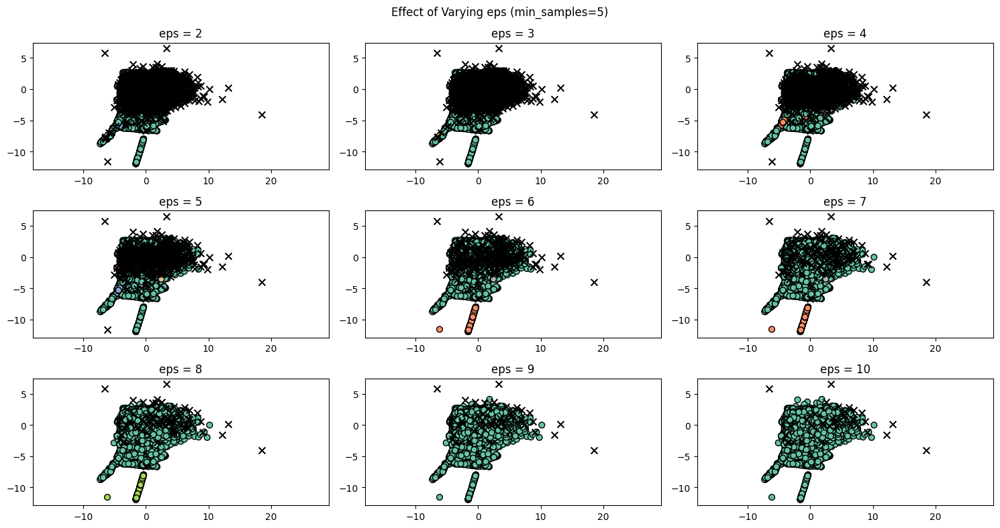

In [600]:
eps_values = [2, 3,4,5,6,7,8,9,10]
plt.figure(figsize=(15, 8))
for i, eps in enumerate(eps_values):
    y = DBSCAN(eps=eps, min_samples=3).fit_predict(X_sample)
    noise = y == -1
    clusters = y != -1

    plt.subplot(3, 3, i+1 )
    plt.scatter(X_sample[clusters, 0], X_sample[clusters, 1], c=y[clusters], cmap='Set2', s=40, edgecolor='k')
    plt.scatter(X_sample[noise, 0], X_sample[noise, 1], c='black', marker='x', s=50)
    plt.title(f"eps = {eps}")
    plt.axis('equal')


plt.suptitle("Effect of Varying eps (min_samples=5)")
plt.tight_layout()
plt.show()

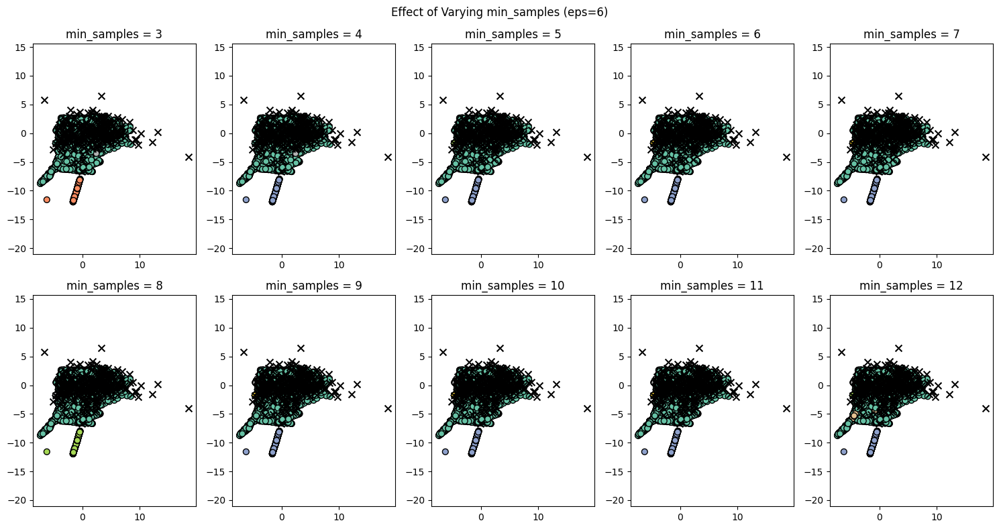

In [601]:
min_samples_values = [3,4, 5,6,7,8,9,10,11,12]
plt.figure(figsize=(15, 8))
for i, ms in enumerate(min_samples_values):
    y = DBSCAN(eps=6, min_samples=ms).fit_predict(X_sample)
    noise = y == -1
    clusters = y != -1

    plt.subplot(2, 5, i + 1)
    plt.scatter(X_sample[clusters, 0], X_sample[clusters, 1], c=y[clusters], cmap='Set2', s=40, edgecolor='k')
    plt.scatter(X_sample[noise, 0], X_sample[noise, 1], c='black', marker='x', s=50)
    plt.title(f"min_samples = {ms}")
    plt.axis('equal')

plt.suptitle("Effect of Varying min_samples (eps=6)")
plt.tight_layout()
plt.show()

We performed a manual grid search by testing a range of values for eps and min_samples. At first, we used a wide range to cover all possible cases, but due to DBSCAN’s poor performance on large datasets, we later narrowed it down to a smaller set of values.

In DBSCAN, noise points are those that do not belong to any cluster — they're considered outliers or anomalies

In [602]:
dbscan=DBSCAN(eps=6, min_samples=7)
labels=dbscan.fit_predict(X_sample)

n_noise=list(labels).count(-1)
n_clusters= len(set(labels))-(1 if -1 in labels else 0)

print("Number of clusters found:", n_clusters)
print("Number of noise points: ",n_noise)
print("Percentage of noise points: ", (100 * n_noise / len(labels)))

Number of clusters found: 4
Number of noise points:  295
Percentage of noise points:  0.9264202493483654


After tuning the DBSCAN parameters, the algorithm successfully identified one cluster along with several noise points. This result aligns with the nature of the dataset, which is expected to contain a single dense group (normal transactions) and scattered outliers (fraud cases).

**DBSCAN detected X noise points — and this shows its strength in separating structure from randomness.**

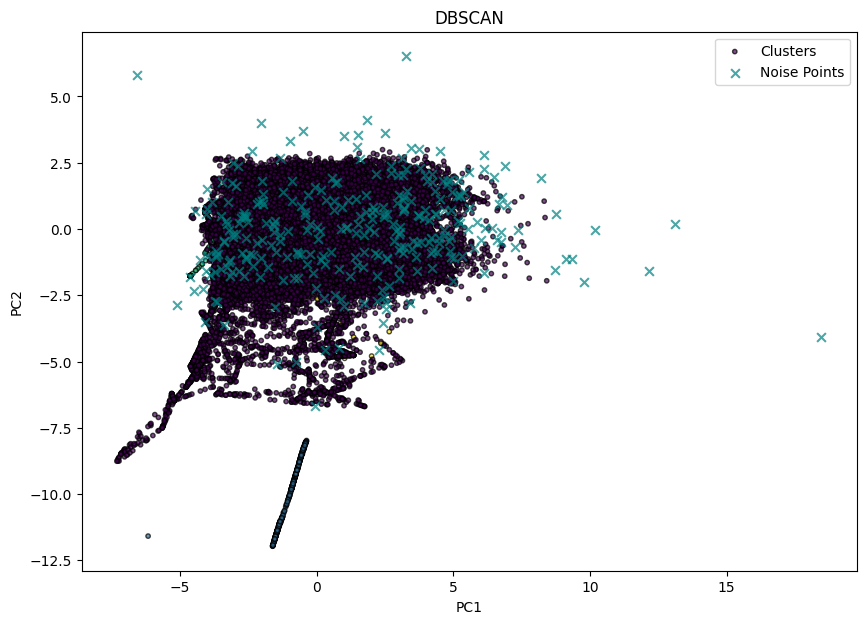

In [603]:
noise_points=X_sample[labels == -1]
cluster_points= X_sample[labels != -1]
plt.figure(figsize=(10,7))
plt.scatter(cluster_points[:,0],cluster_points[:,1],c=labels[labels!=-1],s=10,edgecolor='k',alpha=0.7,label='Clusters')
plt.scatter(noise_points[:,0],noise_points[:,1],c='#008080',s=40,alpha=0.7,marker='x',label='Noise Points')
plt.title("DBSCAN")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.show()

In [604]:
if len(set(labels) - {-1}) > 1:
    score_dbscan_ch= calinski_harabasz_score(X_sample, labels)
else:
    score_dbscan_ch= -1

print("Calinski-Harabasz Score - DBSCAN:", score_dbscan_ch)

Calinski-Harabasz Score - DBSCAN: 1561.9207311587209


DBSCAN formed only one cluster or all points were labeled as noise. Calinski-Harabasz score is not defined in this case

In [605]:
Ndf=pd.DataFrame(noise_points)
print("Noise stats:\n", Ndf.describe())

Noise stats:
                0           1           2           3           4           5   \
count  295.000000  295.000000  295.000000  295.000000  295.000000  295.000000   
mean     1.384503   -0.053474    0.006124    0.133455    0.666531    0.103362   
std      3.648131    1.779136    4.063552    2.572197    2.722760    3.987692   
min     -6.552198   -6.660302  -15.029948   -8.354764  -11.506529  -17.625731   
25%     -1.721034   -1.072624   -2.073927   -1.308669   -0.476414   -1.798515   
50%      1.589395   -0.042002   -0.603666   -0.321004    0.730270   -0.238940   
75%      3.876082    1.048368    1.059760    0.678292    2.069059    1.522992   
max     18.472386    6.519423   17.724701   12.495484   12.044697   25.882235   

               6           7           8           9   ...          16  \
count  295.000000  295.000000  295.000000  295.000000  ...  295.000000   
mean     1.123166    0.316422    0.210794   -0.590249  ...   -0.646500   
std      5.812312    3.190883    3

DBSCAN identified 312 noise points, representing 1.24% of the data. Based on feature distribution analysis, these points showed significantly different behavior compared to clustered data. This suggests that DBSCAN was effective in identifying potential fraudulent or anomalous transactions

**Number of Clusters:**


* The plot shows 2 main clusters (each represented by a distinct color).

* The clusters are densely packed in the center, indicating high-density regions.

**Noise Points:**

* The black 'X' markers represent noise points (outliers).

These points were classified as noise because:

They have fewer than min_samples neighbors within the eps radius.

They are likely located at the edges or far from the main clusters.

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 31843 samples in 0.001s...
[t-SNE] Computed neighbors for 31843 samples in 1.131s...
[t-SNE] Computed conditional probabilities for sample 1000 / 31843
[t-SNE] Computed conditional probabilities for sample 2000 / 31843
[t-SNE] Computed conditional probabilities for sample 3000 / 31843
[t-SNE] Computed conditional probabilities for sample 4000 / 31843
[t-SNE] Computed conditional probabilities for sample 5000 / 31843
[t-SNE] Computed conditional probabilities for sample 6000 / 31843
[t-SNE] Computed conditional probabilities for sample 7000 / 31843
[t-SNE] Computed conditional probabilities for sample 8000 / 31843
[t-SNE] Computed conditional probabilities for sample 9000 / 31843
[t-SNE] Computed conditional probabilities for sample 10000 / 31843
[t-SNE] Computed conditional probabilities for sample 11000 / 31843
[t-SNE] Computed conditional probabilities for sample 12000 / 31843
[t-SNE] Computed conditional probabilities for sam

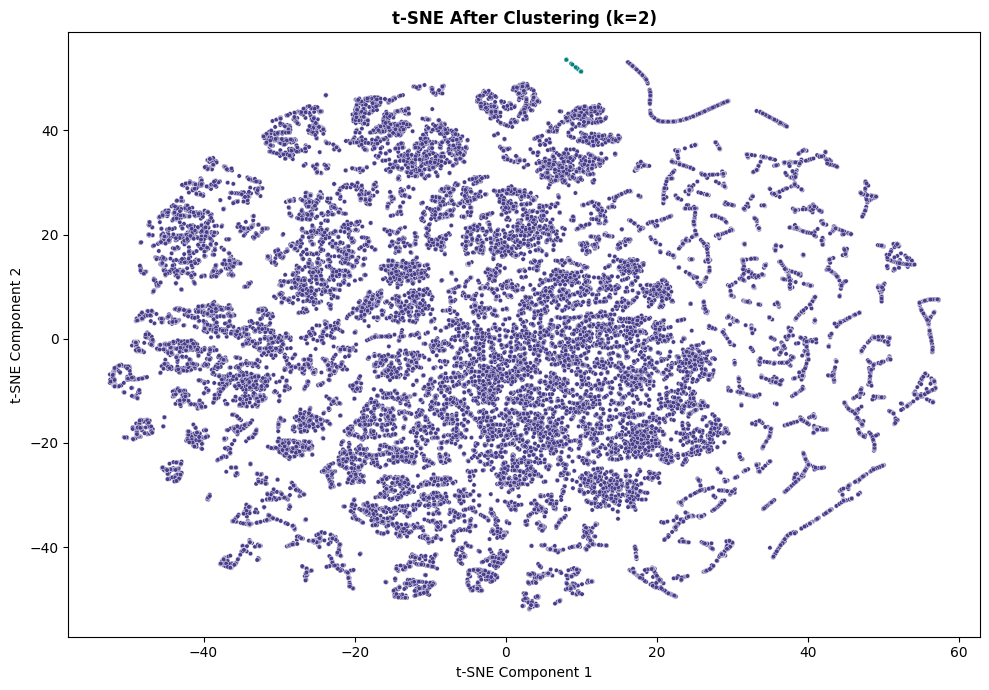

In [606]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=500, verbose=1)
X_train_tsne = tsne.fit_transform(X_sample)
db=DBSCAN(eps=6, min_samples=5)
y_pred=db.fit_predict(X_train_tsne)
plt.figure(figsize=(10,7))
sns.scatterplot(x=X_train_tsne[:, 0], y=X_train_tsne[:, 1], hue=y_pred, palette=['#483D8B','#008080'], s=10, legend=None)
plt.title(f"t-SNE After Clustering (k={2})",  fontweight="bold")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()

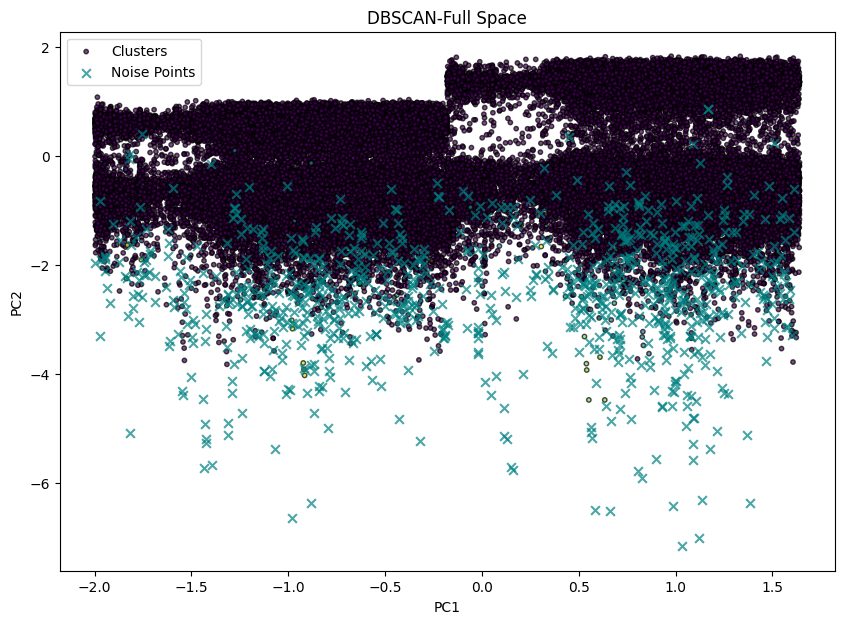

In [607]:
X_sample_full,_=train_test_split(X_train_scaled,train_size=.4,stratify=y_train)
db=DBSCAN(eps=6, min_samples=5)
y_pred=db.fit_predict(X_sample_full)
noise_points=X_sample_full[y_pred == -1]
cluster_points= X_sample_full[y_pred != -1]
plt.figure(figsize=(10,7))
plt.scatter(cluster_points[:,0],cluster_points[:,1],c=y_pred[y_pred!=-1],s=10,edgecolor='k',alpha=0.7,label='Clusters')
plt.scatter(noise_points[:,0],noise_points[:,1],c='#008080',s=40,alpha=0.7,marker='x',label='Noise Points')
plt.title("DBSCAN-Full Space")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.show()

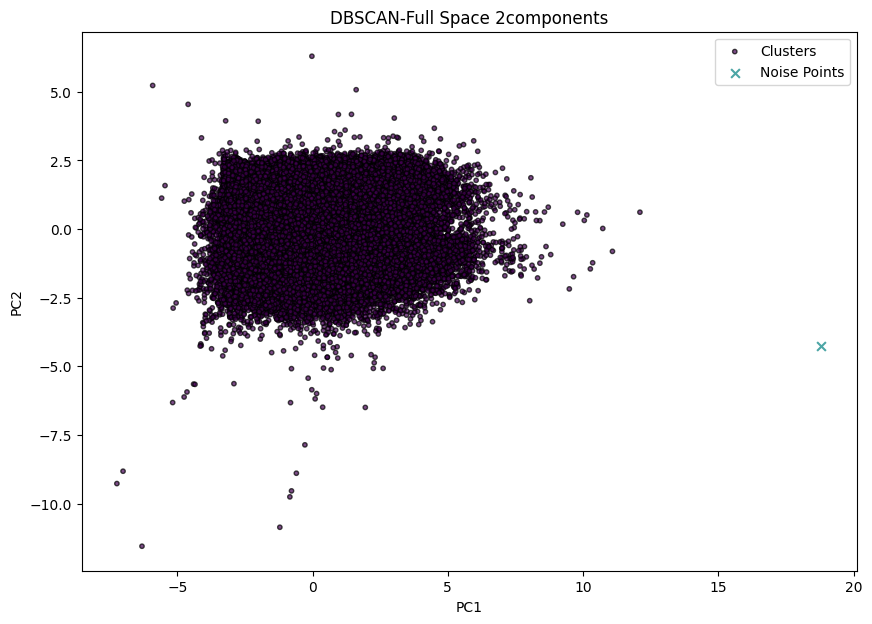

In [608]:
pca2d=PCA(n_components=2)
X_sample_full_pca=pca2d.fit_transform(X_sample_full)

db=DBSCAN(eps=6, min_samples=5)
y_pred=db.fit_predict(X_sample_full_pca)
noise_points=X_sample_full_pca[y_pred == -1]
cluster_points= X_sample_full_pca[y_pred != -1]
plt.figure(figsize=(10,7))
plt.scatter(cluster_points[:,0],cluster_points[:,1],c=y_pred[y_pred!=-1],s=10,edgecolor='k',alpha=0.7,label='Clusters')
plt.scatter(noise_points[:,0],noise_points[:,1],c='#008080',s=40,alpha=0.7,marker='x',label='Noise Points')
plt.title("DBSCAN-Full Space 2components")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.show()

Plot clusters and compare to K-Means clusters

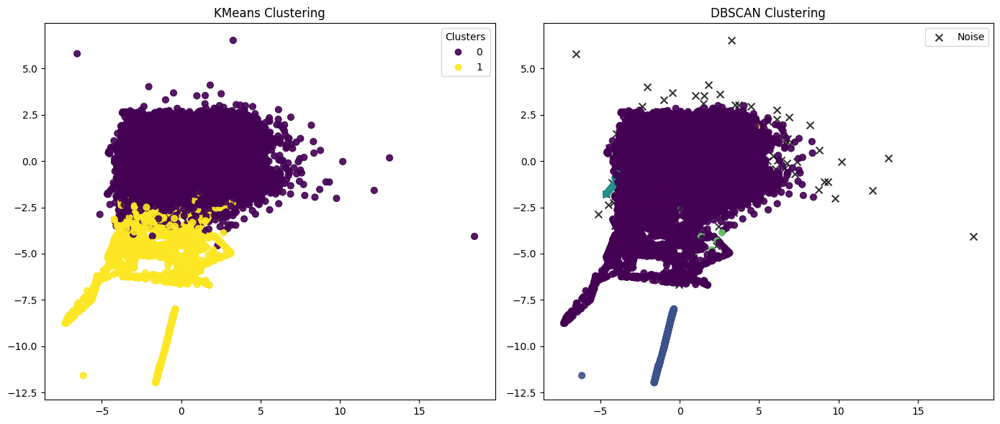

In [609]:
kmeans = KMeans(n_clusters=2, random_state=0)
y_kmeans = kmeans.fit_predict(X_sample)

dbscan = DBSCAN(eps=6, min_samples=5)
y_dbscan = dbscan.fit_predict(X_sample)

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
scatter_kmeans = axs[0].scatter(X_sample[:, 0], X_sample[:, 1], c=y_kmeans, cmap=plt.cm.viridis, s=40, alpha=0.9)
axs[0].set_title("KMeans Clustering")
axs[0].legend(*scatter_kmeans.legend_elements(), title="Clusters")

noise_points = X_sample[y_dbscan == -1]
axs[1].scatter(noise_points[:, 0], noise_points[:, 1], color='black', marker='x', s=50, label="Noise", alpha=0.8)

valid_points = X_sample[y_dbscan != -1]
valid_labels = y_dbscan[y_dbscan != -1]
scatter_dbscan = axs[1].scatter(valid_points[:, 0], valid_points[:, 1], c=valid_labels, cmap=plt.cm.viridis, s=40, alpha=0.9)

axs[1].set_title("DBSCAN Clustering")
axs[1].legend()
plt.tight_layout()
plt.show()


In [610]:
evaluations = {'KMeans': {'Silhouette Score': silhouette_score(X_sample, y_kmeans), 'Davies-Bouldin Index': davies_bouldin_score(X_sample, y_kmeans), 'Calinski-Harabasz Score':calinski_harabasz_score(X_sample, y_kmeans)}}


if len(set(y_dbscan) - {-1}) > 1:
    evaluations['DBSCAN'] ={
        'Silhouette Score': silhouette_score(X_sample[y_dbscan != -1], y_dbscan[y_dbscan != -1]),
        'Davies-Bouldin Index': davies_bouldin_score(X_sample[y_dbscan != -1], y_dbscan[y_dbscan != -1]),
        'Calinski-Harabasz Score': calinski_harabasz_score(X_sample[y_dbscan != -1], y_dbscan[y_dbscan != -1])
    }
else:
    evaluations['DBSCAN'] = {'Silhouette Score': -1, 'Davies-Bouldin Index': -1, 'Calinski-Harabasz Score': -1}

In [611]:
evaluations=pd.DataFrame(evaluations)
evaluations

,KMeans,DBSCAN
Silhouette Score,0.641053,0.255124
Davies-Bouldin Index,0.976522,0.576847
Calinski-Harabasz Score,16620.797121,1584.361181


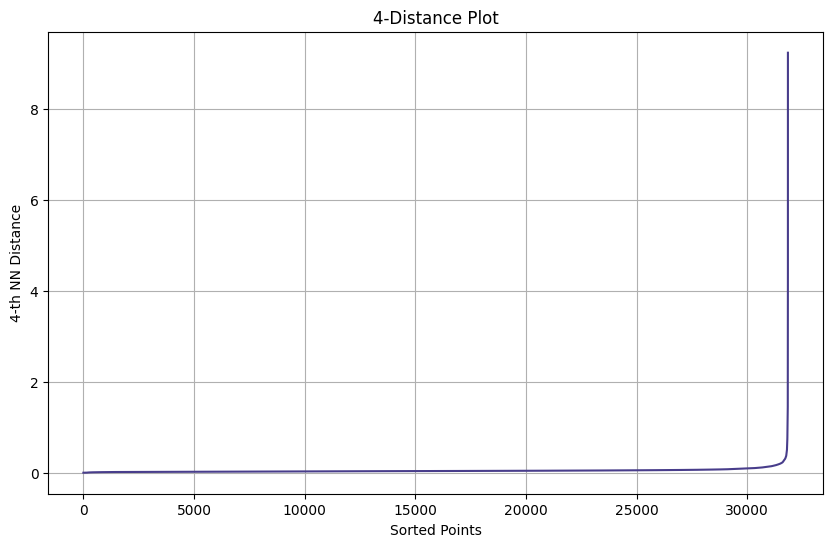

In [612]:
X = X_sample[:,:2]
neigh = NearestNeighbors(n_neighbors=5)
neigh.fit(X)
distances, indices = neigh.kneighbors(X)
k_distances = np.sort(distances[:, 4])
plt.figure(figsize=(10,6))
plt.plot(k_distances,color='#483D8B')
plt.xlabel("Sorted Points")
plt.ylabel("4-th NN Distance")
plt.title("4-Distance Plot")
plt.grid(True)
plt.show()

The first ~20,000 points have very small distances (close to 0), indicating a densely packed region.
These points are likely part of the core clusters, where each point is very close to its 4th nearest neighbor.

Around 20,000 points, there is a sudden upward curve, indicating a "knee" or "elbow" point

# Anomaly Detection

**Isolation Forest**

In [613]:
Xsample, x_test_iso, ysample, y_test_iso = train_test_split(X_train_res,y_train_res, train_size=0.2, random_state=42, stratify=y_train_res)
iso_model = IsolationForest()
iso_model.fit(Xsample)
y_pred = iso_model.predict(x_test_iso)
print(y_pred)
y_pred_f=np.where(y_pred==-1,1,0)
print(y_pred_f)


[ 1 -1  1 ...  1  1  1]
[0 1 0 ... 0 0 0]


Isolation Forest is an unsupervised anomaly detection model trained on a stratified subset of resampled data, using 150 estimators and a contamination factor of 0.1 to identify rare fraudulent transactions. The model outputs were converted to binary (fraud = 1, normal = 0) for accurate evaluation.

In [614]:
print("Isolation Forest Classification Report:")
print(classification_report(y_test_iso, y_pred_f))

Isolation Forest Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.99      0.86    181961
           1       0.90      0.25      0.39     72784

    accuracy                           0.78    254745
   macro avg       0.83      0.62      0.63    254745
weighted avg       0.81      0.78      0.73    254745



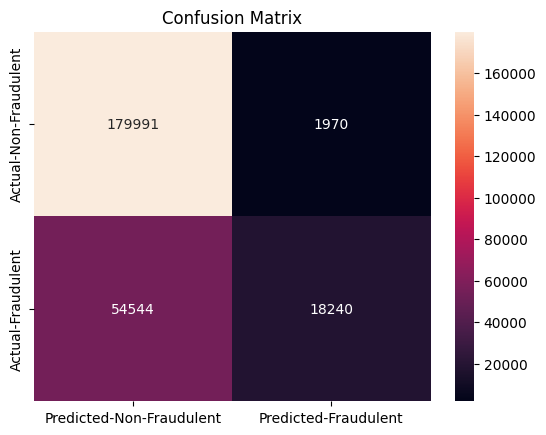

array([[179991,   1970],
       [ 54544,  18240]])

In [615]:
cm=confusion_matrix(y_test_iso, y_pred_f)
cmdf=pd.DataFrame(cm,columns=['Predicted-Non-Fraudulent','Predicted-Fraudulent'],index=['Actual-Non-Fraudulent','Actual-Fraudulent'])
sns.heatmap(cmdf,annot=True,fmt='d')
plt.title('Confusion Matrix')
plt.show()
cm

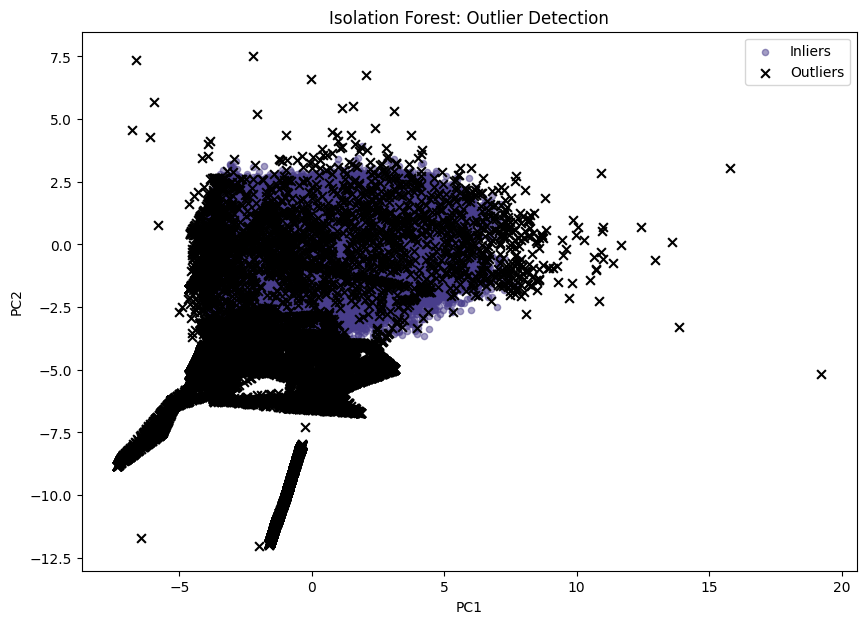

In [616]:
outliers = x_test_iso[y_pred == -1]
inliers = x_test_iso[y_pred == 1]

plt.figure(figsize=(10, 7))
plt.scatter(inliers[:, 0], inliers[:, 1], label='Inliers', c='#483D8B', s=20, alpha=0.5)
plt.scatter(outliers[:, 0], outliers[:, 1], label='Outliers',marker='x', c='k', s=40)
plt.title('Isolation Forest: Outlier Detection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [617]:
iso_model = IsolationForest(random_state=42)
iso_model.fit(Xsample)
y_pred = iso_model.predict(x_test_iso)
print(y_pred)
y_pred_f=np.where(y_pred==-1,1,0)
print(y_pred_f)


[ 1 -1  1 ...  1  1  1]
[0 1 0 ... 0 0 0]


In [618]:
print("Isolation Forest Classification Report:")
print(classification_report(y_test_iso, y_pred_f))

Isolation Forest Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.99      0.87    181961
           1       0.89      0.27      0.41     72784

    accuracy                           0.78    254745
   macro avg       0.83      0.63      0.64    254745
weighted avg       0.81      0.78      0.74    254745



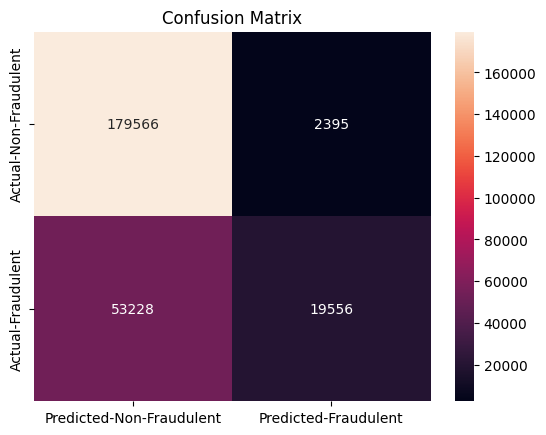

array([[179566,   2395],
       [ 53228,  19556]])

In [619]:
cm=confusion_matrix(y_test_iso, y_pred_f)
cmdf=pd.DataFrame(cm,columns=['Predicted-Non-Fraudulent','Predicted-Fraudulent'],index=['Actual-Non-Fraudulent','Actual-Fraudulent'])
sns.heatmap(cmdf,annot=True,fmt='d')
plt.title('Confusion Matrix')
plt.show()
cm

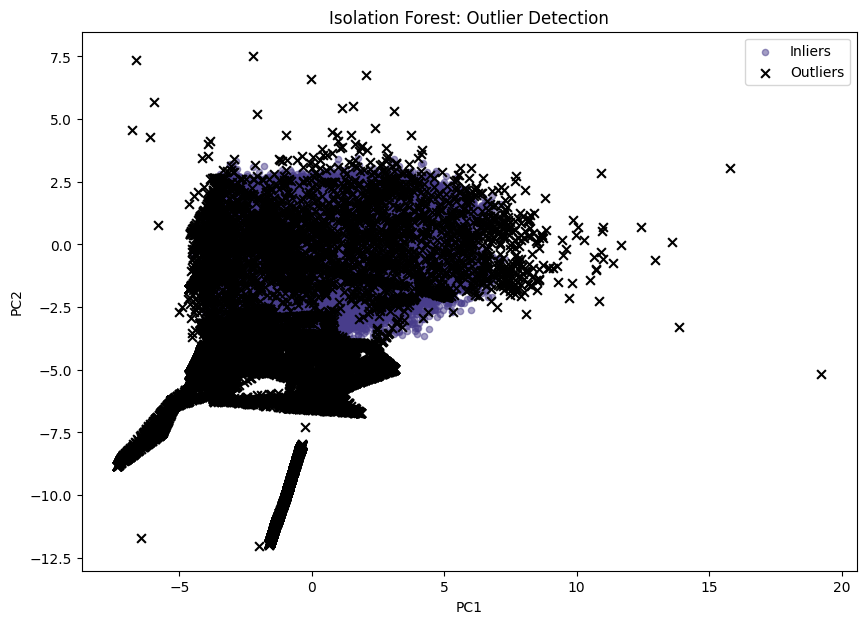

In [620]:
outliers = x_test_iso[y_pred == -1]
inliers = x_test_iso[y_pred == 1]

plt.figure(figsize=(10, 7))
plt.scatter(inliers[:, 0], inliers[:, 1], label='Inliers', c='#483D8B', s=20, alpha=0.5)
plt.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', c='k', s=40, marker='x')
plt.title('Isolation Forest: Outlier Detection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [621]:
'''param_grid = {
    'n_estimators': [50, 100, 150],
    'max_samples': [256, 512, 1000, 2000],
    'contamination': [0.03, 0.08, 0.2, 0.3],
    'max_features': [0.5, 0.75, 1.0]
}

# Initialize the model
model = IsolationForest(random_state=0)

# Use GridSearchCV
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='f1',
    cv=3,
    verbose=2,
    n_jobs=-1
)


grid_search.fit(Xsample, np.zeros(Xsample.shape[0])) '''

"param_grid = {\n    'n_estimators': [50, 100, 150],\n    'max_samples': [256, 512, 1000, 2000],\n    'contamination': [0.03, 0.08, 0.2, 0.3],\n    'max_features': [0.5, 0.75, 1.0]\n}\n\n# Initialize the model\nmodel = IsolationForest(random_state=0)\n\n# Use GridSearchCV\ngrid_search = GridSearchCV(\n    estimator=model,\n    param_grid=param_grid,\n    scoring='f1',\n    cv=3,\n    verbose=2,\n    n_jobs=-1\n)\n\n\ngrid_search.fit(Xsample, np.zeros(Xsample.shape[0])) "

In [622]:
'''best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_f1 = grid_search.best_score_'''

'best_model = grid_search.best_estimator_\nbest_params = grid_search.best_params_\nbest_f1 = grid_search.best_score_'

In [623]:
'''y_pred_best = np.where(best_model.predict(x_test_iso) == -1, 1, 0)'''

'y_pred_best = np.where(best_model.predict(x_test_iso) == -1, 1, 0)'

In [624]:
'''print("\nBest F1 Score:", best_f1)
print("Best Parameters:", best_params)
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_best))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_best))'''

'print("\nBest F1 Score:", best_f1)\nprint("Best Parameters:", best_params)\nprint("\nClassification Report for Best Model:")\nprint(classification_report(y_test_iso, y_pred_best))\nprint("\nConfusion Matrix for Best Model:")\nprint(confusion_matrix(y_test_iso, y_pred_best))'

In [625]:
iso_model = IsolationForest(n_estimators=500,max_samples=100,max_features=.9,contamination=.1,random_state=42)
iso_model.fit(Xsample)
y_pred_best1 = np.where(iso_model.predict(x_test_iso) == -1, 1, 0)

In [626]:
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_best1))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_best1))


Classification Report for Best Model:
              precision    recall  f1-score   support

           0       0.78      0.99      0.87    181961
           1       0.90      0.31      0.46     72784

    accuracy                           0.79    254745
   macro avg       0.84      0.65      0.67    254745
weighted avg       0.82      0.79      0.75    254745


Confusion Matrix for Best Model:
[[179527   2434]
 [ 50264  22520]]


This code performs a manual grid search over different hyperparameter values to visually examine and compare the impact of each value on the model's output.

In [627]:
'''param_grid = {
    'n_estimators': [50, 100, 150],
    'max_samples': [256, 512, 1000,2000],
    'contamination': [0.03, 0.08,0.2,0.3],
    'max_features': [0.5, 0.75, 1.0]
}

best_f1 = 0
best_params = None
best_model = None
for n_estimators in param_grid['n_estimators']:
    for max_samples in param_grid['max_samples']:
        for contamination in param_grid['contamination']:
            for max_features in param_grid['max_features']:
                model = IsolationForest(n_estimators=n_estimators, max_samples=max_samples,contamination=contamination,max_features=max_features, random_state=0
                )
                model.fit(Xsample)
                y_pred = model.predict(x_test_iso)
                y_pred_f = np.where(y_pred == -1, 1, 0)
                current_f1 = f1_score(y_test_iso, y_pred_f)
                if current_f1 > best_f1:
                    best_f1 = current_f1
                    best_params = {
                        'n_estimators': n_estimators,
                        'max_samples': max_samples,
                        'contamination': contamination,
                        'max_features': max_features
                    }
                    best_model = model

                print(f"Params: n_estimators={n_estimators}, max_samples={max_samples}, contamination={contamination}, max_features={max_features} --> F1: {current_f1:.4f}")

print("\nBest F1 Score:", best_f1)
print("Best Parameters:", best_params)

y_pred_best = best_model.predict(x_test_iso)
y_pred_best_f = np.where(y_pred_best == -1, 1, 0)

print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_best_f))

print("Confusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_best_f))
'''

'param_grid = {\n    \'n_estimators\': [50, 100, 150],\n    \'max_samples\': [256, 512, 1000,2000],\n    \'contamination\': [0.03, 0.08,0.2,0.3],\n    \'max_features\': [0.5, 0.75, 1.0]\n}\n\nbest_f1 = 0\nbest_params = None\nbest_model = None\nfor n_estimators in param_grid[\'n_estimators\']:\n    for max_samples in param_grid[\'max_samples\']:\n        for contamination in param_grid[\'contamination\']:\n            for max_features in param_grid[\'max_features\']:\n                model = IsolationForest(n_estimators=n_estimators, max_samples=max_samples,contamination=contamination,max_features=max_features, random_state=0\n                )\n                model.fit(Xsample)\n                y_pred = model.predict(x_test_iso)\n                y_pred_f = np.where(y_pred == -1, 1, 0)\n                current_f1 = f1_score(y_test_iso, y_pred_f)\n                if current_f1 > best_f1:\n                    best_f1 = current_f1\n                    best_params = {\n                    

In [628]:
iso_model = IsolationForest(n_estimators= 50, max_samples=2000, contamination= 0.3, max_features= 0.75,random_state=42)

In [629]:
iso_model.fit(Xsample)
y_pred = iso_model.predict(x_test_iso)
print(y_pred)
y_pred_f=np.where(y_pred==-1,1,0)
print(y_pred_f)

[-1 -1  1 ...  1 -1 -1]
[1 1 0 ... 0 1 1]


In [630]:
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_f))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_f))


Classification Report for Best Model:
              precision    recall  f1-score   support

           0       0.88      0.86      0.87    181961
           1       0.67      0.71      0.69     72784

    accuracy                           0.82    254745
   macro avg       0.78      0.78      0.78    254745
weighted avg       0.82      0.82      0.82    254745


Confusion Matrix for Best Model:
[[156792  25169]
 [ 21257  51527]]


In [631]:
iso_model = IsolationForest(n_estimators=50, max_samples=1000, contamination= 0.3, max_features= 0.5,random_state=42)

In [632]:
iso_model.fit(Xsample)
y_pred = iso_model.predict(x_test_iso)
print(y_pred)
y_pred_f=np.where(y_pred==-1,1,0)
print(y_pred_f)

[ 1 -1  1 ...  1 -1 -1]
[0 1 0 ... 0 1 1]


In [633]:
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_f))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_f))


Classification Report for Best Model:
              precision    recall  f1-score   support

           0       0.89      0.87      0.88    181961
           1       0.69      0.72      0.71     72784

    accuracy                           0.83    254745
   macro avg       0.79      0.80      0.79    254745
weighted avg       0.83      0.83      0.83    254745


Confusion Matrix for Best Model:
[[158089  23872]
 [ 20024  52760]]


First Model

In [634]:
iso_modelF = IsolationForest(n_estimators= 10, max_samples=1000, contamination= 0.2, max_features= 0.5,random_state=42)

In [635]:
iso_modelF.fit(Xsample)
y_pred = iso_modelF.predict(x_test_iso)
print(y_pred)
y_pred_f=np.where(y_pred==-1,1,0)
print(y_pred_f)

[ 1 -1  1 ...  1  1  1]
[0 1 0 ... 0 0 0]


In [636]:
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_f))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_f))


Classification Report for Best Model:
              precision    recall  f1-score   support

           0       0.85      0.96      0.90    181961
           1       0.85      0.59      0.70     72784

    accuracy                           0.85    254745
   macro avg       0.85      0.77      0.80    254745
weighted avg       0.85      0.85      0.84    254745


Confusion Matrix for Best Model:
[[174117   7844]
 [ 29633  43151]]


Second Model

In [637]:
iso_model = IsolationForest(n_estimators= 150, max_samples=256, contamination= 0.1, max_features= 0.75,random_state=42)

In [638]:
iso_model.fit(Xsample)
y_pred = iso_model.predict(x_test_iso)
print(y_pred)
y_pred_f2=np.where(y_pred==-1,1,0)
print(y_pred_f)

[ 1 -1  1 ...  1  1  1]
[0 1 0 ... 0 0 0]


In [639]:
print("\nClassification Report for Best Model:")
print(classification_report(y_test_iso, y_pred_f2))
print("\nConfusion Matrix for Best Model:")
print(confusion_matrix(y_test_iso, y_pred_f2))


Classification Report for Best Model:
              precision    recall  f1-score   support

           0       0.78      0.98      0.87    181961
           1       0.88      0.30      0.45     72784

    accuracy                           0.79    254745
   macro avg       0.83      0.64      0.66    254745
weighted avg       0.81      0.79      0.75    254745


Confusion Matrix for Best Model:
[[178847   3114]
 [ 50691  22093]]


**First Model:**

* Higher Precision for Class 1 (0.85) - Better at reducing false positives (predicting fraud when it's not).

* Lower Recall for Class 1 (0.30) - Misses a lot of actual fraud cases.

* Higher Weighted F1-Score (0.74) - Slightly better overall balance.

**Second Model:**

* Better Recall for Class 1 (0.46) - Catches more actual fraud cases.

* Balanced F1-Scores (0.54 for Class 1 and 0.85 for Class 0) - More balanced, which is often preferable in fraud detection.

* Higher True Positive Count (33,466 vs. 21,622) - Significantly more actual frauds detected.



use actual fraud labels

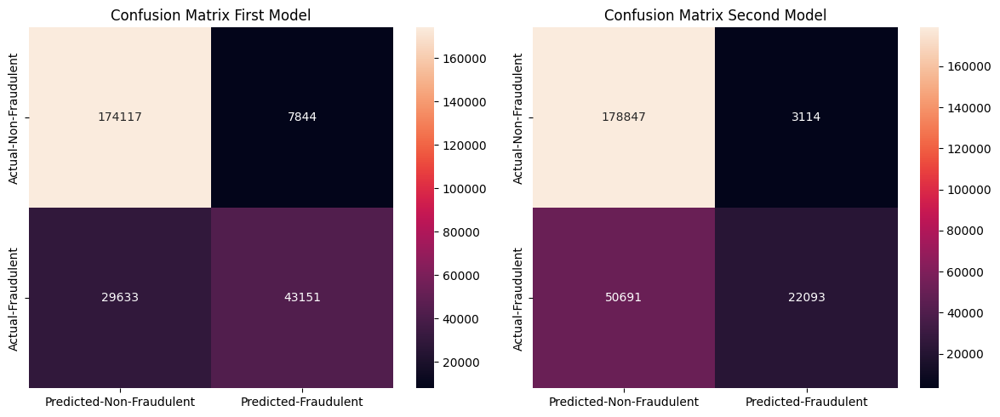

In [640]:
fig,ax= plt.subplots(1,2,figsize=(12,5))
cm1=confusion_matrix(y_test_iso, y_pred_f)
cmdf1=pd.DataFrame(cm1,columns=['Predicted-Non-Fraudulent','Predicted-Fraudulent'],index=['Actual-Non-Fraudulent','Actual-Fraudulent'])
sns.heatmap(cmdf1,annot=True,fmt='d',ax=ax[0])
ax[0].set_title('Confusion Matrix First Model')

cm2=confusion_matrix(y_test_iso, y_pred_f2)
cmdf2=pd.DataFrame(cm2,columns=['Predicted-Non-Fraudulent','Predicted-Fraudulent'],index=['Actual-Non-Fraudulent','Actual-Fraudulent'])
sns.heatmap(cmdf2,annot=True,fmt='d',ax=ax[1])
ax[1].set_title('Confusion Matrix Second Model')

plt.tight_layout()
plt.show()

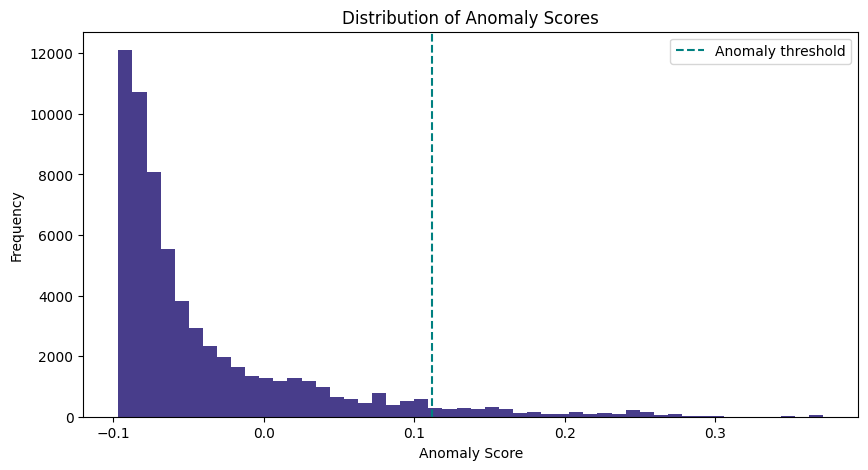

In [641]:
scores = -iso_modelF.decision_function(Xsample)  # decision_function(Xsample) returns the anomaly score for each sample(higher==more anomalous)

plt.figure(figsize=(10, 5))
plt.hist(scores, bins=50, color='#483D8B')
plt.axvline(np.percentile(scores, 95), color='#008080', linestyle='--', label='Anomaly threshold')
plt.title('Distribution of Anomaly Scores')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()

1. Clear Separation:

    If there is a clear separation between normal data points (large cluster on the left) and anomalies (smaller group on the right, beyond the threshold line), this indicates that the model is effectively isolating anomalies.

2. Overlap in Distribution:

    If the distribution is overlapping (no clear gap between normal and anomalous points), it suggests that the model might need tuning (e.g., adjusting hyperparameters) or perhaps a different approach for better separation.

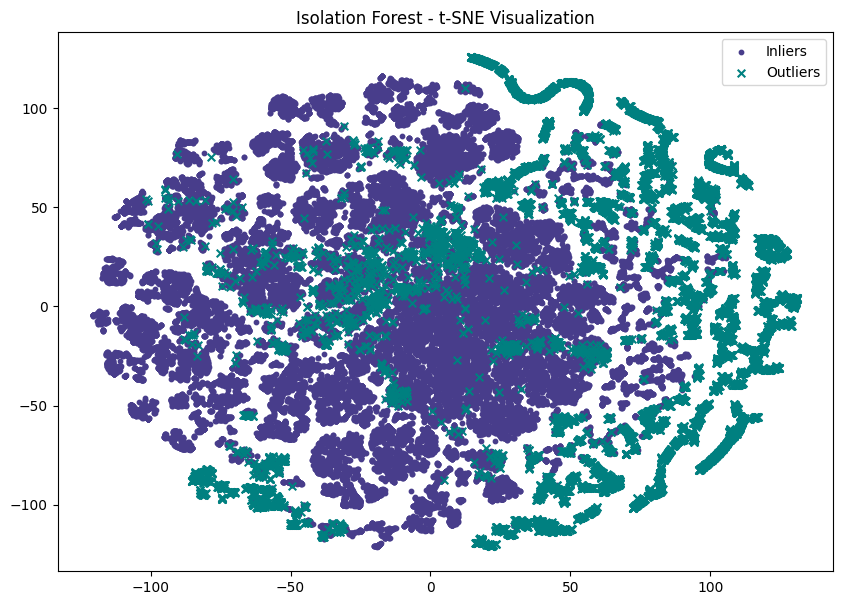

In [644]:
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(Xsample)

y_pred_tsne = iso_modelF.predict(Xsample)
y_pred_tsne = np.where(y_pred_tsne == -1, 1, 0)

plt.figure(figsize=(10, 7))
plt.scatter(X_tsne[y_pred_tsne == 0][:, 0], X_tsne[y_pred_tsne == 0][:, 1], c='#483D8B', label='Inliers', s=10)
plt.scatter(X_tsne[y_pred_tsne == 1][:, 0], X_tsne[y_pred_tsne== 1][:, 1], c='#008080', label='Outliers', s=30, marker='x')
plt.title('Isolation Forest - t-SNE Visualization')
plt.legend()
plt.show()

One Class SVM


In [646]:
'''#X_pca
X_train_norm = Xsample1[ysample1 == 0]
ocSVM = OneClassSVM(kernel='rbf', gamma=0.001, nu=0.01)
ocSVM.fit(X_train_norm)'''

"#X_pca\nX_train_norm = Xsample1[ysample1 == 0]\nocSVM = OneClassSVM(kernel='rbf', gamma=0.001, nu=0.01)\nocSVM.fit(X_train_norm)"

In [647]:
'''y_pred_train=ocSVM.predict(X_train_norm)
y_pred_test = ocSVM.predict(x_test_iso1)
y_pred_train = np.where(y_pred_train == -1, 1, 0)
y_pred_test = np.where(y_pred_test == -1, 1, 0)'''

'y_pred_train=ocSVM.predict(X_train_norm)\ny_pred_test = ocSVM.predict(x_test_iso1)\ny_pred_train = np.where(y_pred_train == -1, 1, 0)\ny_pred_test = np.where(y_pred_test == -1, 1, 0)'

In [648]:
'''print("Confusion Matrix:\n", confusion_matrix(y_test_iso1, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test_iso1, y_pred_test, digits=4))'''

'print("Confusion Matrix:\n", confusion_matrix(y_test_iso1, y_pred_test))\nprint("\nClassification Report:\n", classification_report(y_test_iso1, y_pred_test, digits=4))'

In [649]:
'''scores = -ocSVM.decision_function(Xsample1)  # decision_function(Xsample) returns the anomaly score for each sample(higher==more anomalous)

plt.figure(figsize=(10, 5))
plt.hist(scores, bins=50, color='#483D8B')
plt.axvline(np.percentile(scores, 95), color='#008080', linestyle='--', label='Anomaly threshold')
plt.title('Distribution of Anomaly Scores')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()'''

"scores = -ocSVM.decision_function(Xsample1)  # decision_function(Xsample) returns the anomaly score for each sample(higher==more anomalous)\n\nplt.figure(figsize=(10, 5))\nplt.hist(scores, bins=50, color='#483D8B')\nplt.axvline(np.percentile(scores, 95), color='#008080', linestyle='--', label='Anomaly threshold')\nplt.title('Distribution of Anomaly Scores')\nplt.xlabel('Anomaly Score')\nplt.ylabel('Frequency')\nplt.legend()\nplt.show()"

In [650]:
'''scores=-ocSVM.decision_function(x_test_iso1)
precision, recall, _ = precision_recall_curve(y_test_iso1, scores)  # Using y_test_iso as the ground truth
plt.figure(figsize=(10, 7))
plt.plot(recall, precision, color='#483D8B')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()'''

"scores=-ocSVM.decision_function(x_test_iso1)\nprecision, recall, _ = precision_recall_curve(y_test_iso1, scores)  # Using y_test_iso as the ground truth\nplt.figure(figsize=(10, 7))\nplt.plot(recall, precision, color='#483D8B')\nplt.title('Precision-Recall Curve')\nplt.xlabel('Recall')\nplt.ylabel('Precision')\nplt.show()"

The Precision-Recall curve helps us understand how well our model identifies the positive class, especially in imbalanced datasets like fraud detection. The higher the curve, the better the model

in this case :
Although the Precision-Recall curve is plotted, it does not provide meaningful insight in this case due to the extremely low precision across most recall values.**This indicates the model struggles to correctly identify anomalies**, and the curve does not reflect good classification performance.

In [651]:
'''fpr, tpr, _ = roc_curve(y_test_iso1, scores)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='#008080', label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()'''


"fpr, tpr, _ = roc_curve(y_test_iso1, scores)\nroc_auc = auc(fpr, tpr)\nplt.figure(figsize=(8, 6))\nplt.plot(fpr, tpr, color='#008080', label=f'AUC = {roc_auc:.2f}')\nplt.plot([0, 1], [0, 1], color='navy', linestyle='--')\nplt.title('ROC Curve')\nplt.xlabel('False Positive Rate')\nplt.ylabel('True Positive Rate')\nplt.legend()\nplt.show()"

As shown in the ROC plot, the curve's close proximity to the top-left corner and high AUC value suggest the classifier has strong discriminatory power between positive and negative classes

In [652]:
#X_res
X_train_norm = Xsample[ysample == 0]
ocSVM = OneClassSVM()
ocSVM.fit(X_train_norm)

OneClassSVM()

In [654]:
y_pred_train=ocSVM.predict(X_train_norm)
y_pred_test = ocSVM.predict(x_test_iso)
y_pred_train = np.where(y_pred_train == -1, 1, 0)
y_pred_test = np.where(y_pred_test == -1, 1, 0)

In [ ]:
print("Confusion Matrix:\n", confusion_matrix(y_test_iso, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test_iso, y_pred_test, digits=4))

Now we will tune the model's parameters to achieve better performance and higher evaluation scores

In [ ]:
'''param_grid = {
    'nu': np.arange(0.0001, 0.5, 0.005),
    'gamma': [0.001],
    'kernel': ['rbf']
}

oc_svm = OneClassSVM()
grid_search = GridSearchCV(oc_svm, param_grid, scoring='f1', cv=3)

grid_search.fit(X_train_norm)

print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)'''

In [ ]:
'''kernel=['linear', 'poly', 'rbf', 'sigmoid']
gamma=['scale','auto',0.1,0.2,.3,.4]
nu=[0.1,.2,.3,.4,.5,.6,.7,.8,.9]
best_Score=0
best_prarm={}

for k in kernel:
  for g in gamma:
    for n in nu :
      model=OneClassSVM(kernel=k,gamma=g,nu=n)
      model.fit(X_train_norm)
      y_pred_test = model.predict(x_test_iso)
      y_pred_test = np.where(y_pred_test == -1, 1, 0)
      score = f1_score(y_test_iso, y_pred_test, pos_label=1)
      if score> best_Score:
        best_Score=score
        best_prarm={'kernel':k,'gamma':g,'nu':n}'''


**The runtime took more than 1 hour and 30 minutes, so we could not rely on it. For this reason, we performed manual parameter search instead**

In [655]:
#X_res
ocSVM = OneClassSVM(kernel='rbf',gamma=0.01)
ocSVM.fit(X_train_norm)

y_pred_test = ocSVM.predict(x_test_iso)
y_pred_test = np.where(y_pred_test == -1, 1, 0)

print("Confusion Matrix:\n", confusion_matrix(y_test_iso, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test_iso, y_pred_test, digits=4))

Confusion Matrix:
 [[90712 91249]
 [ 3875 68909]]

Classification Report:
               precision    recall  f1-score   support

           0     0.9590    0.4985    0.6560    181961
           1     0.4303    0.9468    0.5916     72784

    accuracy                         0.6266    254745
   macro avg     0.6946    0.7226    0.6238    254745
weighted avg     0.8080    0.6266    0.6376    254745



Kernel:
1. linear :  0.4668 score that indecates our dataset is not linear
2. poly : 0.4953
3. rpf : 0.5005
4. sigmoid : 0.5009

In [656]:
oc_svm = OneClassSVM(kernel='rbf', gamma=0.001, nu=0.01)
oc_svm.fit(X_train_norm)

OneClassSVM(gamma=0.001, nu=0.01)

In [657]:
y_pred_train=ocSVM.predict(X_train_norm)
y_pred_test = ocSVM.predict(x_test_iso)
y_pred_train = np.where(y_pred_train == -1, 1, 0)
y_pred_test = np.where(y_pred_test == -1, 1, 0)

In [658]:
print("Confusion Matrix:\n", confusion_matrix(y_test_iso, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test_iso, y_pred_test, digits=4))

Confusion Matrix:
 [[90712 91249]
 [ 3875 68909]]

Classification Report:
               precision    recall  f1-score   support

           0     0.9590    0.4985    0.6560    181961
           1     0.4303    0.9468    0.5916     72784

    accuracy                         0.6266    254745
   macro avg     0.6946    0.7226    0.6238    254745
weighted avg     0.8080    0.6266    0.6376    254745



              precision    recall  f1-score   support

           0       0.96      0.50      0.66    181961
           1       0.43      0.95      0.59     72784

    accuracy                           0.63    254745
   macro avg       0.69      0.72      0.62    254745
weighted avg       0.81      0.63      0.64    254745

[[90712 91249]
 [ 3875 68909]]


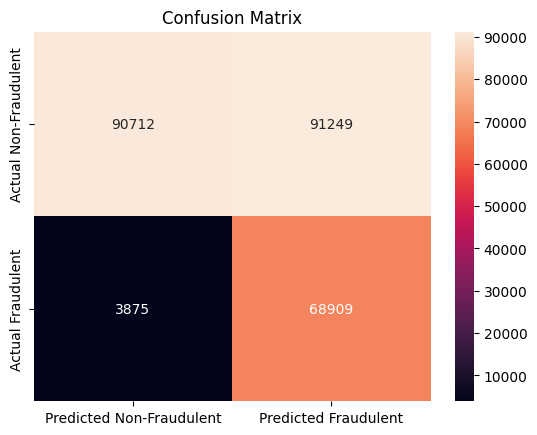

In [659]:
print(classification_report(y_test_iso, y_pred_test))
print(confusion_matrix(y_test_iso, y_pred_test))
cm=confusion_matrix(y_test_iso, y_pred_test)
cmdf=pd.DataFrame(cm,columns=['Predicted Non-Fraudulent','Predicted Fraudulent'],index=['Actual Non-Fraudulent','Actual Fraudulent'])
sns.heatmap(cmdf,annot=True,fmt='d')
plt.title('Confusion Matrix')
plt.show()

In [660]:
print((np.unique(y_pred_test)))


[0 1]


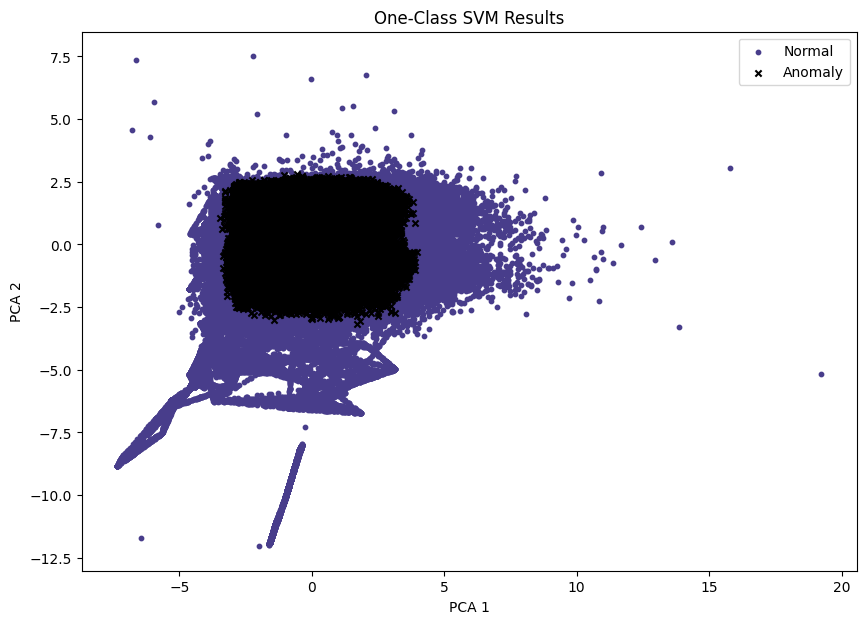

In [661]:
plt.figure(figsize=(10, 7))
plt.scatter(x_test_iso[y_pred_test == 1][:, 0], x_test_iso[y_pred_test == 1][:, 1], c='#483D8B', s=10, label='Normal')
plt.scatter(x_test_iso[y_pred_test == 0][:, 0], x_test_iso[y_pred_test == 0][:, 1], c='k', s=20, marker='x', label='Anomaly')
plt.title("One-Class SVM Results")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

This code visualizes the decision boundary of a One-Class SVM model, showing which areas the model considers normal (inside the red boundary) and which are classified as anomalies (outside the red boundary).

Confusion Matrix:
 [[180073   1888]
 [ 39635  33149]]

Classification Report:
               precision    recall  f1-score   support

           0     0.8196    0.9896    0.8966    181961
           1     0.9461    0.4554    0.6149     72784

    accuracy                         0.8370    254745
   macro avg     0.8829    0.7225    0.7558    254745
weighted avg     0.8557    0.8370    0.8161    254745



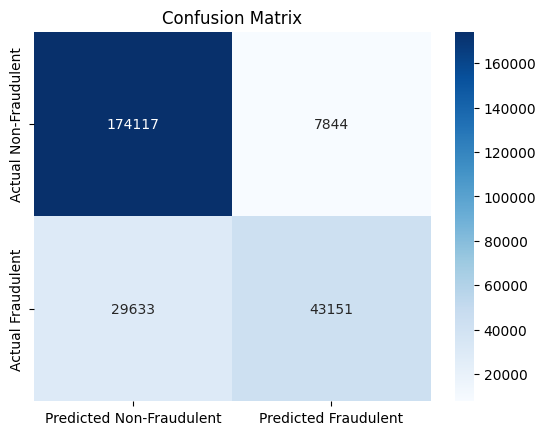

In [665]:
X_train_norm = Xsample[ysample == 0]
oc_svm = OneClassSVM(kernel='rbf', gamma=0.001, nu=0.01)
oc_svm.fit(X_train_norm)

y_pred_test = oc_svm.predict(x_test_iso)
y_pred_mapped = np.where(y_pred_test == -1, 1, 0)

print("Confusion Matrix:\n", confusion_matrix(y_test_iso, y_pred_mapped))
print("\nClassification Report:\n", classification_report(y_test_iso, y_pred_mapped, digits=4))

cm=confusion_matrix(y_test_iso, y_pred_f)
cmdf=pd.DataFrame(cm,columns=['Predicted Non-Fraudulent','Predicted Fraudulent'],index=['Actual Non-Fraudulent','Actual Fraudulent'])
sns.heatmap(cmdf,annot=True,fmt='d',cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

In [673]:
X=x_test_iso[:, :2]
ocsvm=OneClassSVM(kernel='rbf', gamma=.001, nu=0.01)
ocsvm.fit(X)

OneClassSVM(gamma=0.001, nu=0.01)

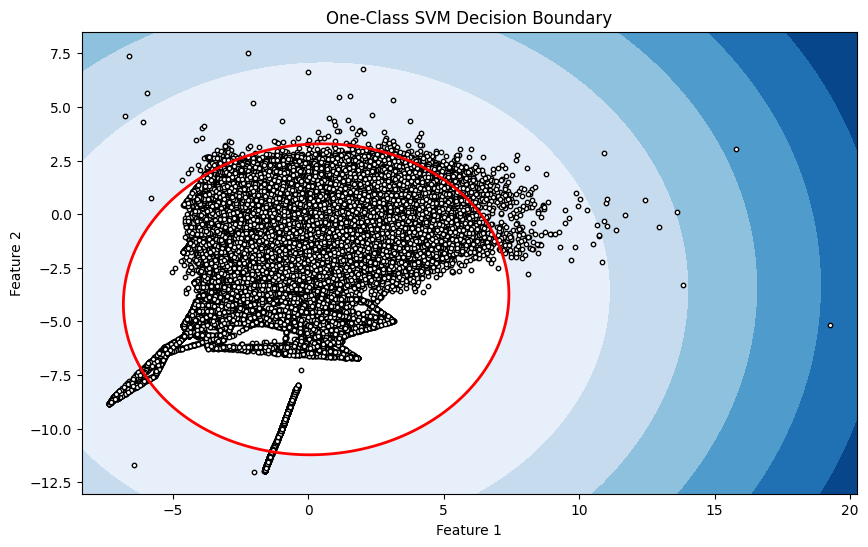

In [674]:
xx, yy=np.meshgrid(np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 500),
                     np.linspace(X[:, 1].min() - 1, X[:, 1].max() + 1, 500))
Z=ocsvm.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z=Z.reshape(xx.shape)
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.Blues_r)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='red') #actual decision boundary
plt.scatter(X[:, 0], X[:, 1], c='white', s=10, edgecolor='k')
plt.title("One-Class SVM Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

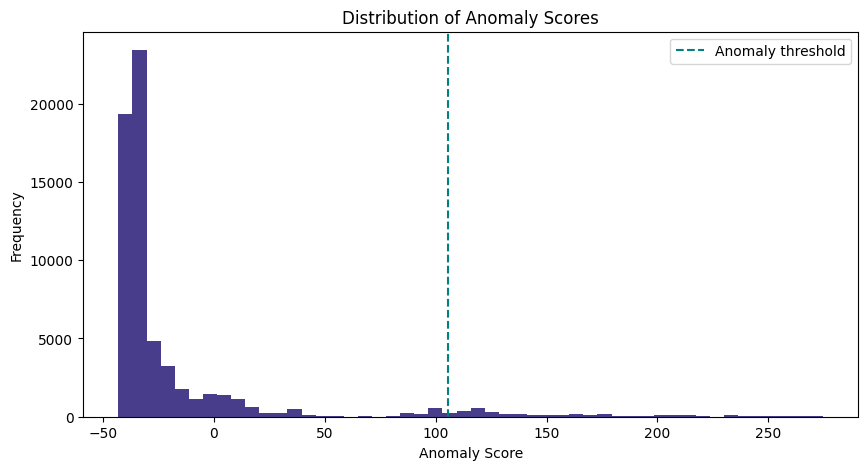

In [666]:
scores = -oc_svm.decision_function(Xsample)  # decision_function(Xsample) returns the anomaly score for each sample(higher==more anomalous)

plt.figure(figsize=(10, 5))
plt.hist(scores, bins=50, color='#483D8B')
plt.axvline(np.percentile(scores, 95), color='#008080', linestyle='--', label='Anomaly threshold')
plt.title('Distribution of Anomaly Scores')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()

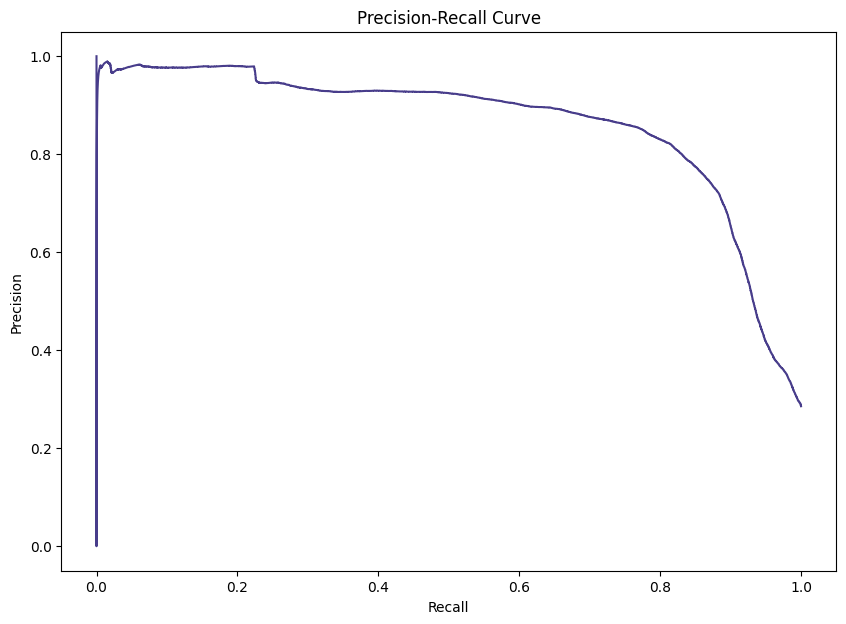

In [667]:
scores=-ocSVM.decision_function(x_test_iso)
precision, recall, _ = precision_recall_curve(y_test_iso1, scores)  # Using y_test_iso as the ground truth
plt.figure(figsize=(10, 7))
plt.plot(recall, precision, color='#483D8B')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

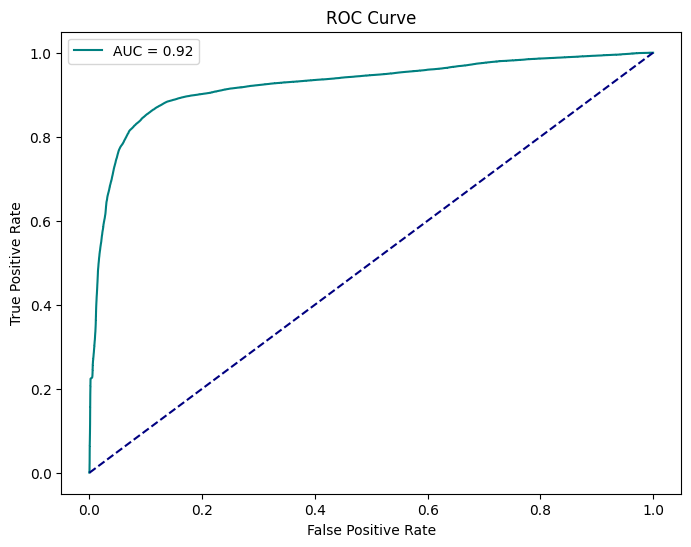

In [672]:
fpr, tpr, _ = roc_curve(y_test_iso, scores)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='#008080', label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()